### Libraries import

In [ ]:
import csv
import math
import copy
import numpy as np
import pandas as pd
import random as rd
from tqdm import tqdm
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection, LineCollection

In [ ]:
import warnings
warnings.filterwarnings("ignore")

### Spread function

In [ ]:
def graph_generation(graph_type:str,
                     number_of_nodes:int, 
                     BA_connect:int = None, 
                     ER_prob:float = None, 
                     CL_average:int = None):
  if graph_type == 'BA':
    G = nx.barabasi_albert_graph(number_of_nodes, BA_connect)
  elif graph_type == 'ER':
    G = nx.erdos_renyi_graph(number_of_nodes, ER_prob)
  elif graph_type == 'CL':
    # Model's Parameters: Generate a random Chung-Lu graph with average degree d, max degree m, and power-law degree distribution with exponent gamma
    # Source: https://github.com/ftudisco/scalefreechunglu/blob/master/python/example.py
    n = number_of_nodes
    gamma = 2.2
    m = n ** 0.4
    d = CL_average
    p = 1/(gamma-1)
    c = (1-p)*d*(n**p)
    i0 = (c/m)**(1/p) - 1
    w = [c/((i+i0)**p) for i in range(n)]
    G = nx.expected_degree_graph(w)
  else:
    print("Wrong graph_type. Choose BA, ER or CL.")
  print(G.size())

  return G

In [ ]:
# Set parametrization for the graphs
number_of_days = 10000
number_of_nodes = 2500
new_grains = []
BA_connect = 1
ER_prob = 0.0016
CL_average = 10

In [ ]:
# Function for generation of coordinates for new grains
# It can create more or less than one grain per round,
# if you switch it to the exponential or pareto mode
def grain_generator(number_of_nodes, number_of_days, dist = 'uni'):
  new_grains = []
  if dist == 'uni':
    for d in range(number_of_days):
      grain = np.random.randint(number_of_nodes)
      new_grains.append([grain])
  elif dist == 'expon':
    num_of_grains = np.around(np.random.exponential(size = number_of_days))
    for d in range(number_of_days):
      grains = []
      for g in range(int(num_of_grains[d]) + 1):
        grain = np.random.randint(number_of_nodes)
        grains.append(grain)
      new_grains.append(grains)
  elif dist == 'par':
    num_of_grains = np.around(np.random.pareto(a = 2, size = number_of_days))
    for d in range(number_of_days):
      grains = []
      for g in range(int(num_of_grains[d]) + 1):
        grain = np.random.randint(number_of_nodes)
        grains.append(grain)
      new_grains.append(grains)
  else:
    print('Check available distributions.')
  return new_grains

In [ ]:
# Generation of the base list for coordinates of the new grains
new_grains = grain_generator(number_of_nodes, number_of_days)

In [ ]:
# Generation of the additional list for coordinates of the new grains on the exponential distribution
new_grains_exp = grain_generator(number_of_nodes, number_of_days, 'expon')

In [ ]:
# Generation of the additional list for coordinates of the new grains on the Pareto distribution
new_grains_par = grain_generator(number_of_nodes, number_of_days, 'par')

In [ ]:
# Set additional parametrization in case of higher dissipation from the system
new_grains_plus = grain_generator(number_of_nodes, number_of_days)
new_grains_minus = grain_generator(number_of_nodes, number_of_days)

In [ ]:
# Function for calculation of number of sand grains in and out of the model
def counter(G, number_of_days, new_grains, new_grains_plus, new_grains_minus):
  inner = []
  outer = []
  total = []
  d = 0

  final_status = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')
  for column in final_status:
    d += 1
    total_d = 0
    inner.append(np.sum(final_status[column]))
    for i in range(d):
      total_d += len(new_grains[i])
    if new_grains_plus != None:
      for i in range(d):
        total_d += len(new_grains_plus[i])
    if new_grains_minus != None:
      for i in range(d):
        total_d -= len(new_grains_minus[i])
    outer.append(total_d - np.sum(final_status[column]))

  return inner, outer

In [ ]:
# Function for modelling of spread for Bak-Tang-Wiesenfeld, Manna, Feders
# and stochastic Feders base and facilitated models on cellular automatons.
# Also there is a possibility to change the regime of the system from +1 
# each turn to +2-1, which partially changes behaviour of the system,
# or to +1-1, which allows to avoid most of the falls.
# Another adjustment to the pumping algorithm was the addition of exponential
# distribution of the number of new grains on each turn.
def spread(model:str,
           G,
           number_of_days:int,
           new_grains:list,
           graph_type:int,
           facilitated:bool = False,
           ad_dissipation:bool = False,
           neutral_state:bool = False,
           expon:bool = False,
           par:bool = False,
           new_grains_plus:list = None,
           new_grains_minus: list = None,
           ):

  inner = []
  outer = []
  falls = []
  ones = []
  deg = []

  degrees = [[node, val]  for (node, val) in G.degree()]
  for degree in degrees:
    deg.append(degree[1])
    if degree[1] == 1:
      ones.append(degree[0])

  status = pd.DataFrame()
  for j in range(0, number_of_days):
    status['ill'+str(j)] = np.zeros(G.number_of_nodes())

  node_attr = status.to_dict('index')
  nx.set_node_attributes(G, node_attr)

  if facilitated == True:
    facilit_list = [[0 for x in range(G.number_of_nodes())] for z in range(number_of_days)]

  for d in tqdm(range(0, number_of_days-1)):
    falls_d = 0
    if ad_dissipation == True:
      for node in G.nodes(data=True):
        if node[0] in new_grains[d]:
          node[1]['ill'+str(d)] += 1.0
        if node[0] in new_grains_plus[d]:
          node[1]['ill'+str(d)] += 1.0
        if node[0] in new_grains_minus[d]:
          node[1]['ill'+str(d)] -= 1.0          
        node[1]['ill'+str(d+1)] += node[1]['ill'+str(d)]
    elif neutral_state == True:
      for node in G.nodes(data=True):
        if node[0] in new_grains[d]:
          node[1]['ill'+str(d)] += 1.0
        if node[0] in new_grains_minus[d]:
          node[1]['ill'+str(d)] -= 1.0          
        node[1]['ill'+str(d+1)] += node[1]['ill'+str(d)]    
    else:
      for node in G.nodes(data=True):
        if node[0] in new_grains[d]:
          node[1]['ill'+str(d)] += 1.0
        node[1]['ill'+str(d+1)] += node[1]['ill'+str(d)]
    for node in G.nodes(data=True):
      if facilitated == False:
        if d <= (number_of_days-1) and node[1]['ill'+str(d)] >= deg[node[0]] and deg[node[0]] > 0:
          if model == "BTW":
            G, falls_d = BTW(G, ones, falls_d, d, node, deg[node[0]])
          if model == "MA":
            G, falls_d = MA(G, ones, falls_d, d, node, deg[node[0]])
          if model == "FE":
            G, falls_d = FE(G, ones, falls_d, d, node, deg[node[0]])    
          if model == "SFE":
            G, falls_d = SFE(G, ones, falls_d, d, node, deg[node[0]])
      else:
        if d<=(number_of_days-1) and (node[1]['ill'+str(d)] >= deg[node[0]] or facilit_list[d][node[0]] >= 2) and deg[node[0]] > 0:
          if model == "BTW":
            G, facilit_list, falls_d = BTW_fa(G, facilit_list, ones, falls_d, d, node, deg[node[0]])
          if model == "MA":
            G, facilit_list, falls_d = MA_fa(G, facilit_list, ones, falls_d, d, node, deg[node[0]])
          if model == "FE":
            G, facilit_list, falls_d = FE_fa(G, facilit_list, ones, falls_d, d, node, deg[node[0]])    
          if model == "SFE":
            G, facilit_list, falls_d = SFE_fa(G, facilit_list, ones, falls_d, d, node, deg[node[0]])

    if d <= number_of_days-2:
      falls.append(falls_d)
  inner, outer = counter(G, d, new_grains, new_grains_plus, new_grains_minus)

  # print(inner)
  # print(outer)
  # print(falls)
  data = pd.DataFrame(falls)
  graph_name = model + '_' + graph_type
  if facilitated == True: 
    graph_name = graph_name + '_fa'
  if ad_dissipation == True: 
    graph_name = graph_name + '_ad'
  if neutral_state == True: 
    graph_name = graph_name + '_ns'
  if expon == True:
    graph_name = graph_name + '_exp'
  if par == True: 
    graph_name = graph_name + '_par'  

  data.to_csv('Graph_SOC/' + graph_name + '.csv', index=False)

  fig, axs = plt.subplots(2, 1, figsize=(35, 20))
  axs[0].xaxis.get_major_locator().set_params(integer=True)
  axs[0].yaxis.get_major_locator().set_params(integer=True)
  axs[1].xaxis.get_major_locator().set_params(integer=True)
  axs[1].yaxis.get_major_locator().set_params(integer=True)
  axs[0].set(ylim=(0, number_of_days))
  axs[1].set(ylim=(0, 100))
  axs[0].ticklabel_format(style='plain')
  axs[1].ticklabel_format(style='plain')
  axs[0].plot(list(range(number_of_days)), inner, color='#40a6d1', alpha = 0.5, label = "Inner Grains")
  axs[0].plot(list(range(number_of_days)), outer, color='red', alpha = 0.5, label = "Outer Grains")
  axs[0].legend(loc = 'upper right', fontsize='medium')
  axs[0].set_title('Number of grains in and out of the ' + graph_name + ' model')
  axs[1].plot(list(range(number_of_days-1)), falls, color='#40a6d1', alpha = 0.5)
  axs[1].set_title('Number of falls in the ' + graph_name + ' model')
  plt.setp(axs[0], xlabel='Day', ylabel='Grains')
  plt.setp(axs[1], xlabel='Day', ylabel='Falls')
  plt.tight_layout()
  plt.show()

### Model definition

In [ ]:
def BTW(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        neighbor[1]['ill'+str(d+1)] += 1
  node[1]['ill'+str(d+1)] -= crit

  return G, falls_d

In [ ]:
def BTW_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          neighbor[1]['ill'+str(d+1)] += 1
          facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= crit
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0:
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= crit

  return G, facilit_list, falls_d

In [ ]:
def MA(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    remains = copy.copy(crit)
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        n = rd.randint(0, remains)
        remains -= n
        neighbor[1]['ill'+str(d+1)] += n
  node[1]['ill'+str(d+1)] -= crit

  return G, falls_d

In [ ]:
def MA_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      remains = copy.copy(crit)
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= crit
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= crit

  return G, facilit_list, falls_d

In [ ]:
def FE(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        neighbor[1]['ill'+str(d+1)] += 1
  node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, falls_d

In [ ]:
def FE_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          neighbor[1]['ill'+str(d+1)] += 1
          facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, facilit_list, falls_d

In [ ]:
def SFE(G, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    remains = copy.copy(crit)
    for neighbor in G.nodes(data=True):
      if neighbor[0] in neighbors:
        n = rd.randint(0, remains)
        remains -= n
        neighbor[1]['ill'+str(d+1)] += n
  node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, falls_d

In [ ]:
def SFE_fa(G, facilit_list, ones, falls_d, d, node, crit):
  falls_d += 1
  if node[0] not in ones:
    neighbors = [n for n in G.neighbors(node[0])]
    if node[1]['ill'+str(d)] >= crit:
      remains = copy.copy(crit)
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
    elif node[1]['ill'+str(d)] < crit and node[1]['ill'+str(d)] > 0:
      remains = node[1]['ill'+str(d)]
      for neighbor in G.nodes(data=True):
        if neighbor[0] in neighbors:
          n = rd.randint(0, remains)
          remains -= n
          neighbor[1]['ill'+str(d+1)] += n
          if n > 0 and d+1 <= len(facilit_list):
            facilit_list[d+1][neighbor[0]] += 1
      node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]
  else:
    node[1]['ill'+str(d+1)] -= node[1]['ill'+str(d)]

  return G, facilit_list, falls_d

### Graph Generation

In [ ]:
G_BA = graph_generation(graph_type = "BA", number_of_nodes = number_of_nodes, BA_connect = BA_connect)

2499


In [ ]:
G_ER = graph_generation(graph_type = "ER", number_of_nodes = number_of_nodes, ER_prob = ER_prob)

5033


In [ ]:
G_CL = graph_generation(graph_type = "CL", number_of_nodes = number_of_nodes, CL_average = CL_average)

5225


### Bak-Tang-Wiesenfeld

#### Standart Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:49<00:00, 202.27it/s]


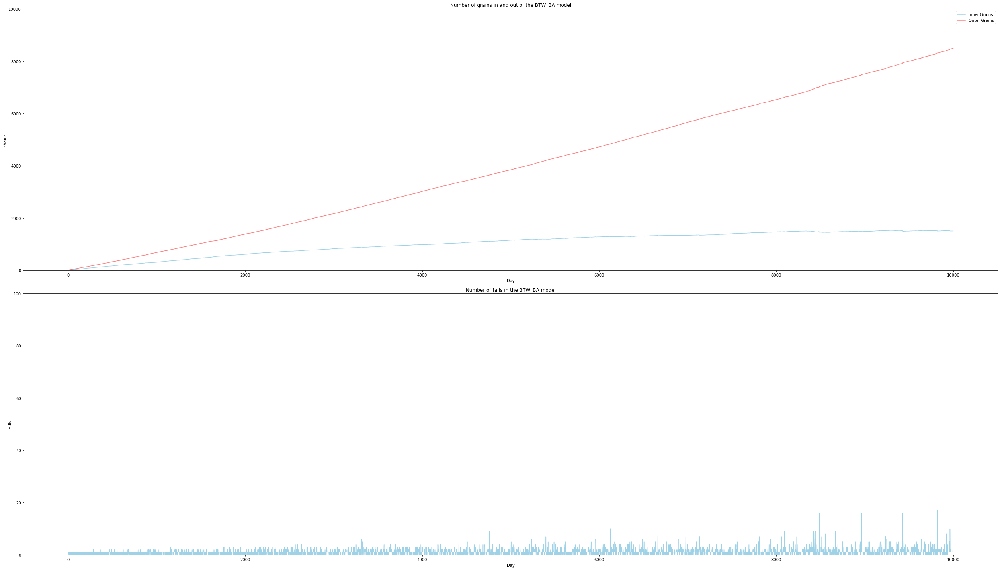

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:14<00:00, 134.29it/s]


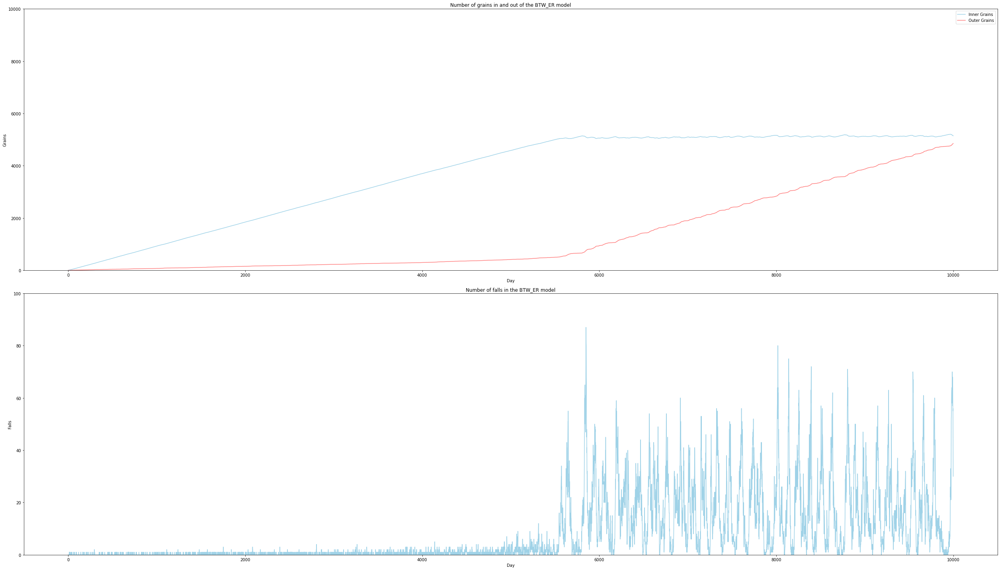

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 182.36it/s]


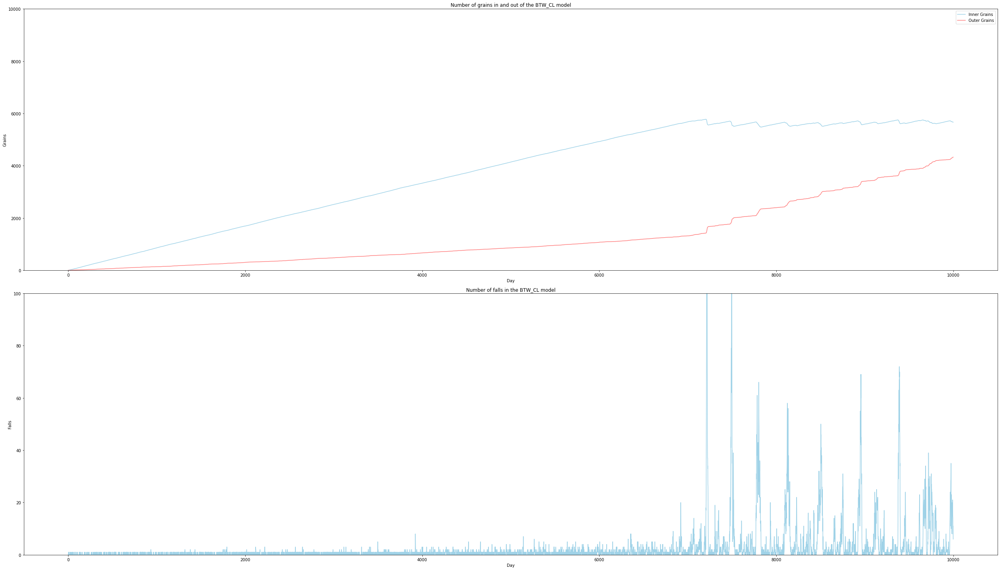

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 182.48it/s]


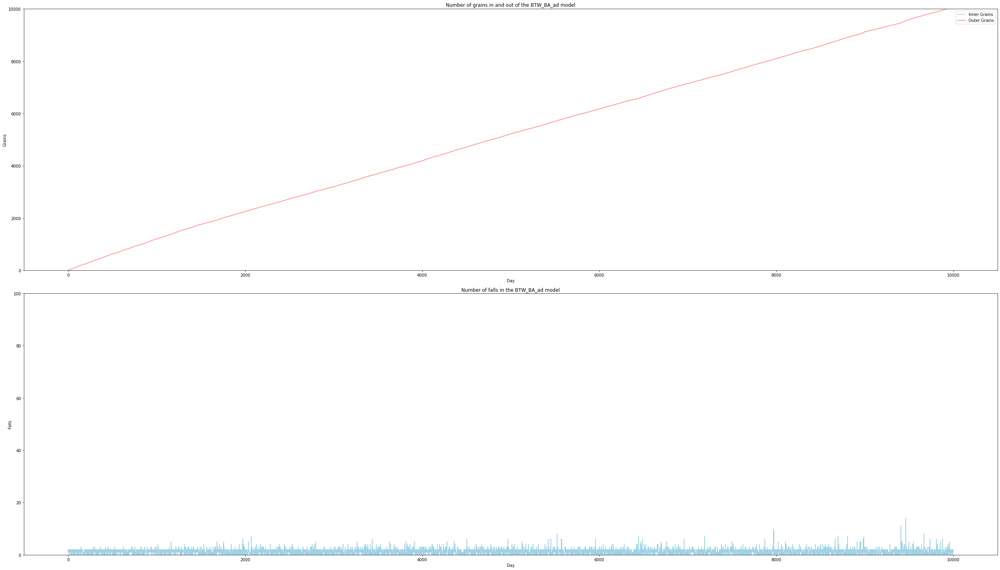

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:19<00:00, 125.00it/s]


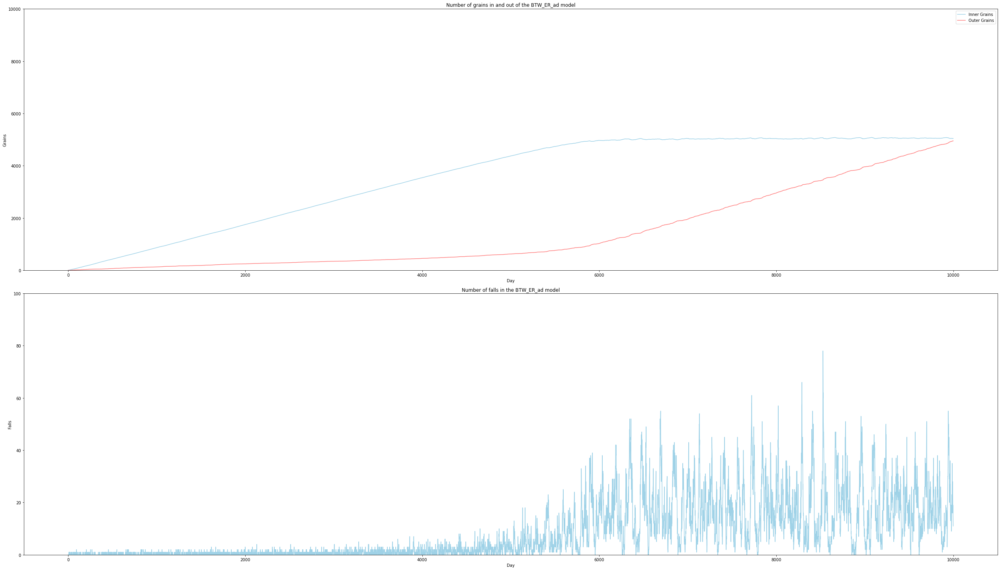

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:01<00:00, 161.82it/s]


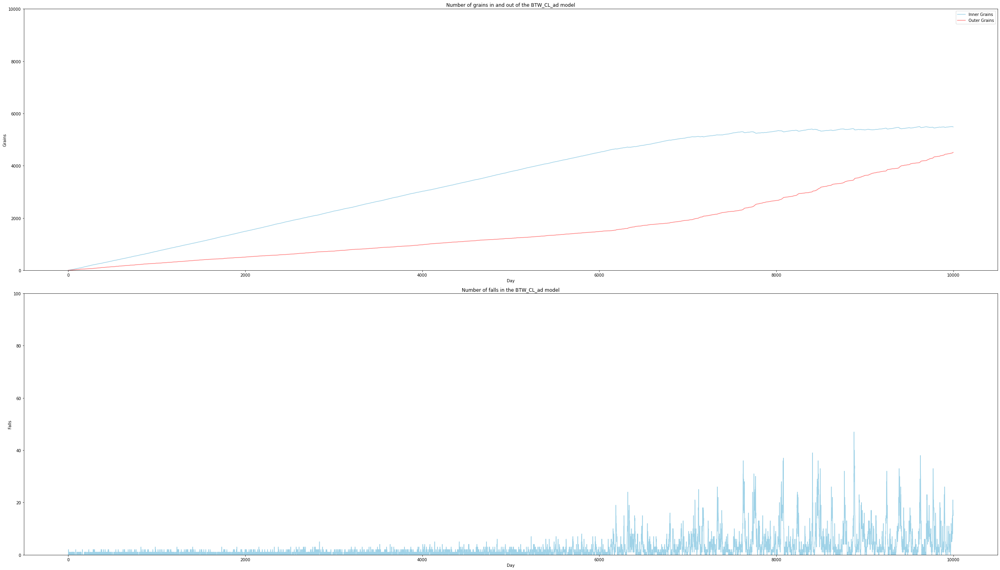

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:52<00:00, 192.21it/s]


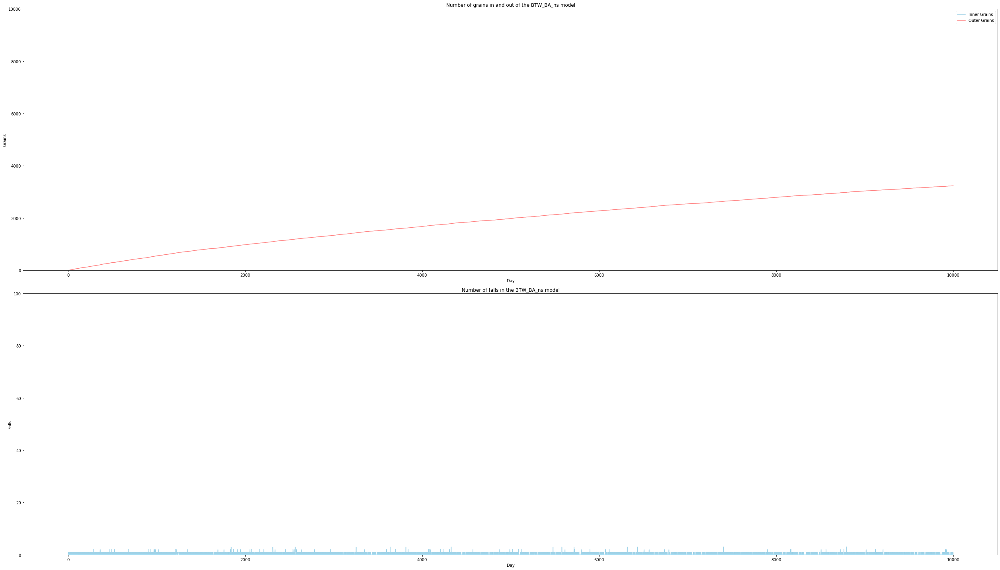

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:51<00:00, 192.44it/s]


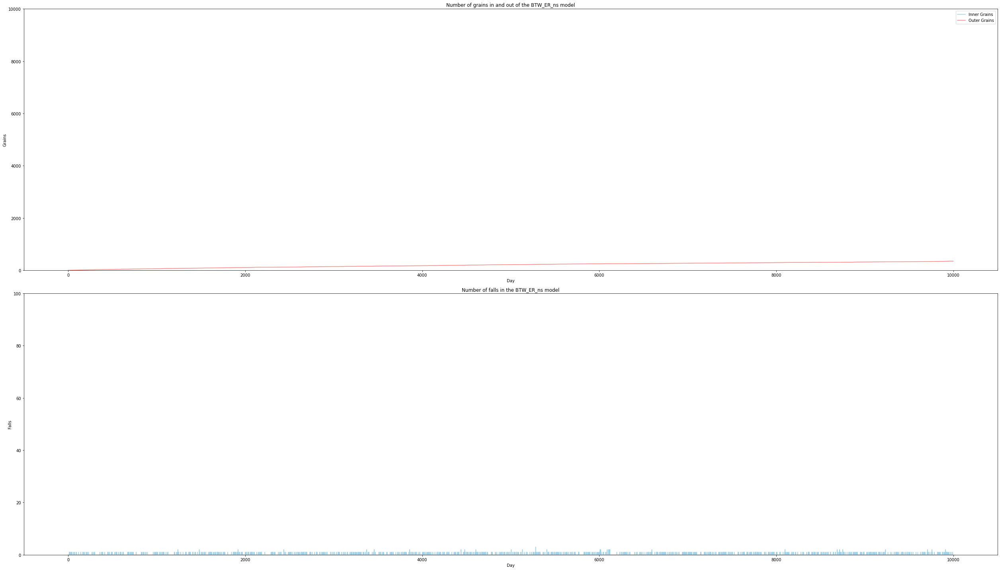

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:52<00:00, 192.18it/s]


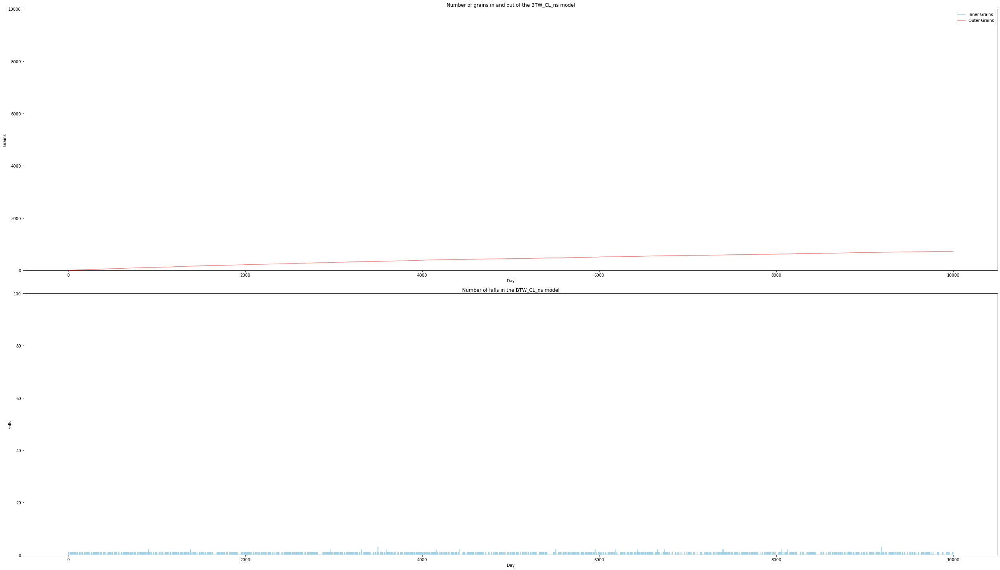

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 196.21it/s]


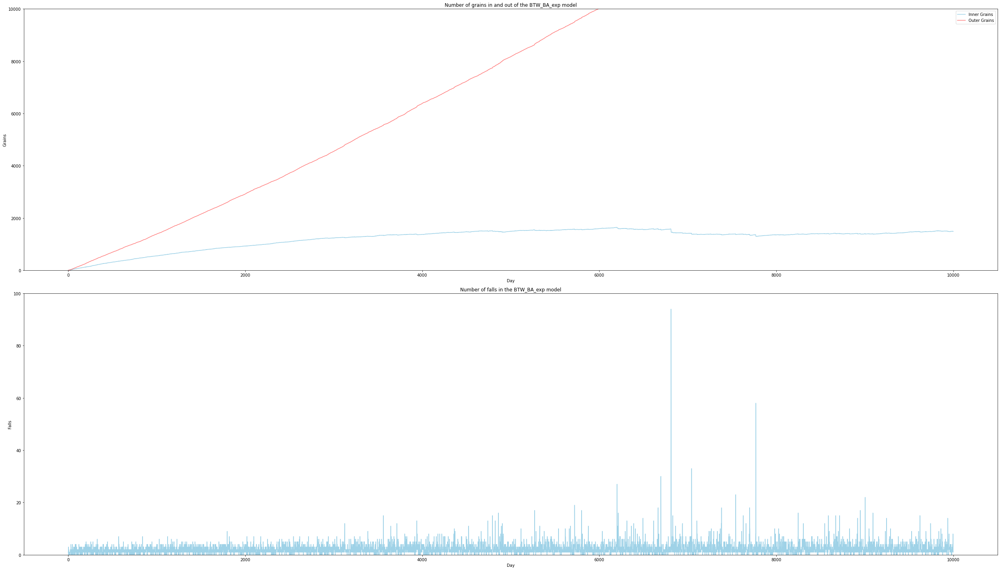

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:07<00:00, 78.61it/s]


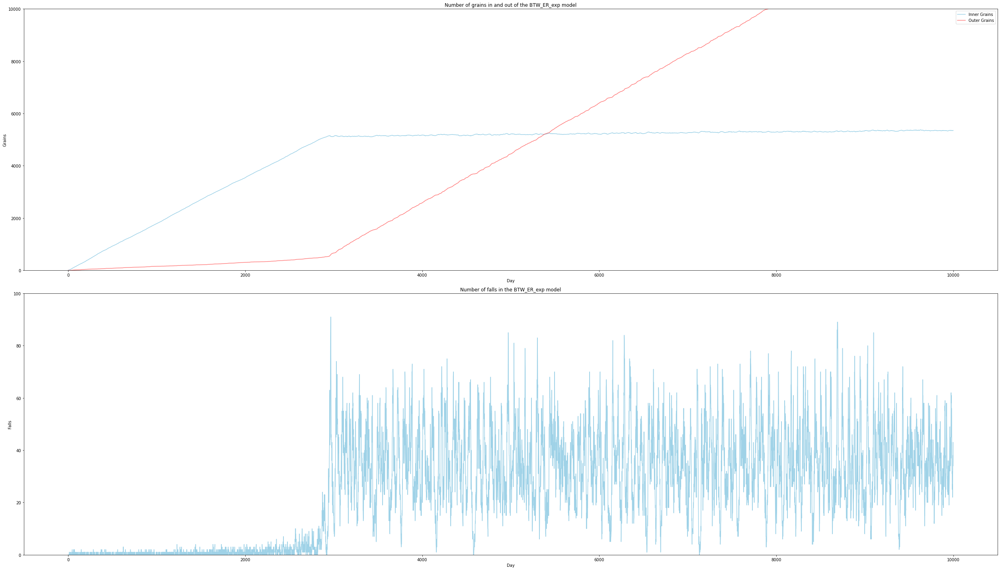

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:14<00:00, 133.91it/s]


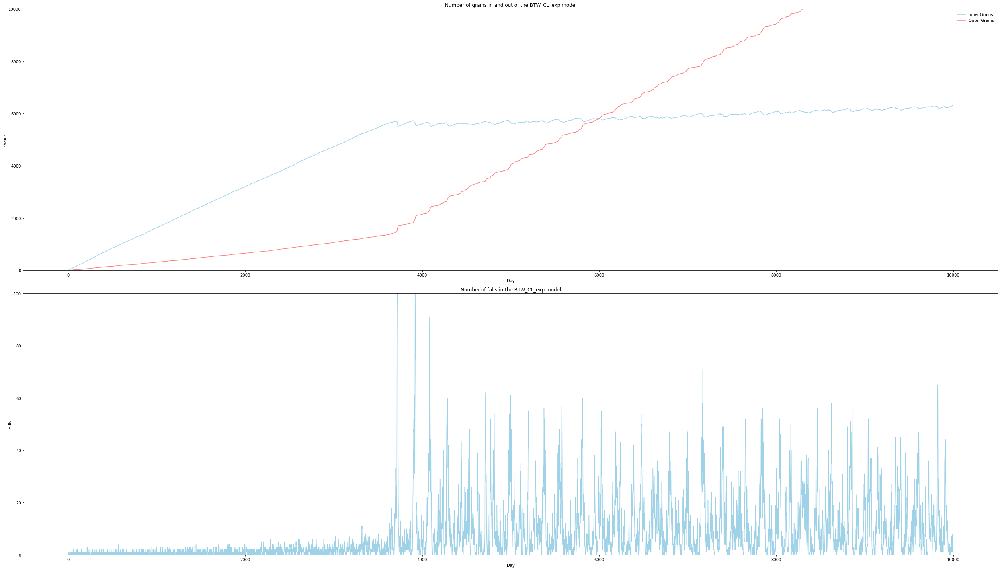

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 197.20it/s]


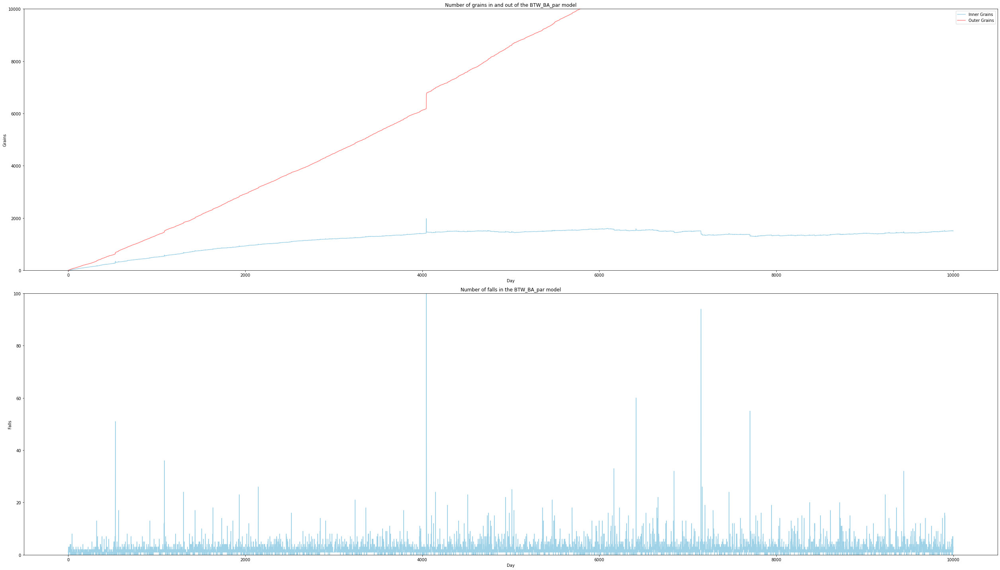

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:09<00:00, 77.48it/s]


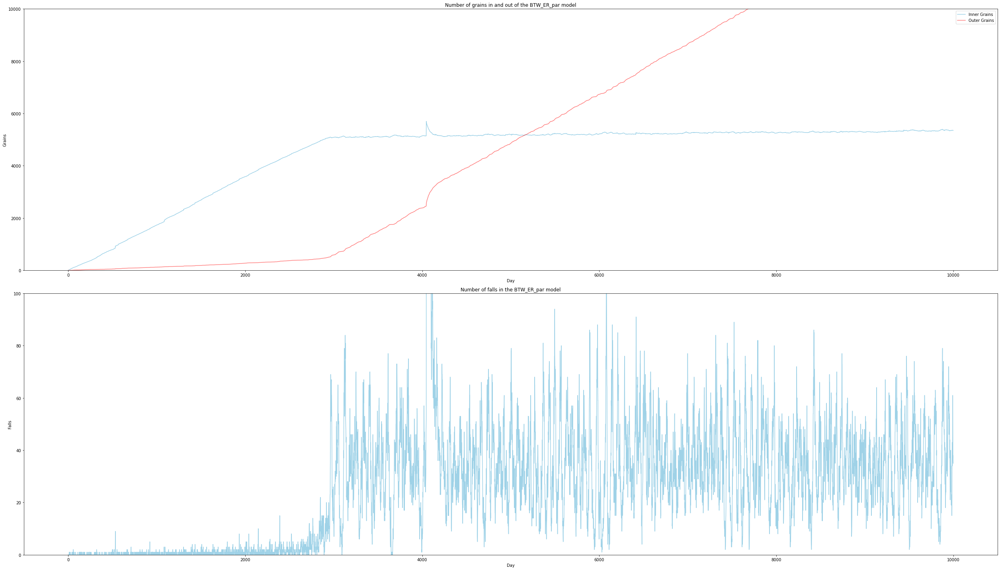

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:13<00:00, 135.77it/s]


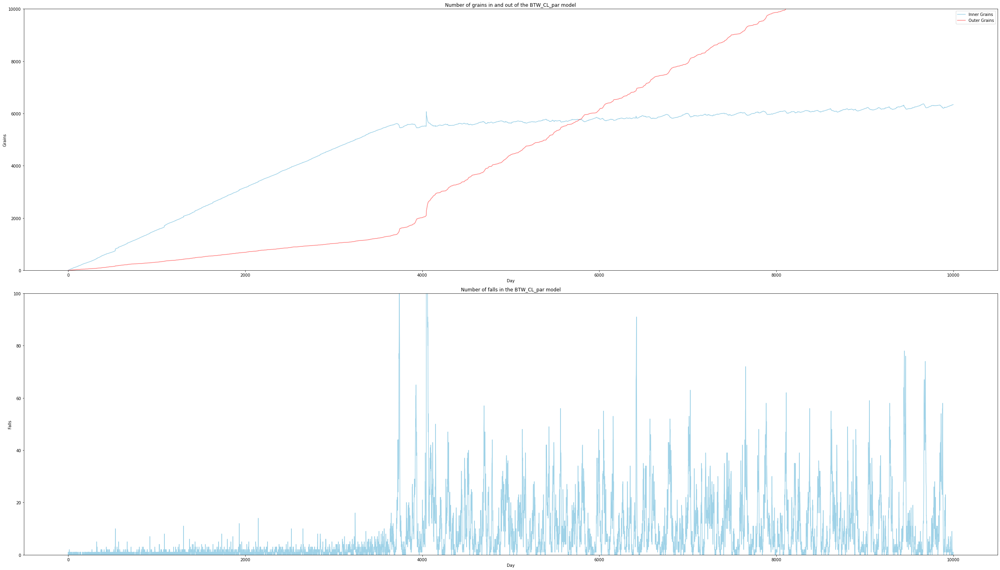

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 187.95it/s]


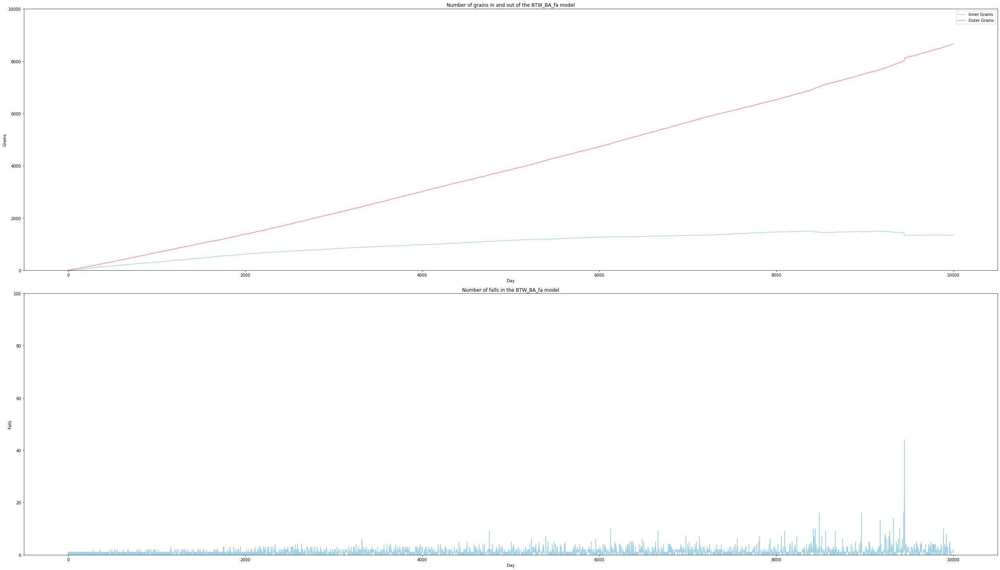

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:17<00:00, 129.37it/s]


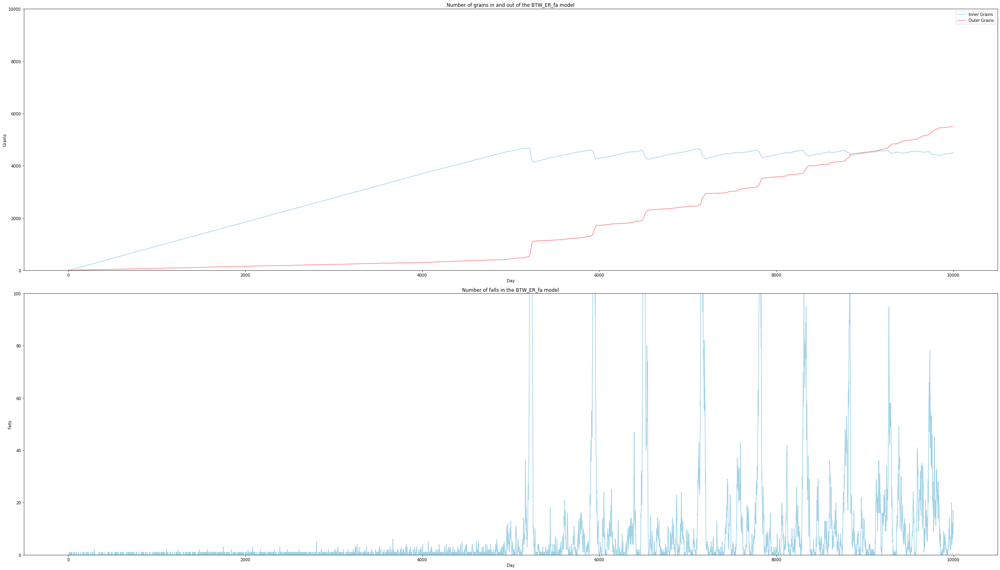

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:11<00:00, 139.25it/s]


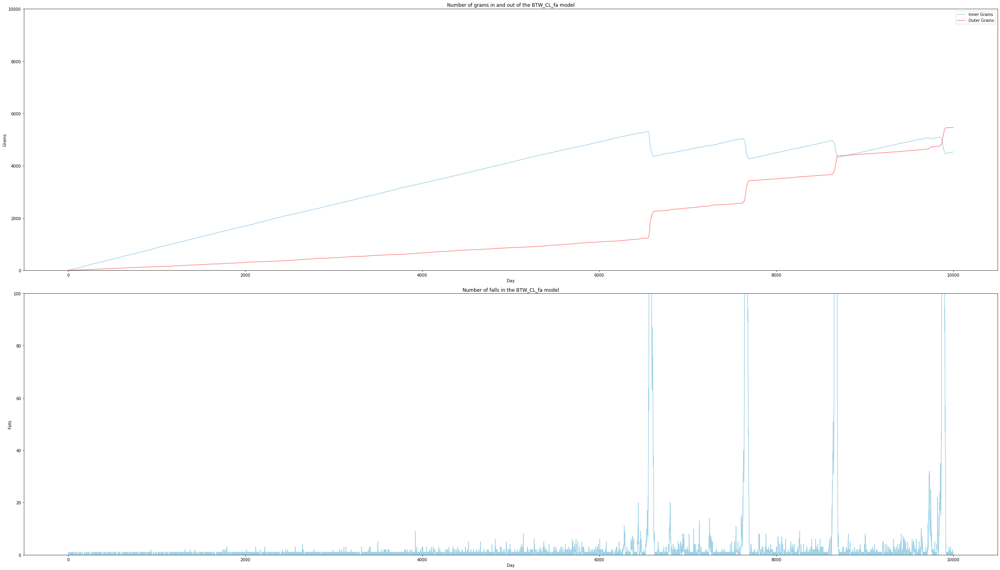

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:58<00:00, 171.60it/s]


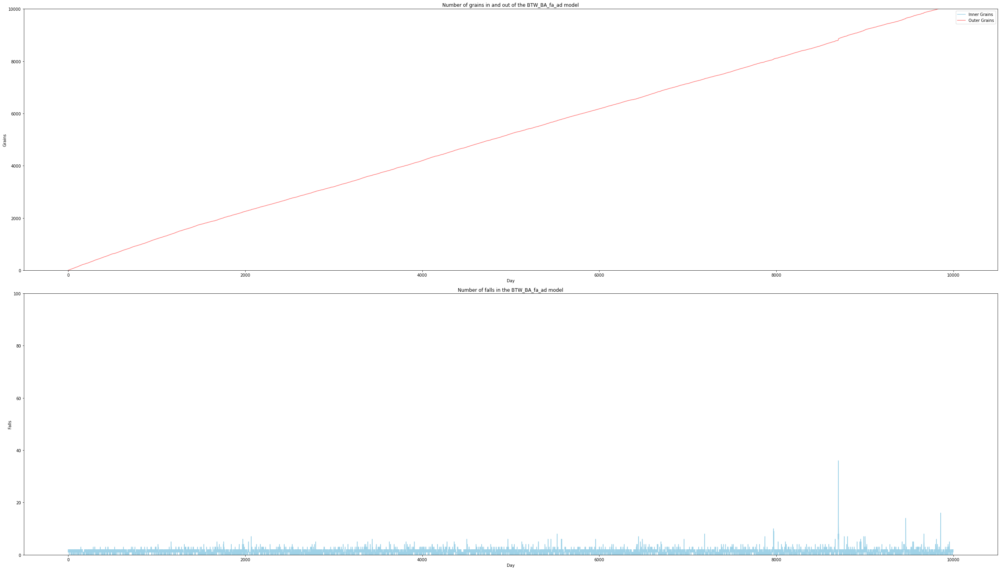

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:22<00:00, 121.71it/s]


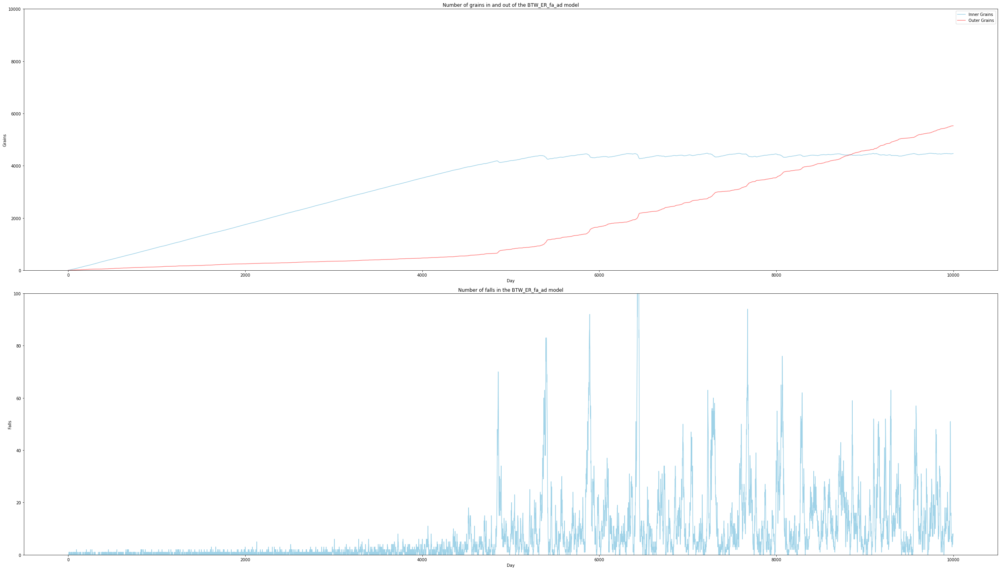

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:17<00:00, 128.60it/s]


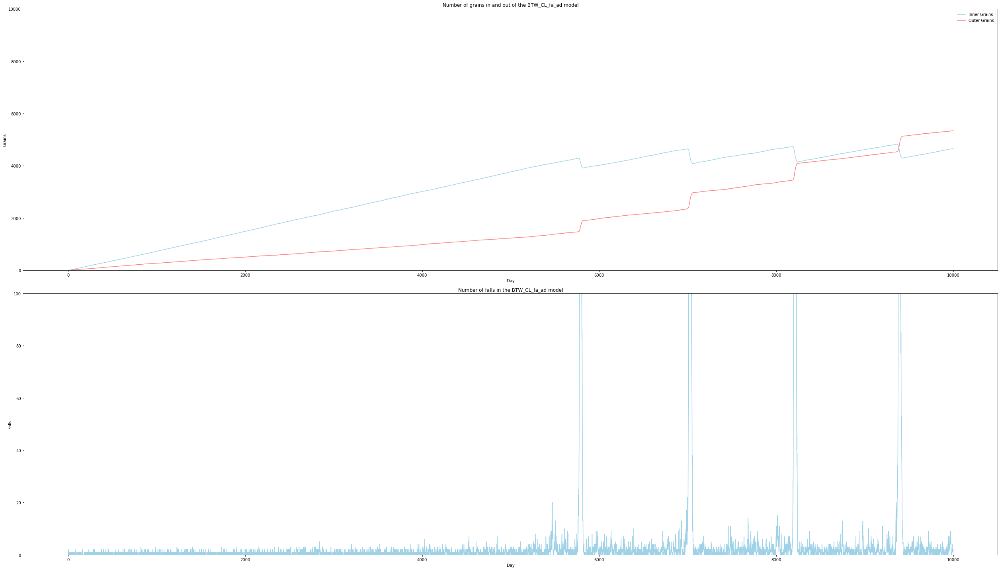

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 181.21it/s]


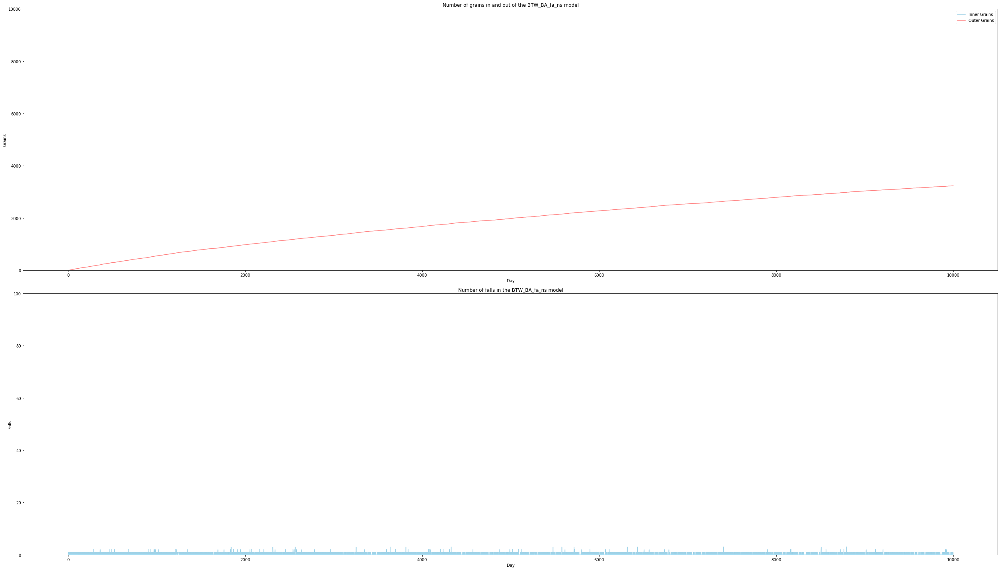

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 180.99it/s]


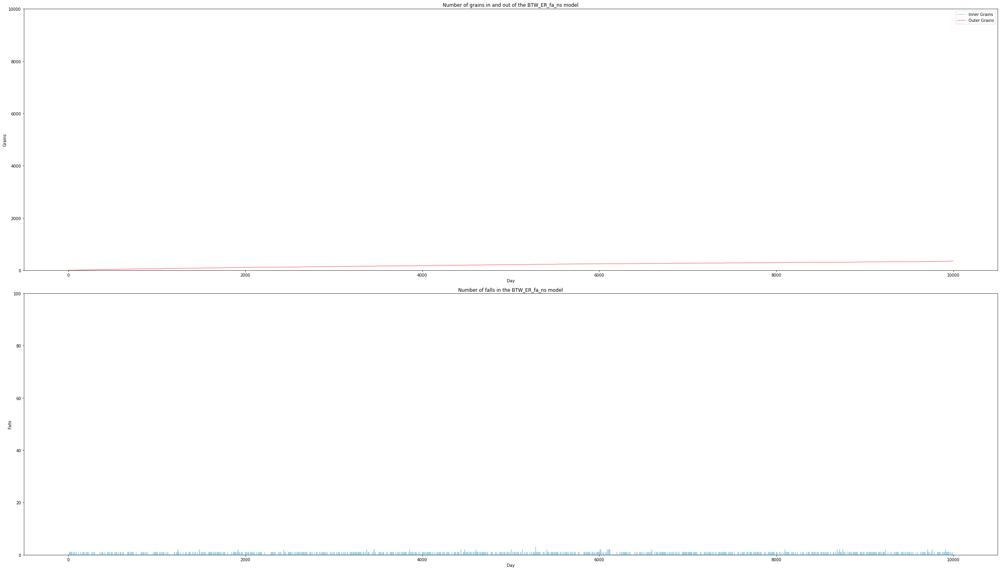

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 181.44it/s]


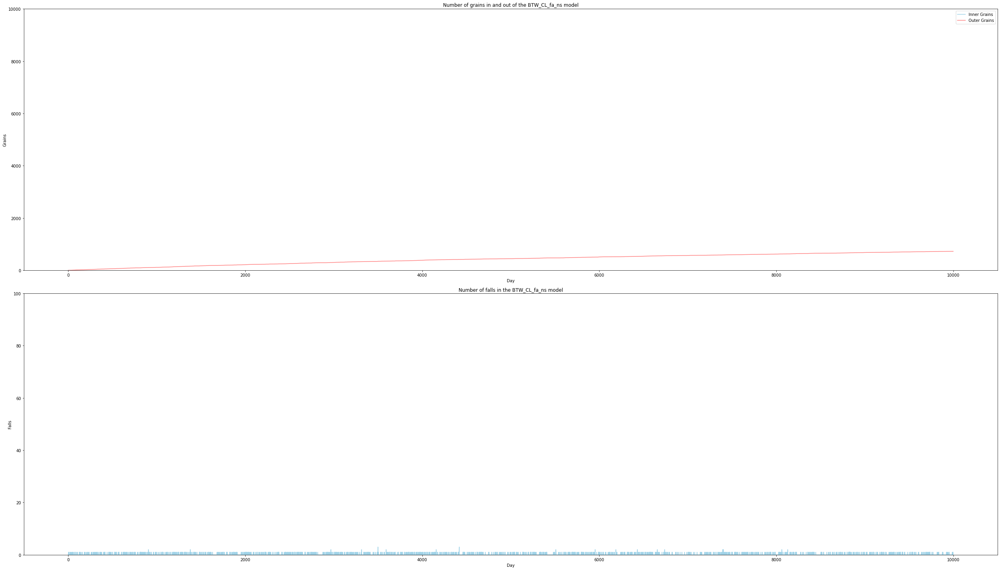

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 184.40it/s]


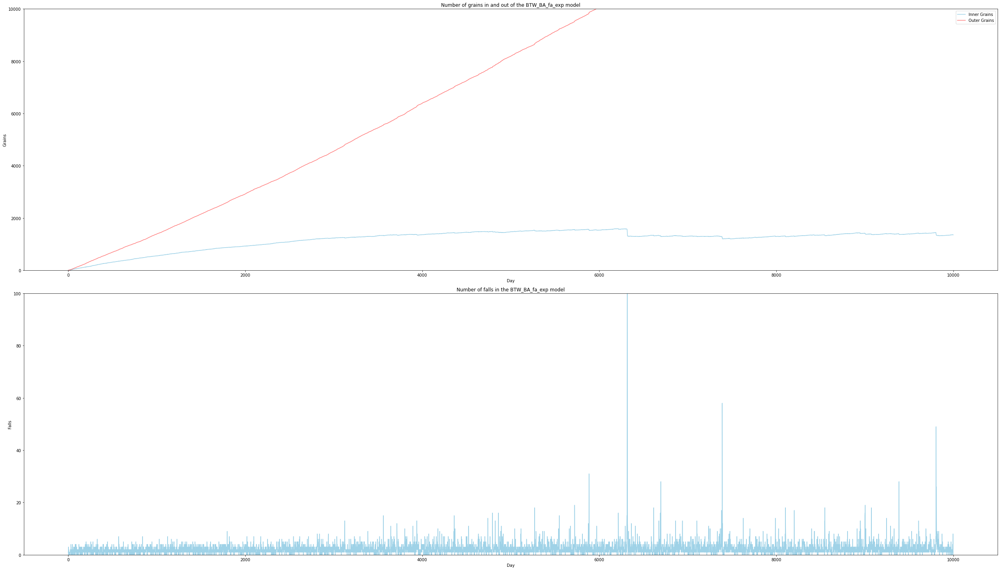

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:01<00:00, 82.01it/s]


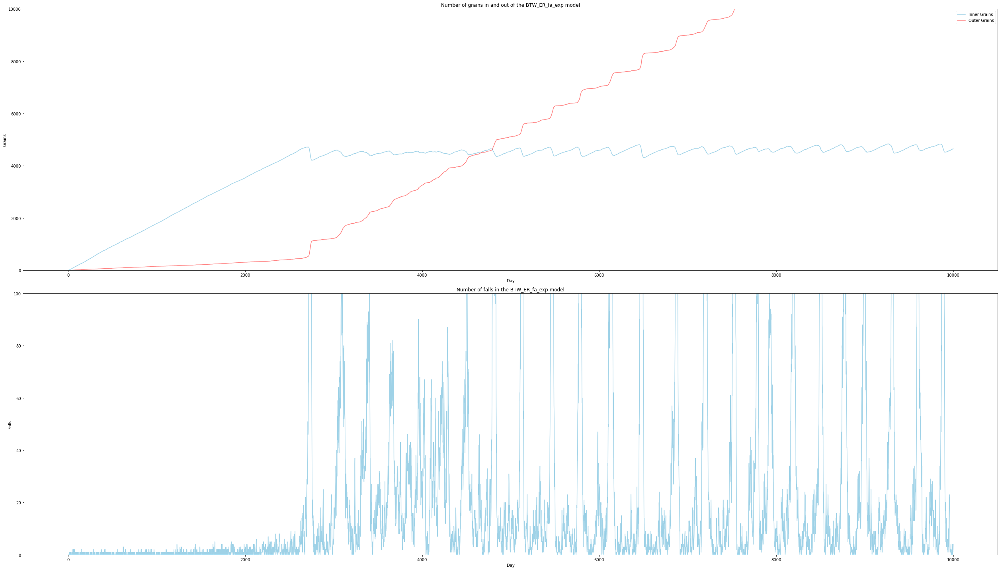

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:46<00:00, 94.26it/s]


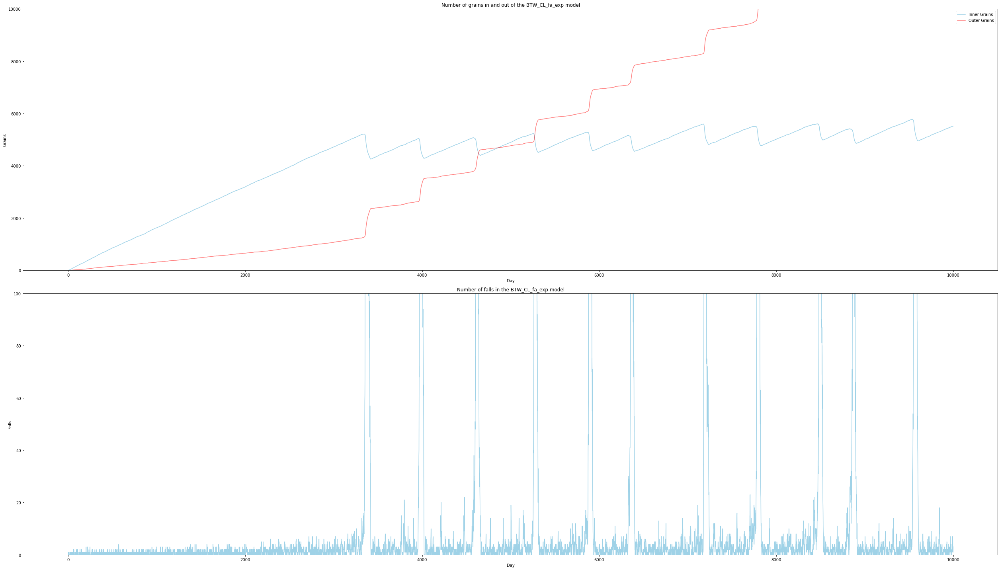

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 183.41it/s]


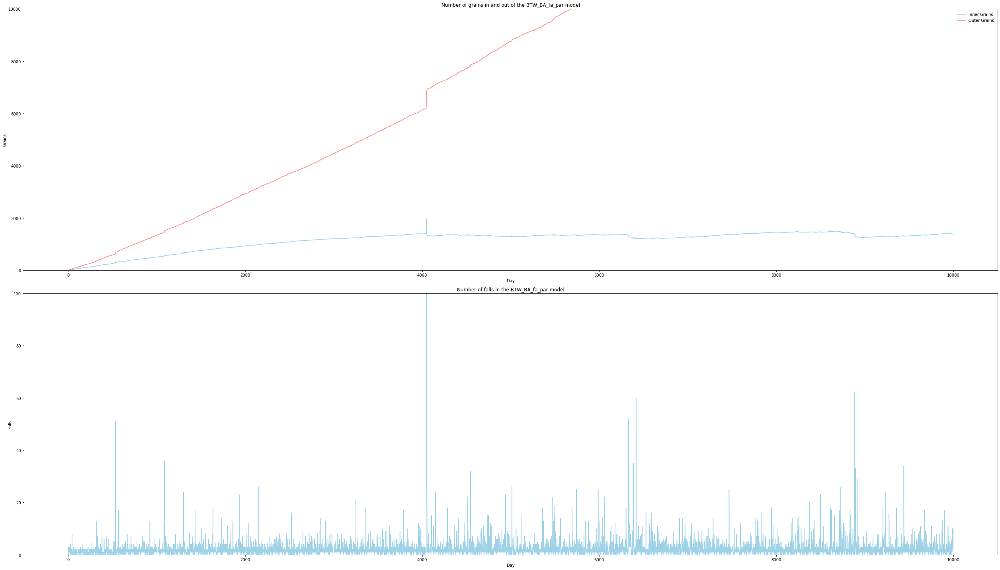

In [ ]:
spread("BTW", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:03<00:00, 80.77it/s]


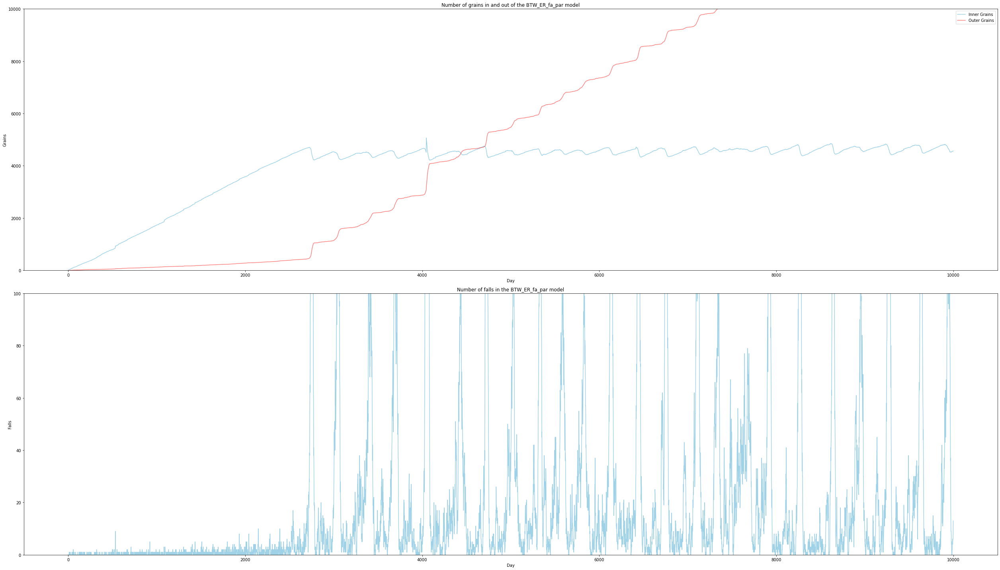

In [ ]:
spread("BTW", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:48<00:00, 92.16it/s]


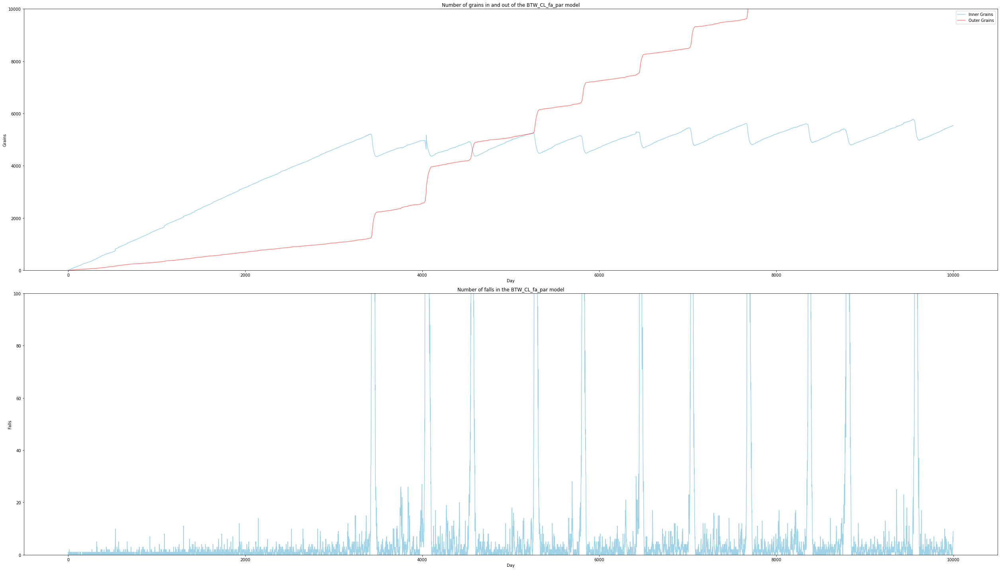

In [ ]:
spread("BTW", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Mann

#### Standart Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:49<00:00, 202.29it/s]


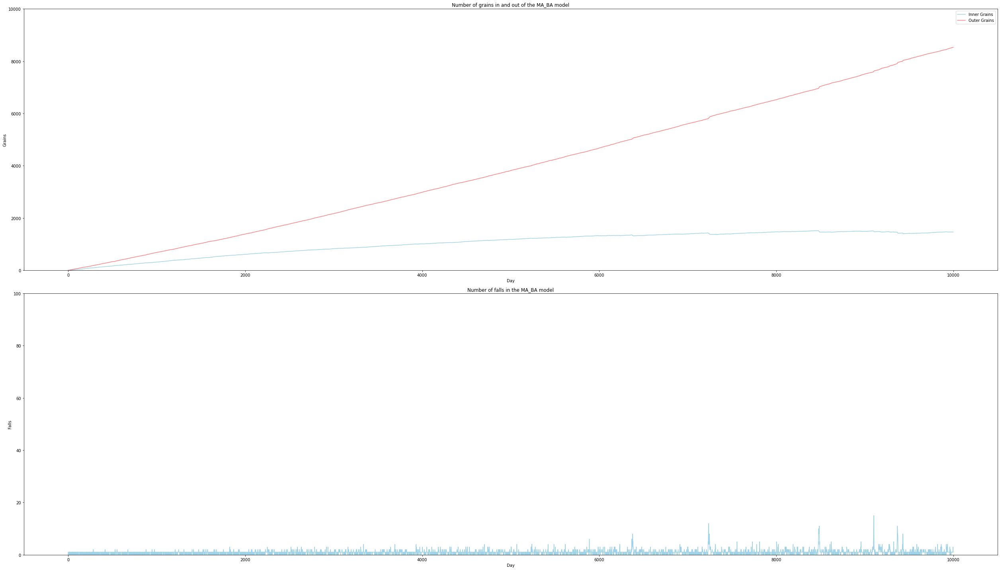

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 184.93it/s]


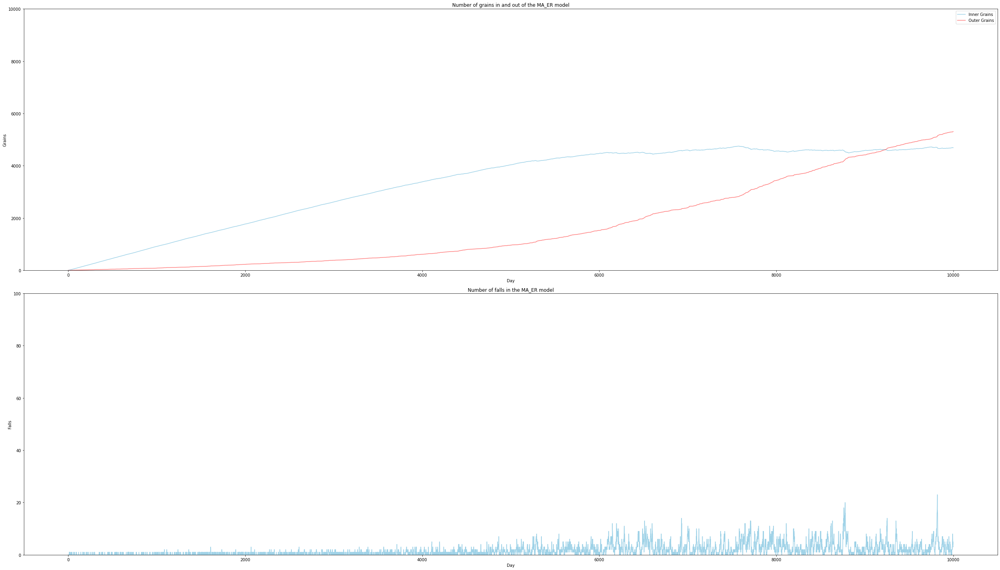

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER")

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:51<00:00, 89.85it/s]


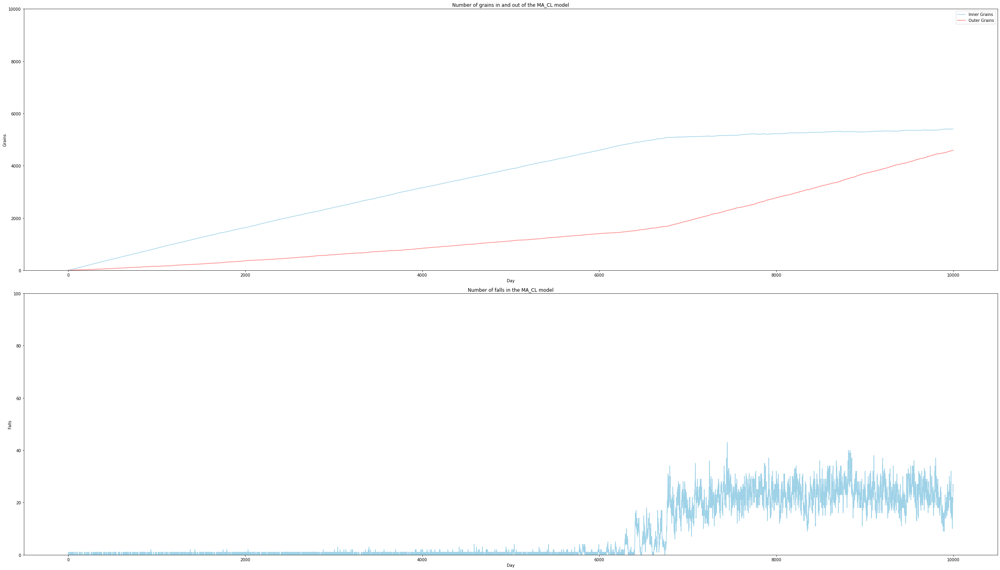

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 183.19it/s]


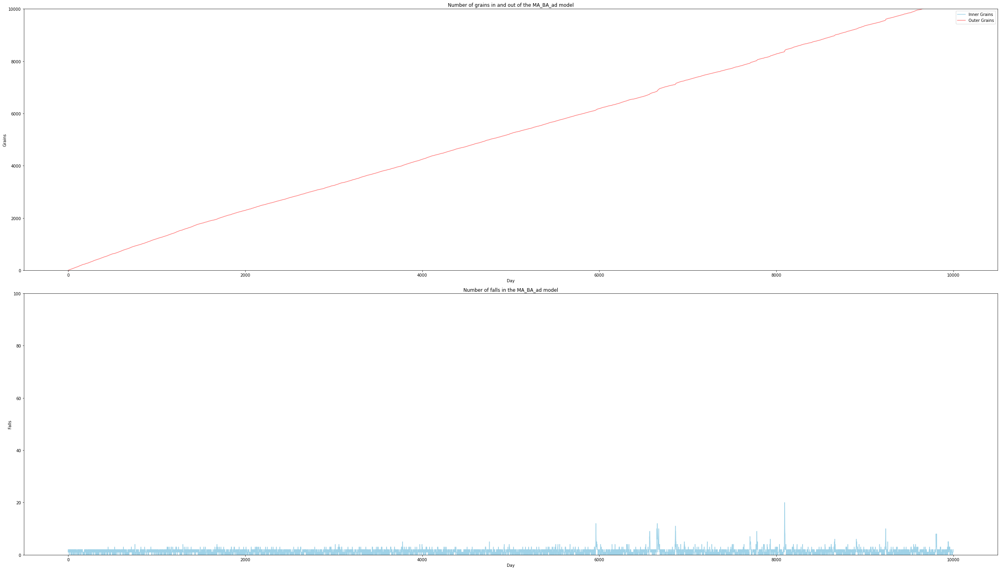

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:00<00:00, 165.45it/s]


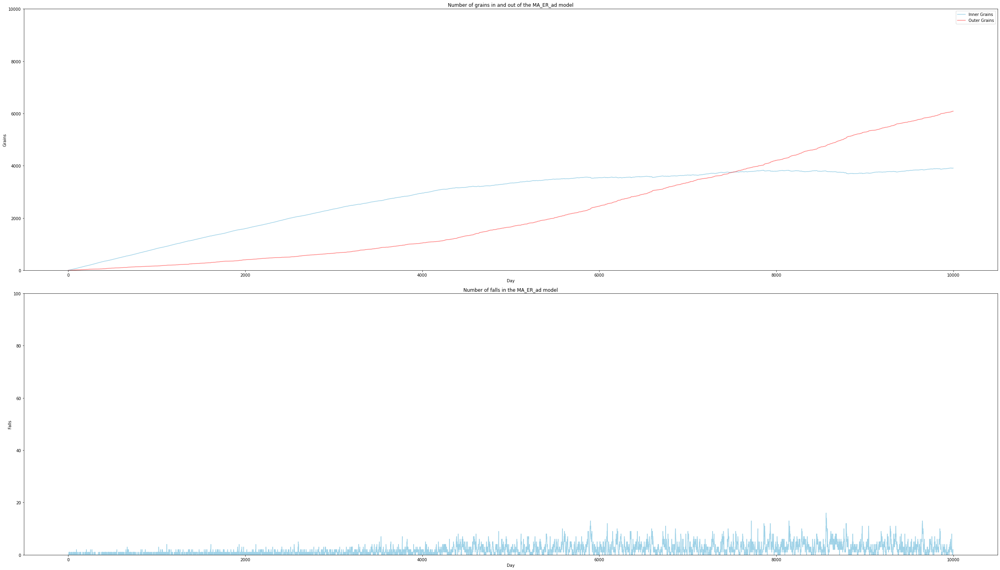

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:13<00:00, 74.96it/s]


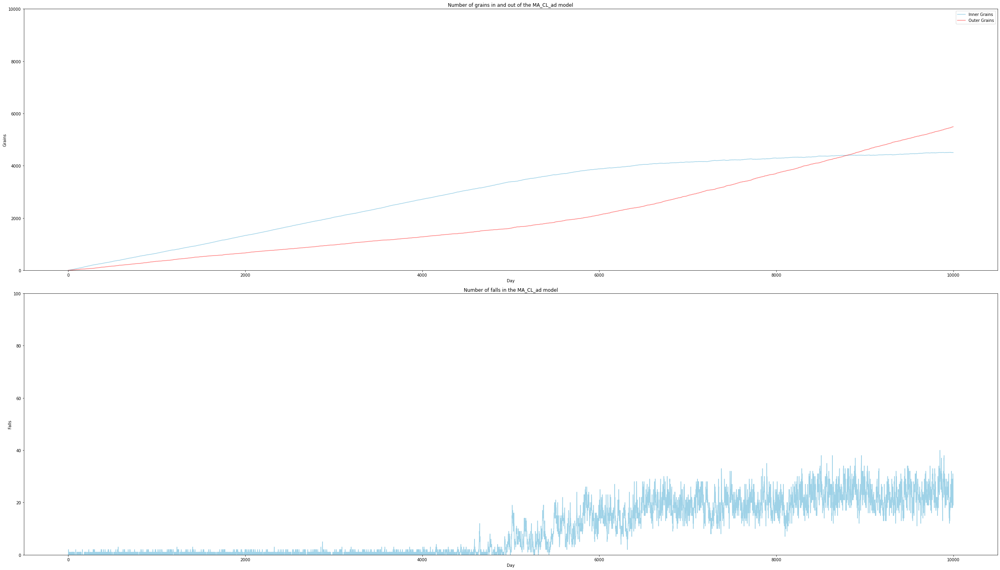

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 184.58it/s]


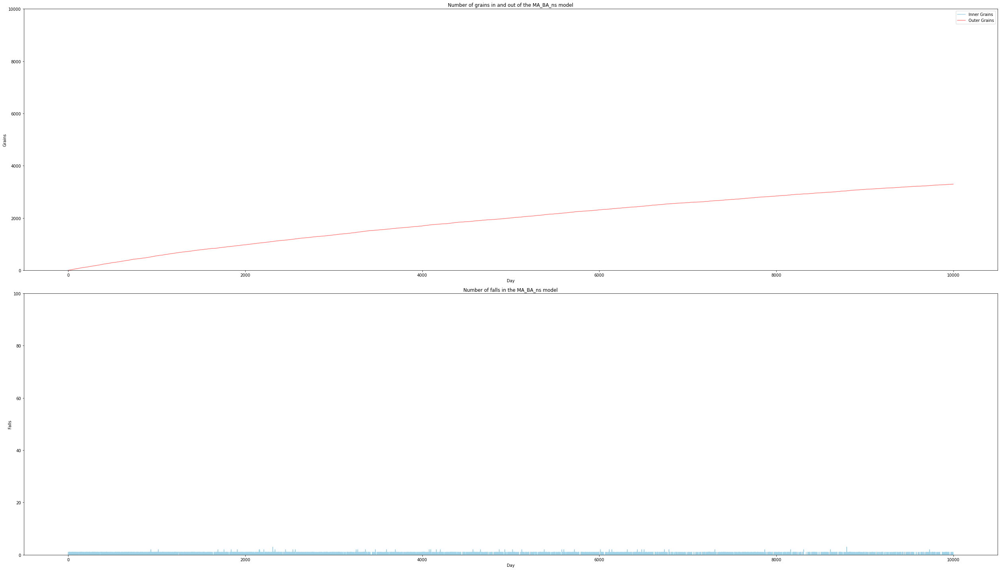

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 180.36it/s]


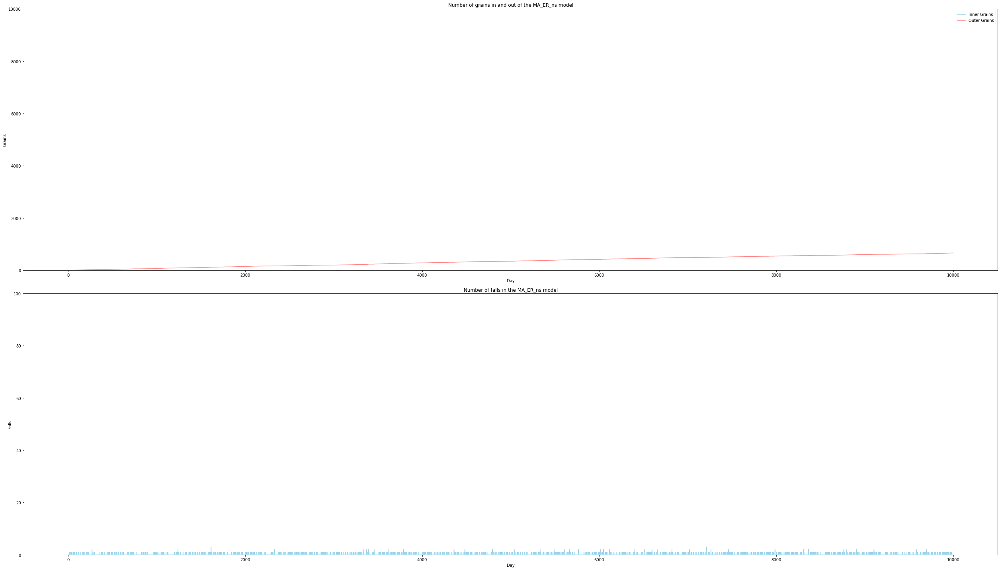

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 180.52it/s]


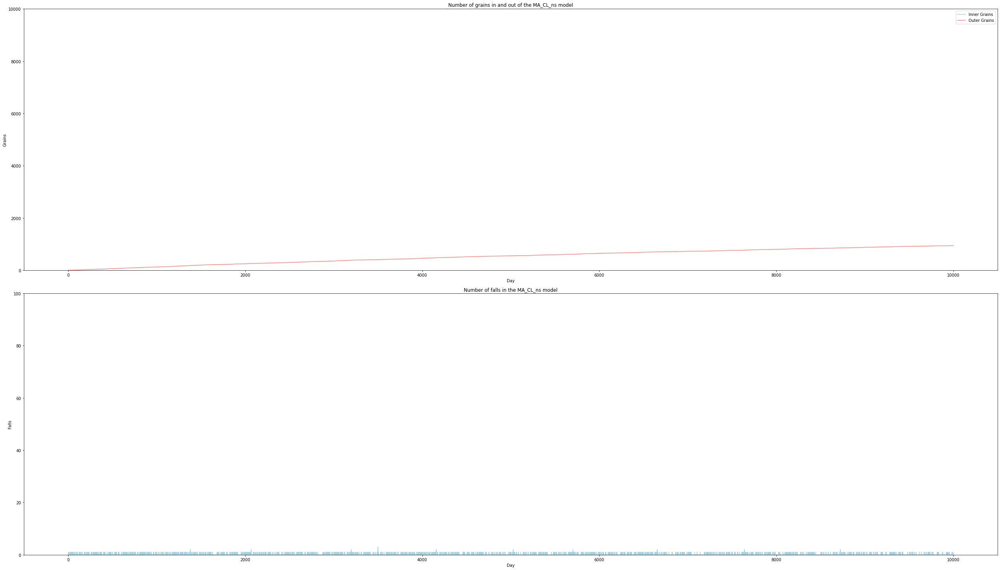

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:51<00:00, 195.92it/s]


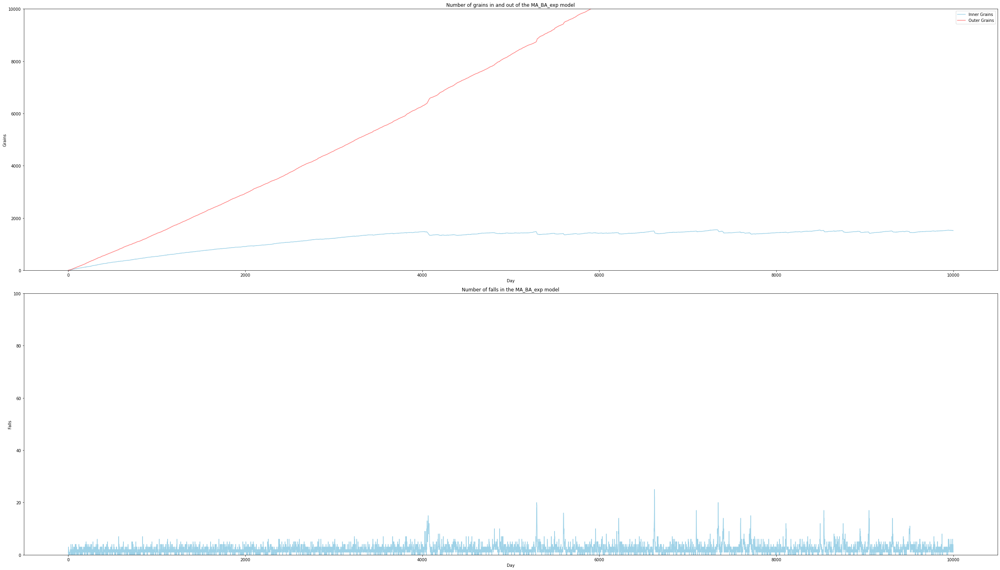

In [ ]:
spread("MA", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:06<00:00, 149.73it/s]


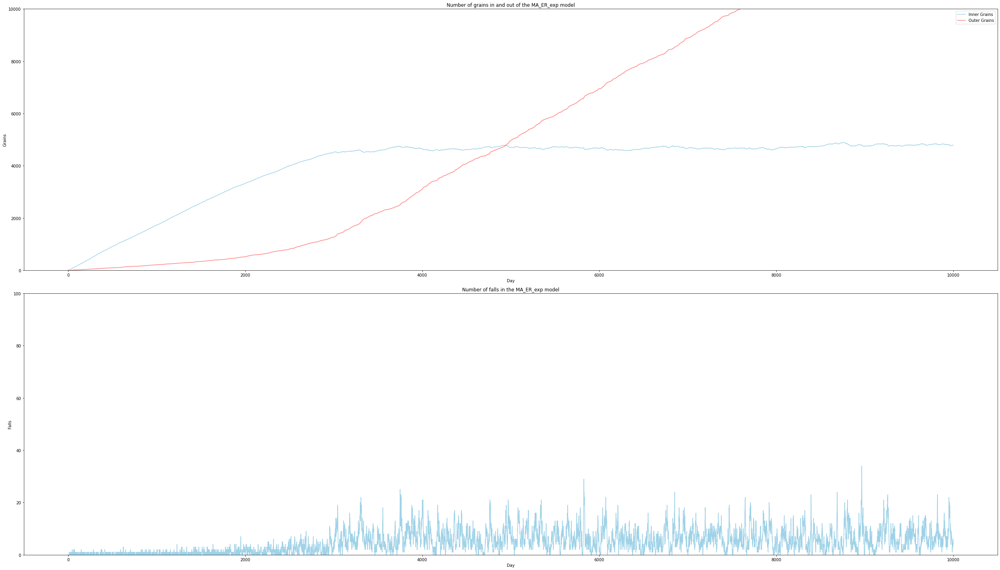

In [ ]:
spread("MA", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [03:46<00:00, 44.24it/s]


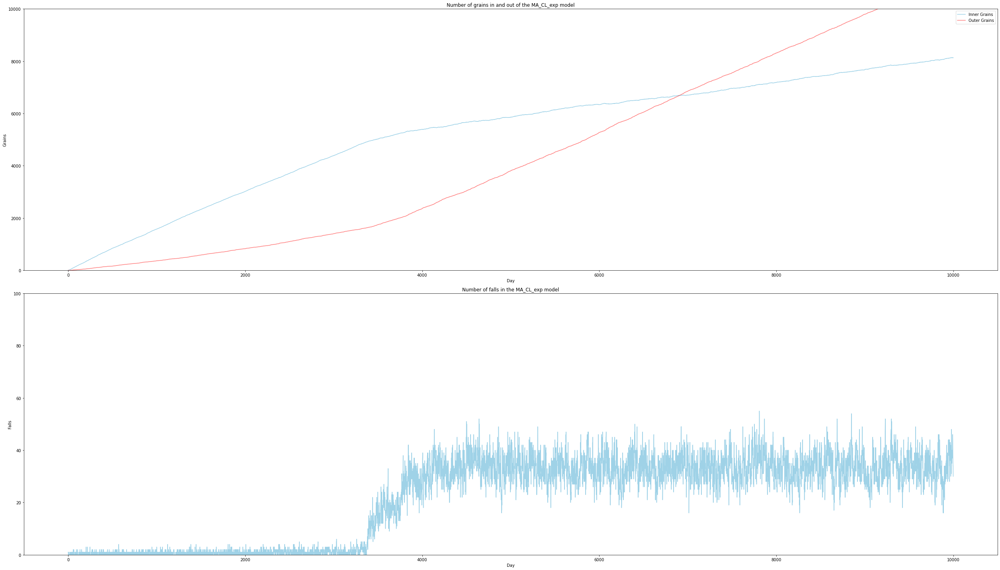

In [ ]:
spread("MA", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 172.81it/s]


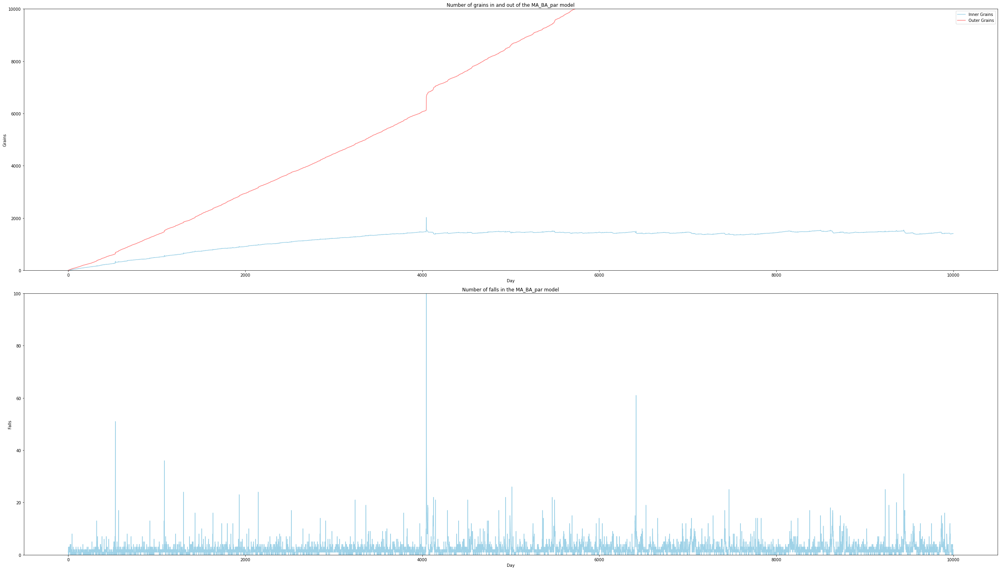

In [ ]:
spread("MA", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:08<00:00, 146.68it/s]


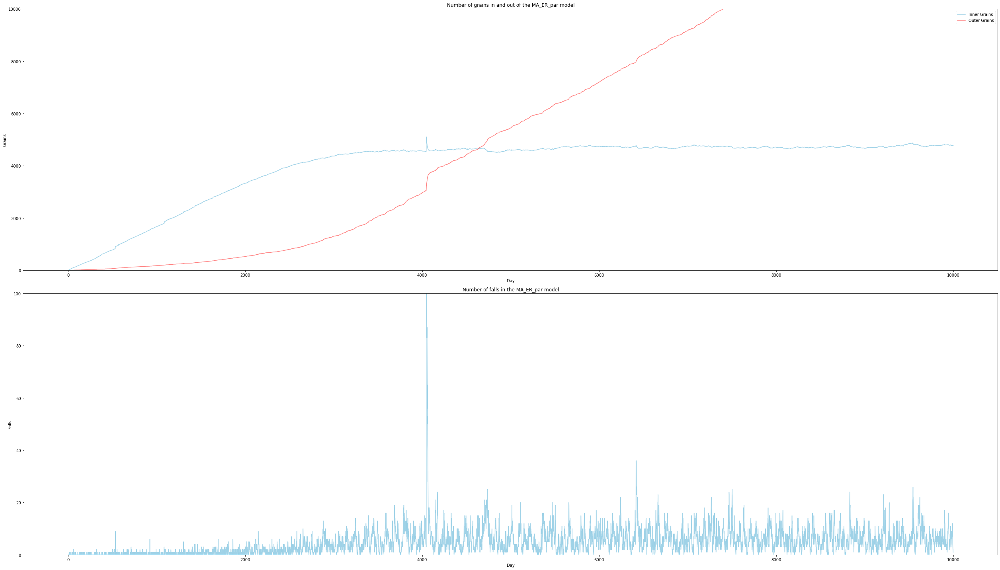

In [ ]:
spread("MA", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [03:45<00:00, 44.39it/s]


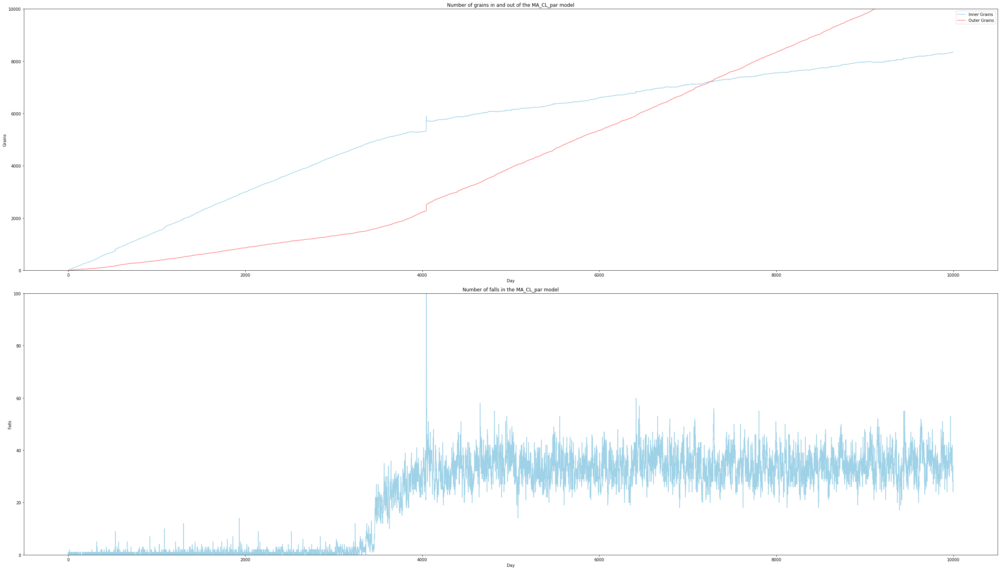

In [ ]:
spread("MA", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 184.45it/s]


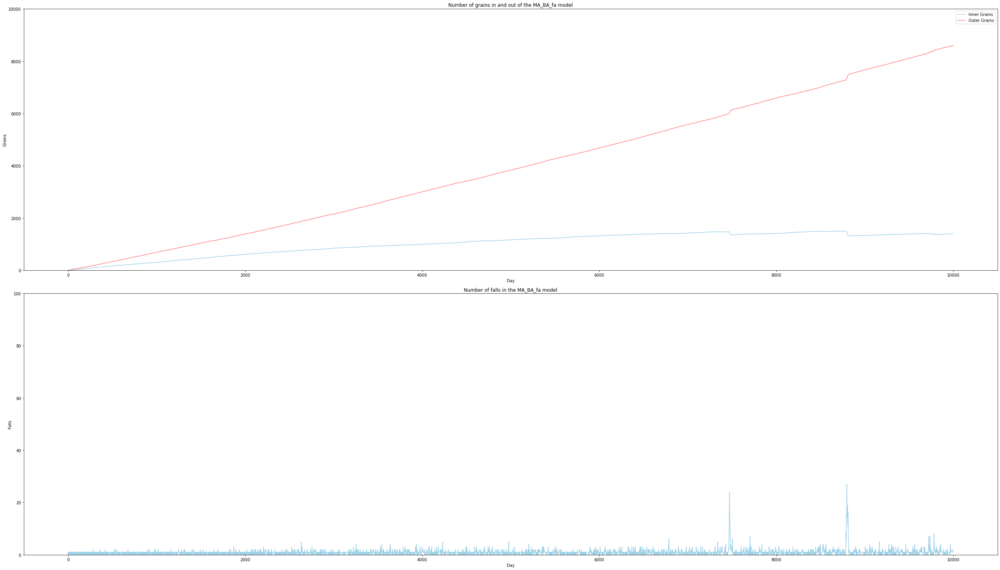

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:59<00:00, 167.15it/s]


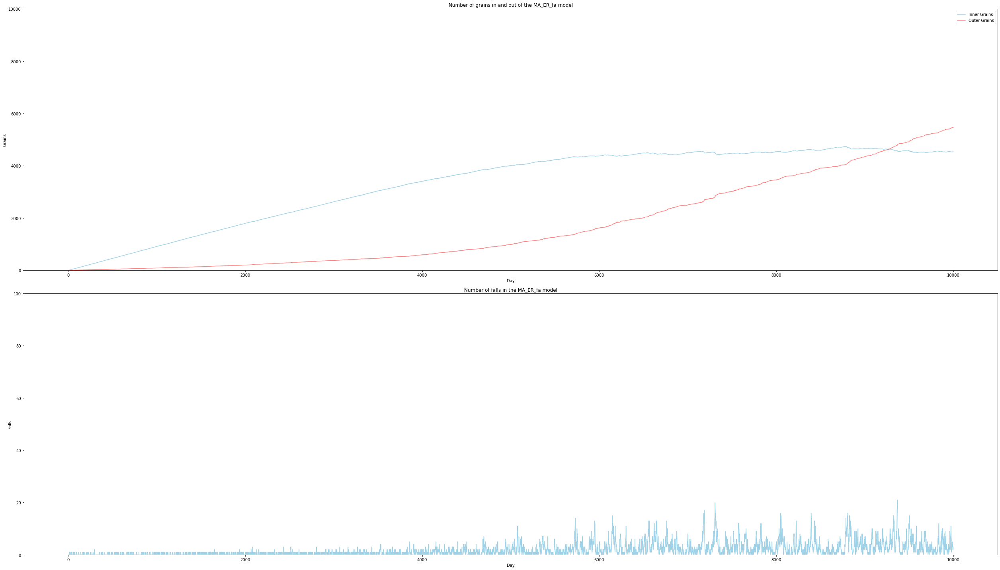

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:11<00:00, 76.26it/s]


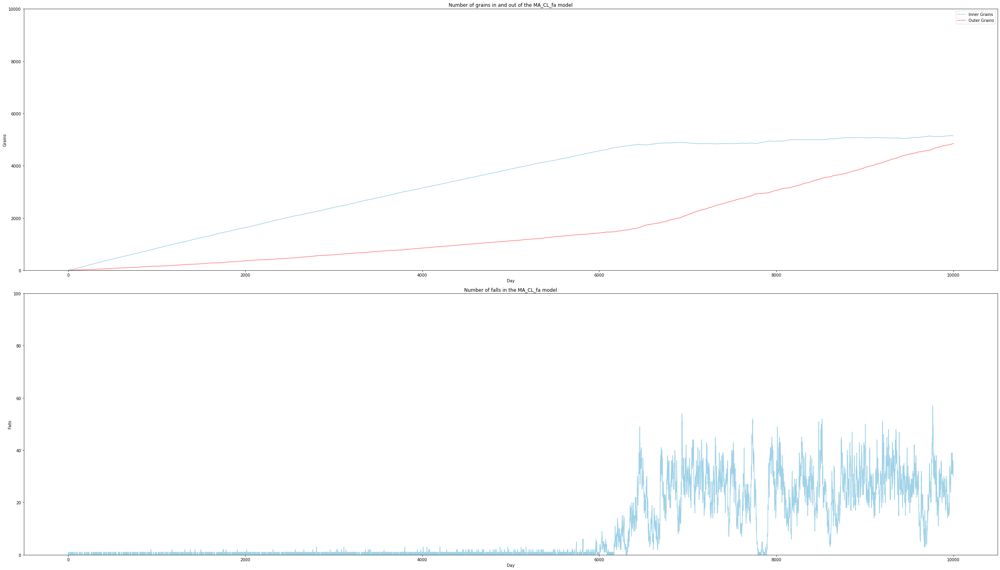

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:03<00:00, 157.25it/s]


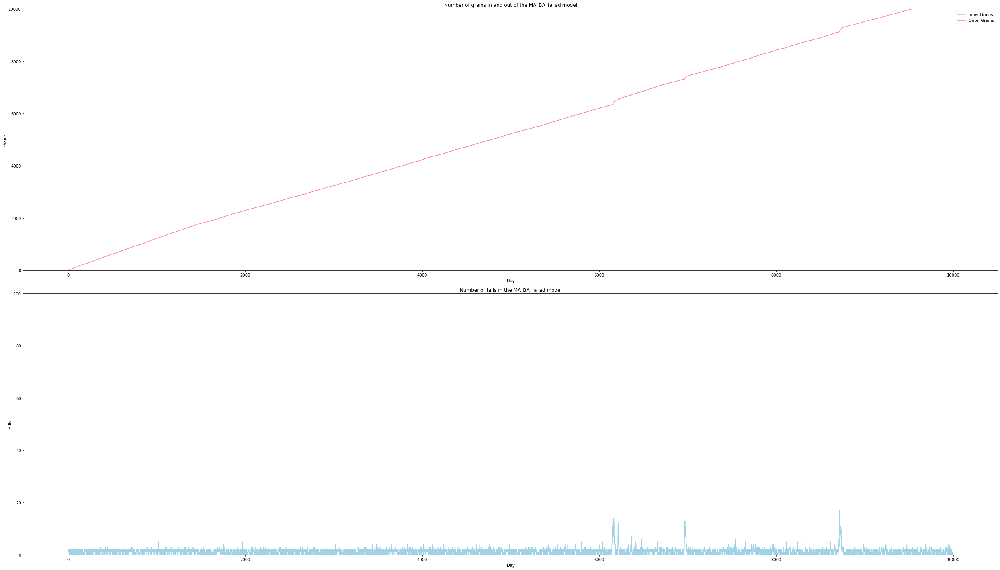

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:05<00:00, 151.51it/s]


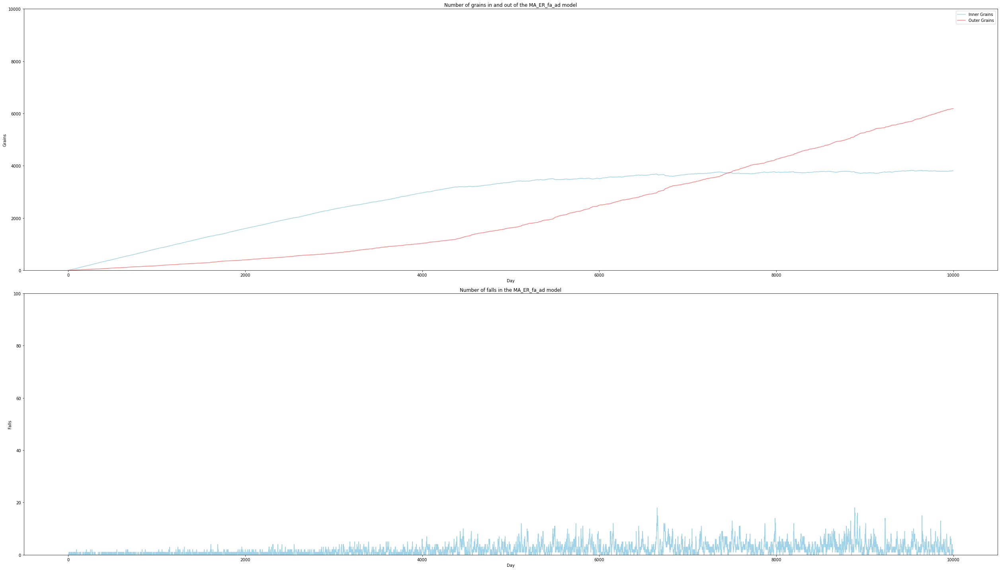

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [02:35<00:00, 64.33it/s]


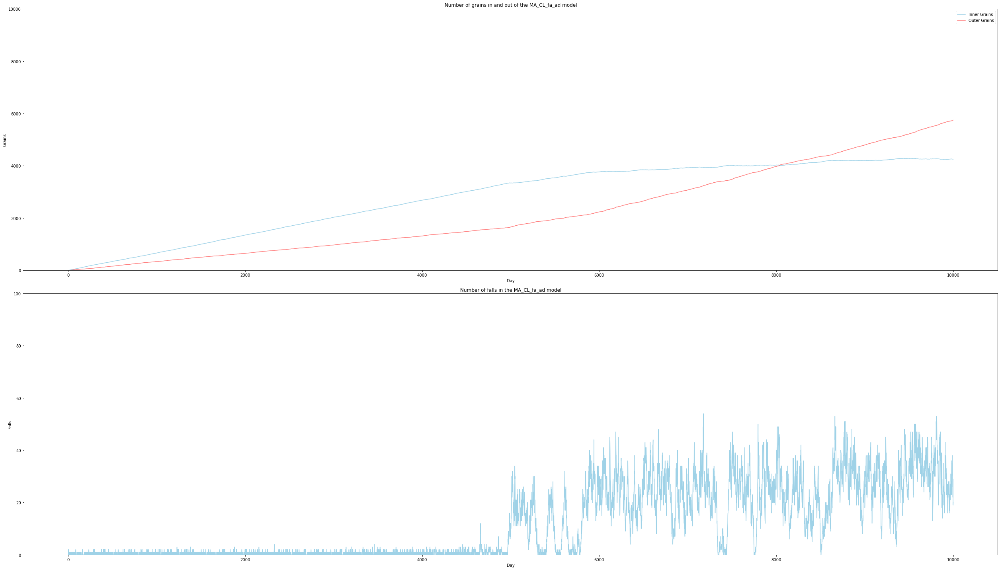

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:00<00:00, 166.07it/s]


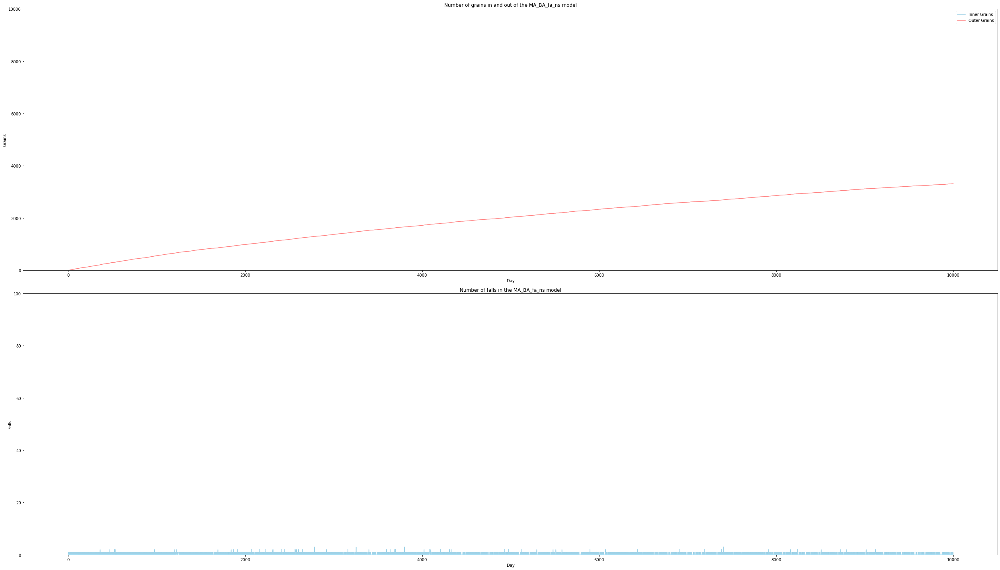

In [ ]:
spread("MA", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 173.21it/s]


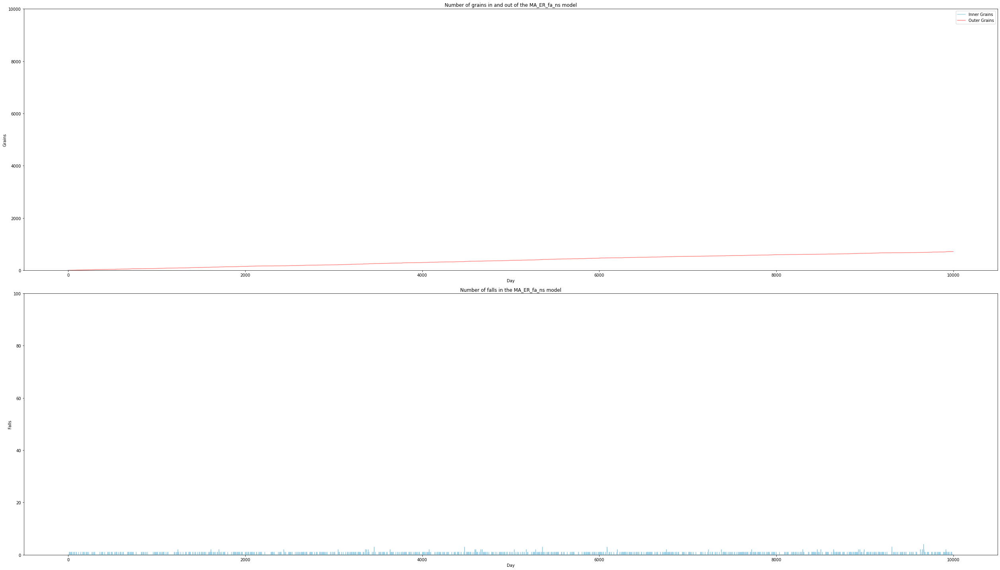

In [ ]:
spread("MA", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:00<00:00, 166.36it/s]


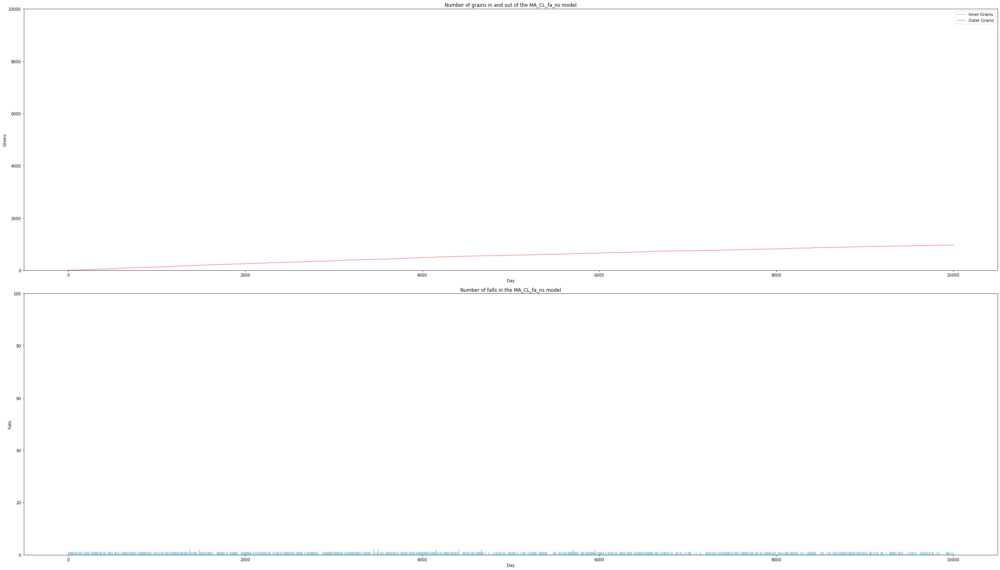

In [ ]:
spread("MA", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:01<00:00, 163.43it/s]


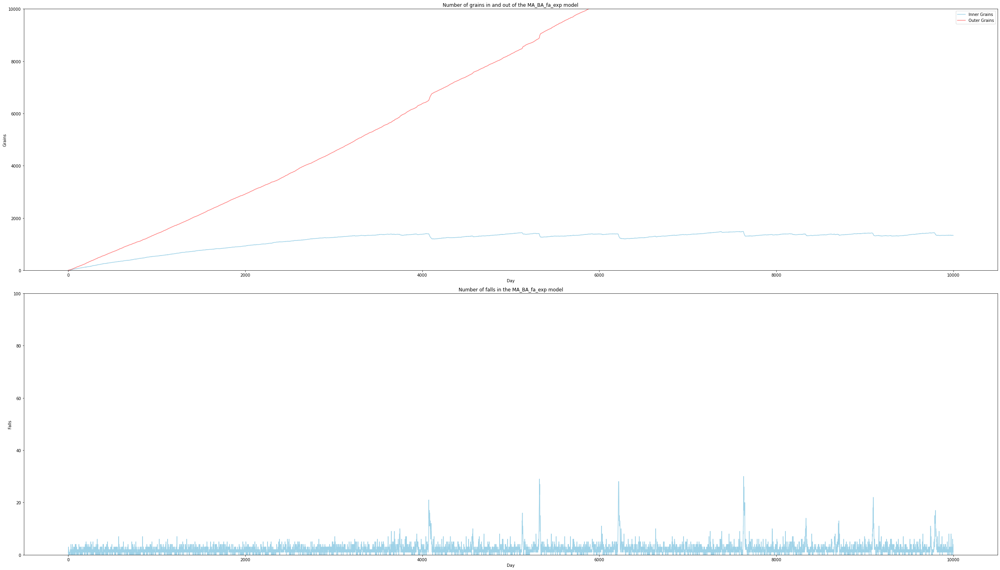

In [ ]:
spread("MA", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:14<00:00, 134.95it/s]


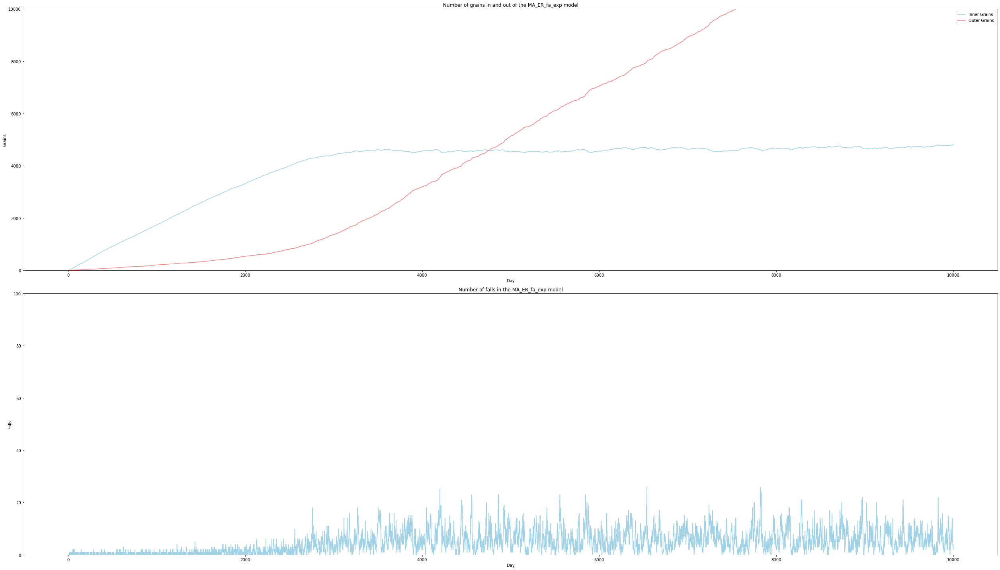

In [ ]:
spread("MA", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [04:33<00:00, 36.59it/s]


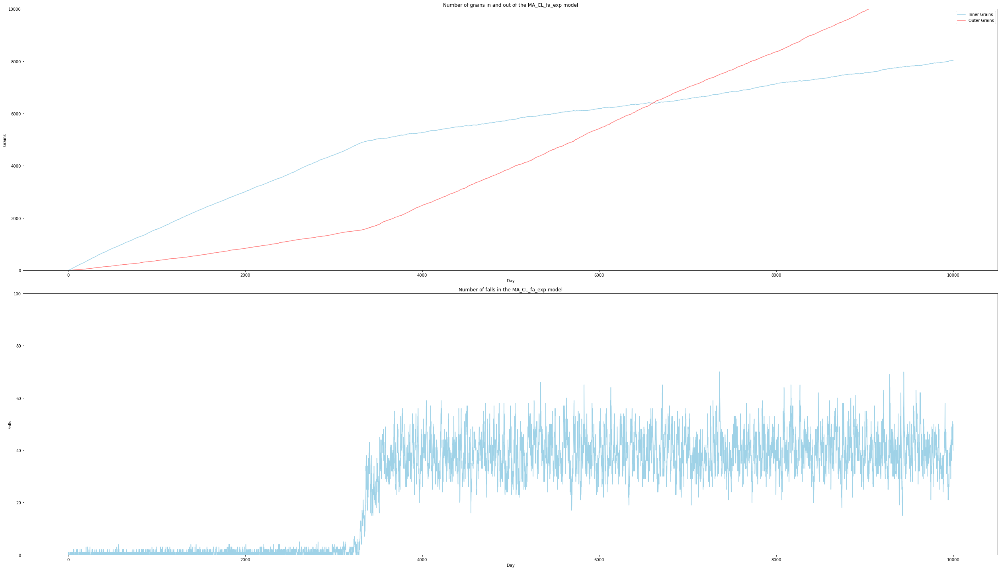

In [ ]:
spread("MA", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 183.60it/s]


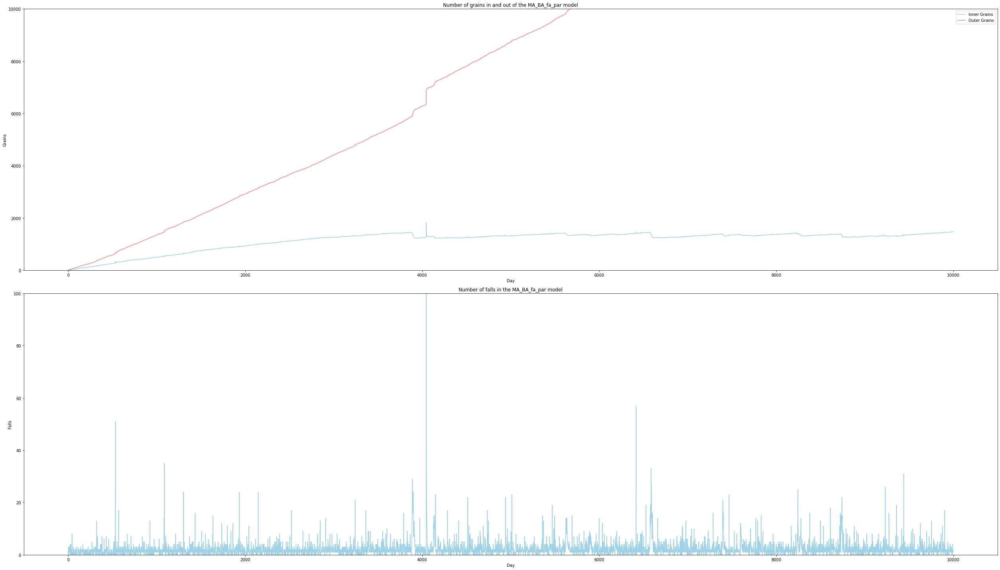

In [ ]:
spread("MA", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:10<00:00, 141.69it/s]


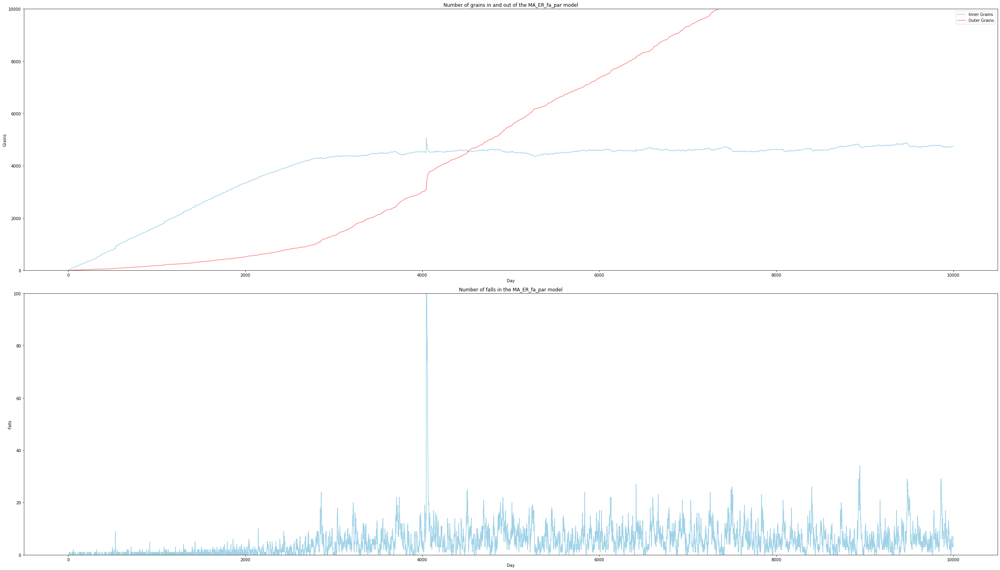

In [ ]:
spread("MA", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [04:26<00:00, 37.56it/s]


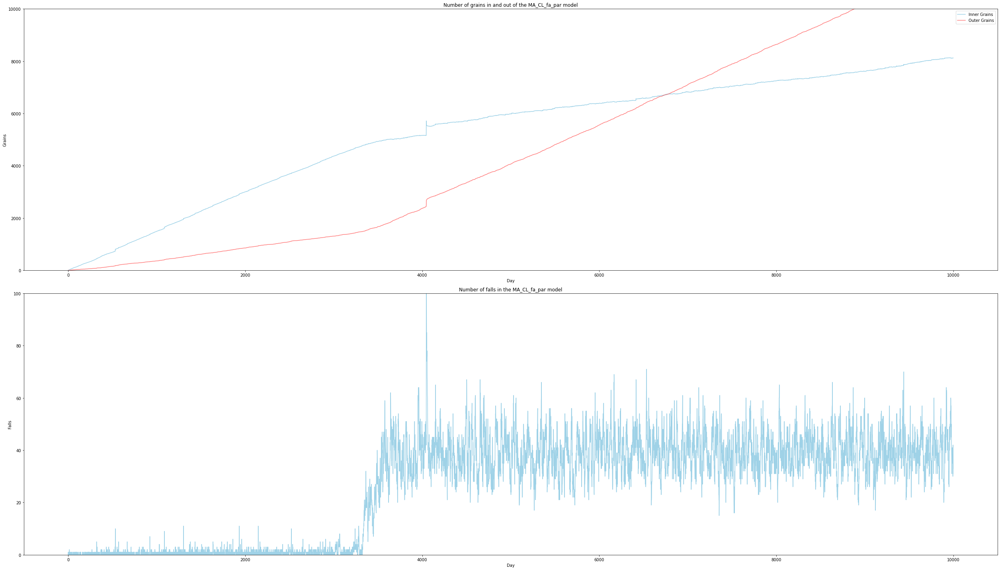

In [ ]:
spread("MA", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Feder

#### Standart Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 196.52it/s]


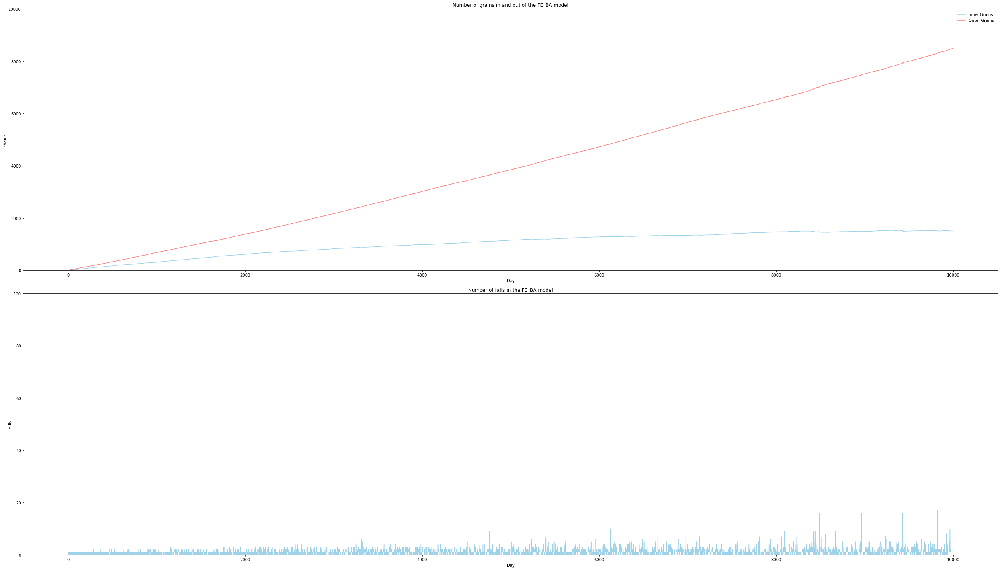

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:11<00:00, 140.19it/s]


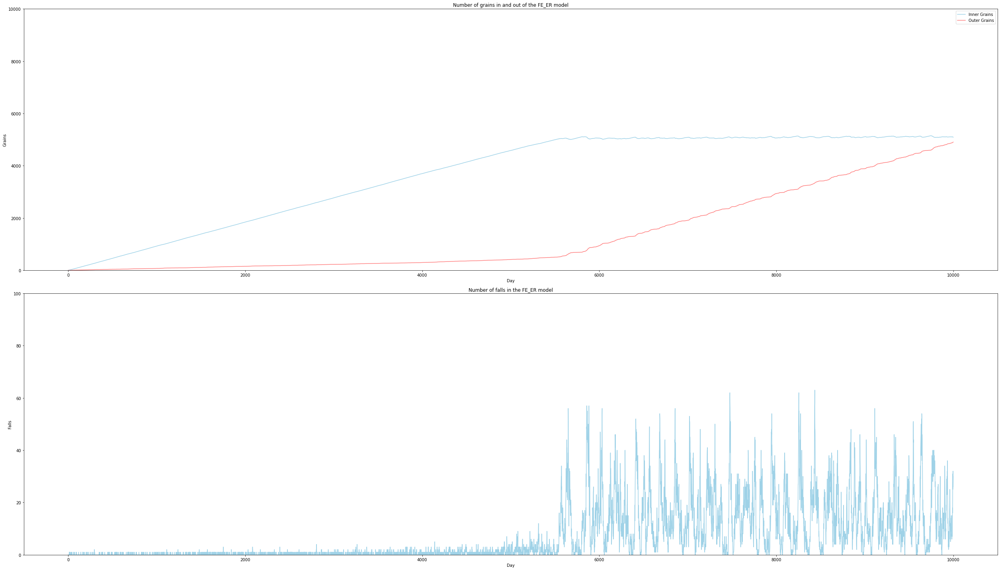

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 175.30it/s]


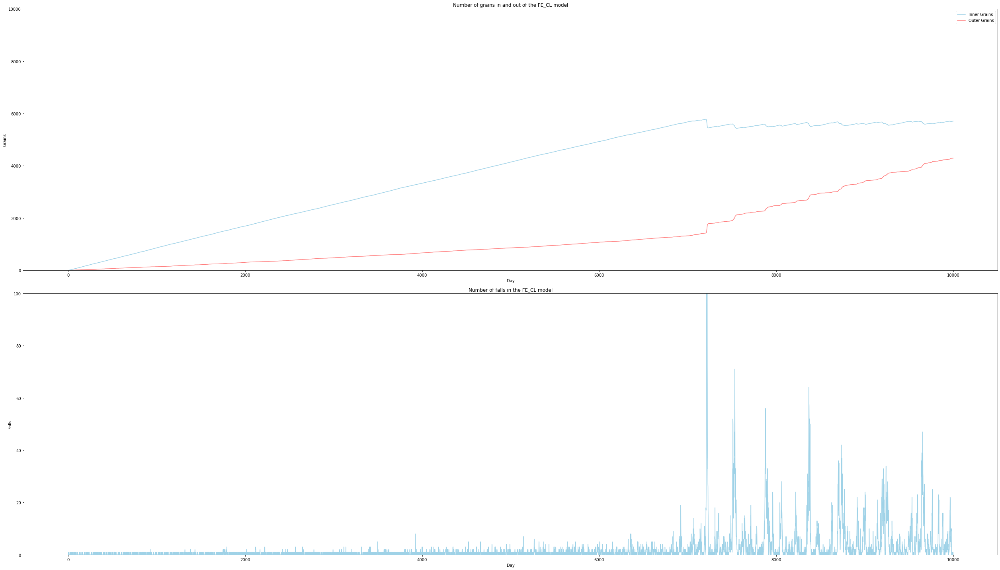

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:56<00:00, 176.09it/s]


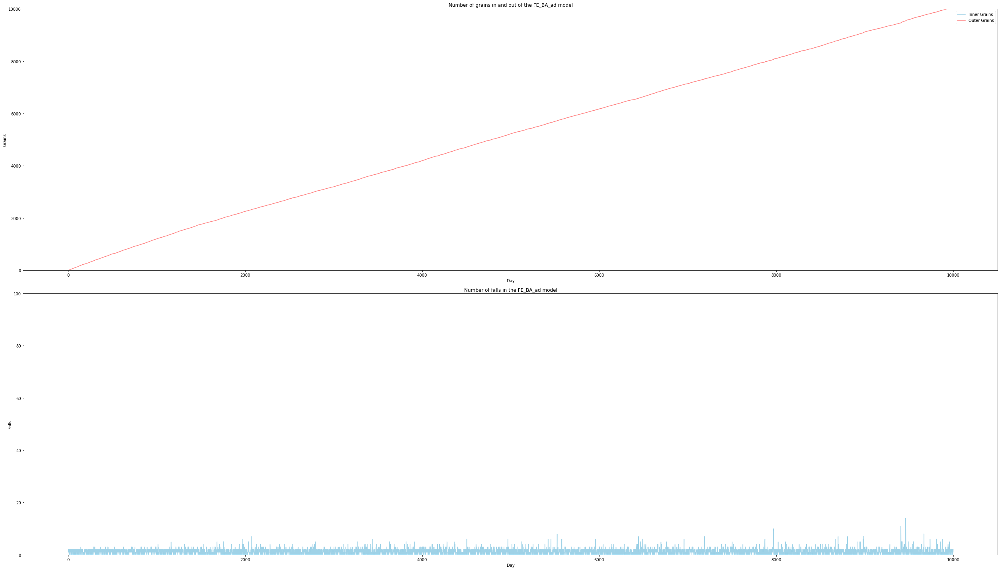

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:16<00:00, 129.94it/s]


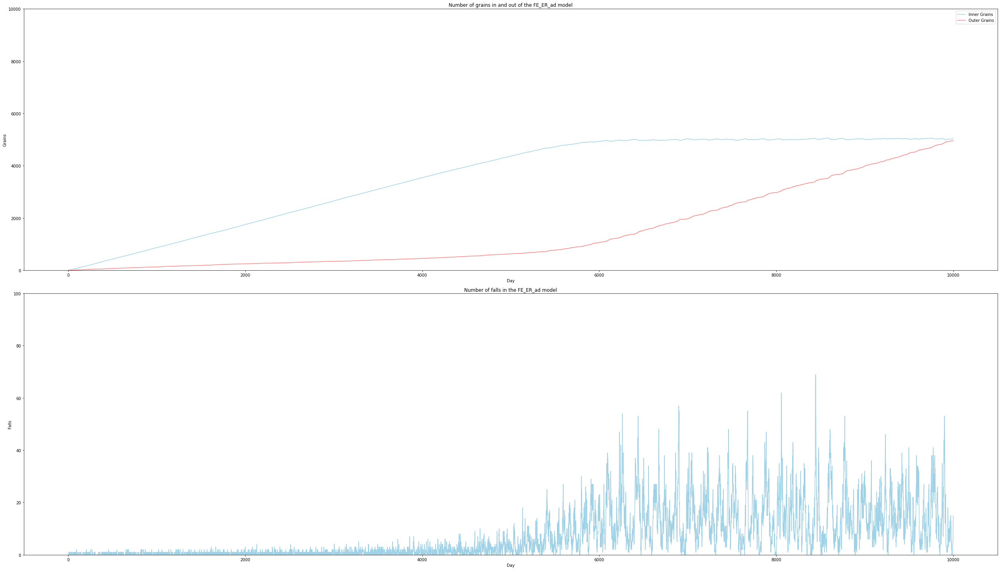

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:02<00:00, 161.05it/s]


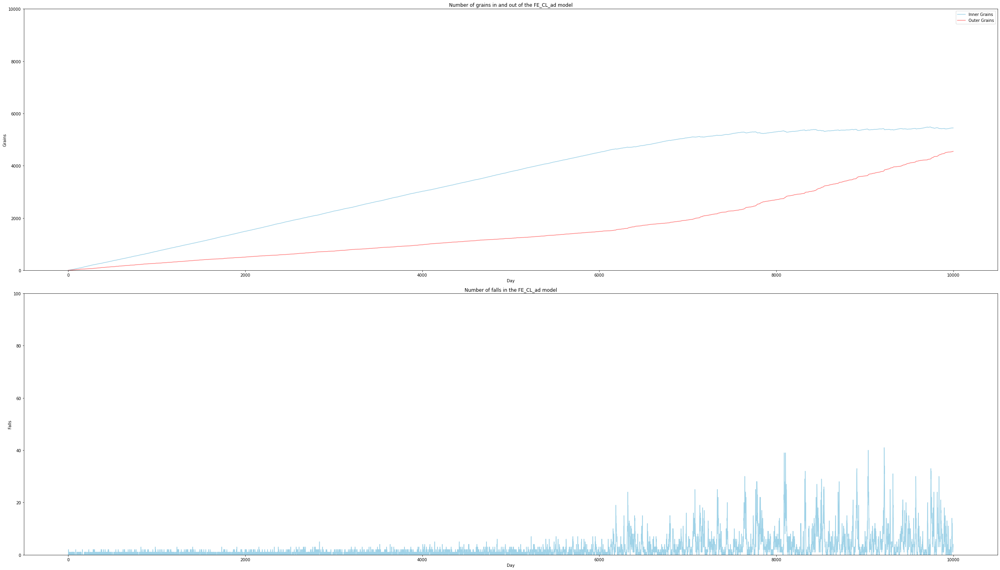

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 183.53it/s]


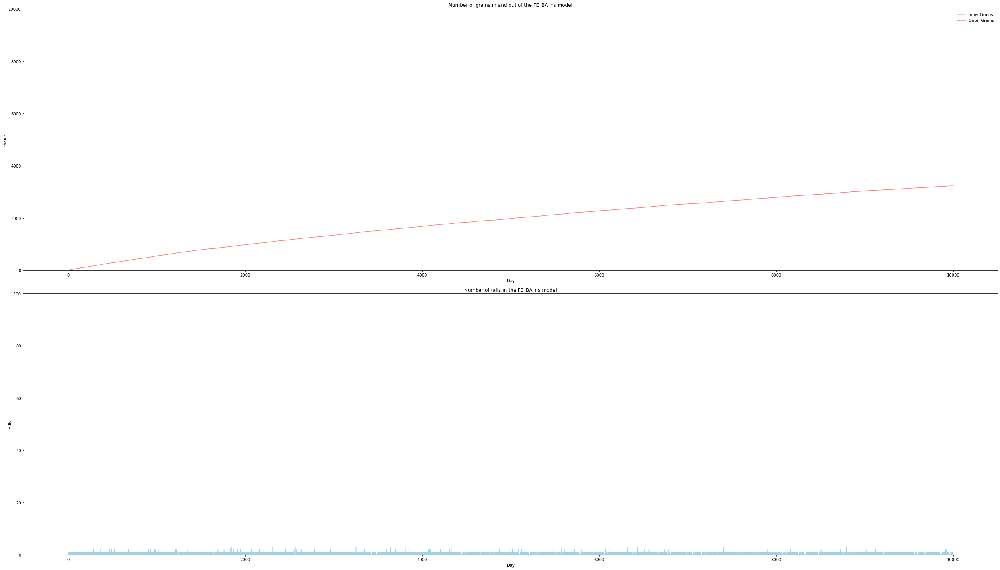

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 188.48it/s]


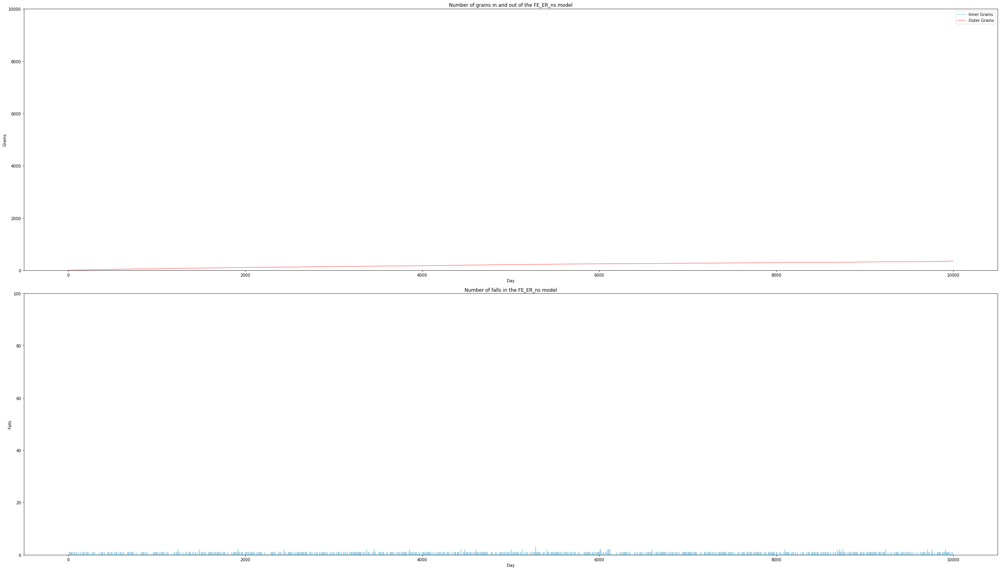

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:52<00:00, 192.03it/s]


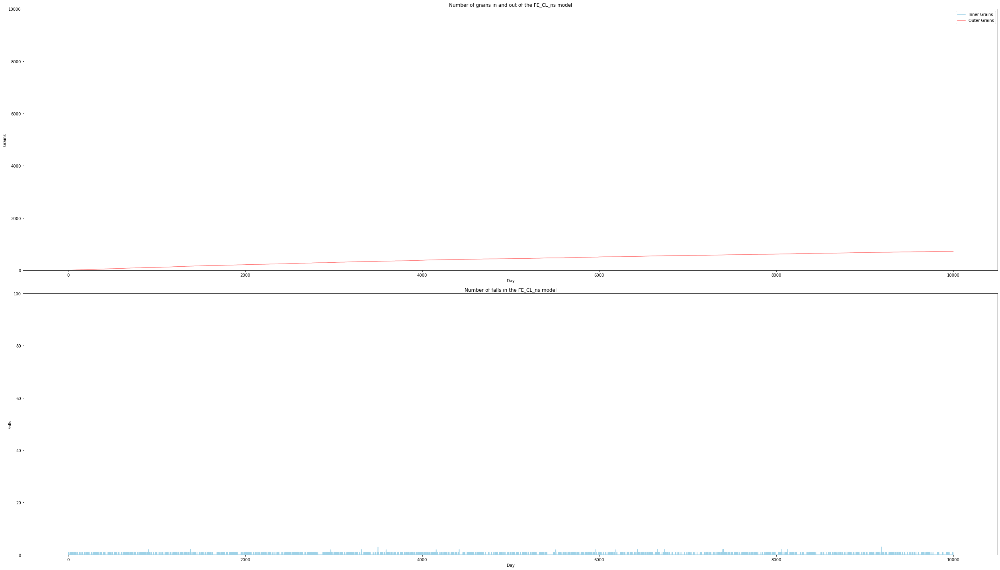

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:54<00:00, 182.14it/s]


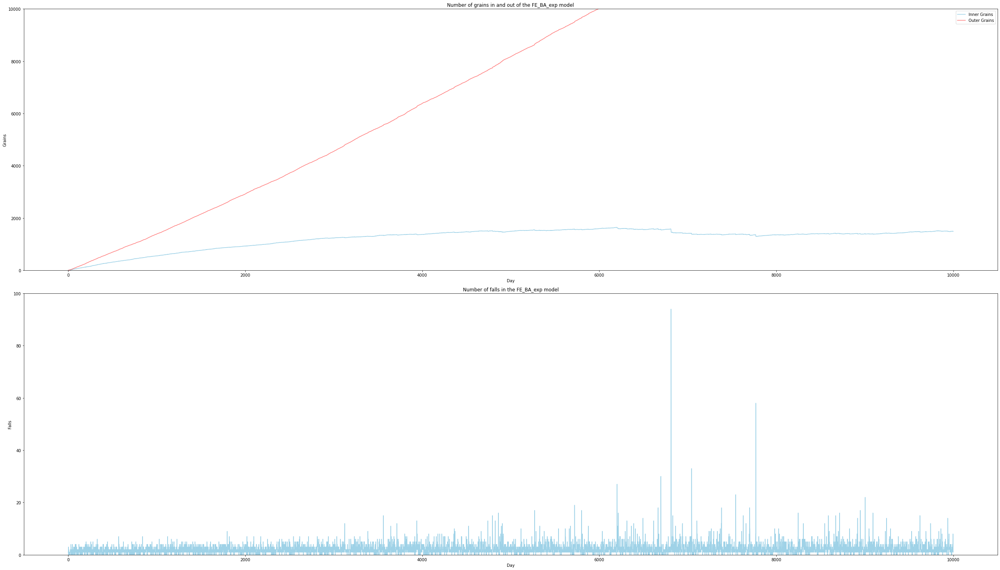

In [ ]:
spread("FE", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:54<00:00, 87.50it/s]


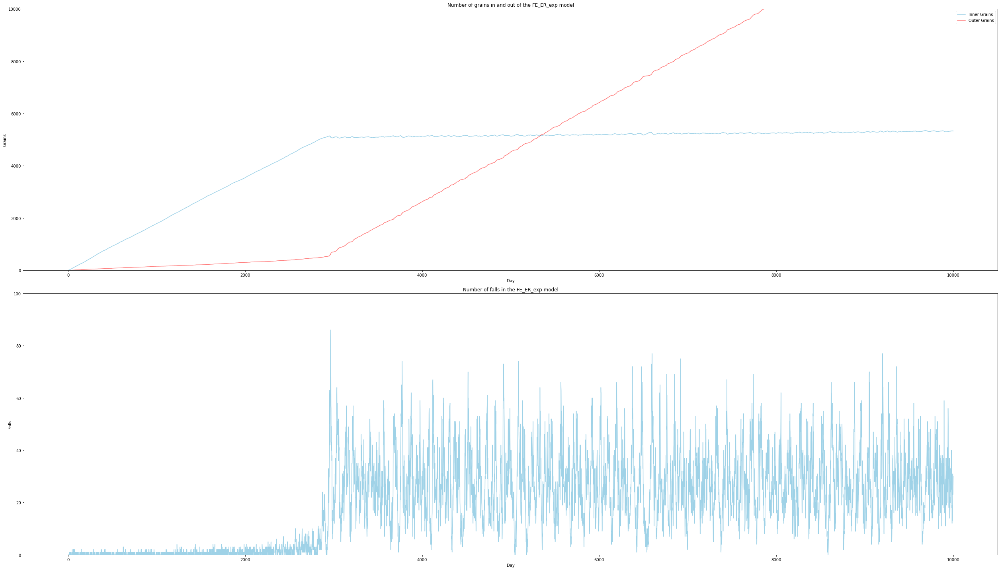

In [ ]:
spread("FE", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:12<00:00, 138.43it/s]


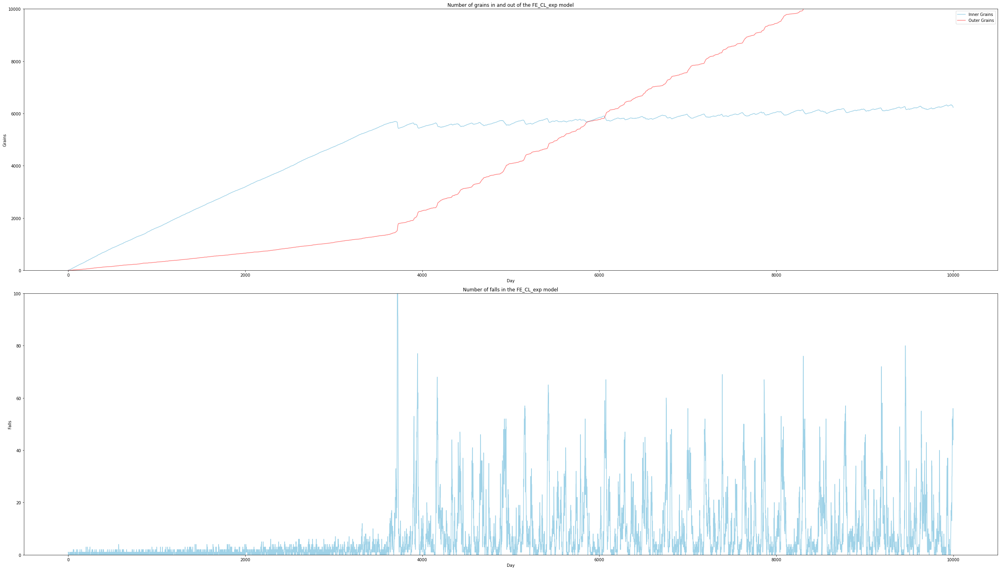

In [ ]:
spread("FE", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:52<00:00, 190.02it/s]


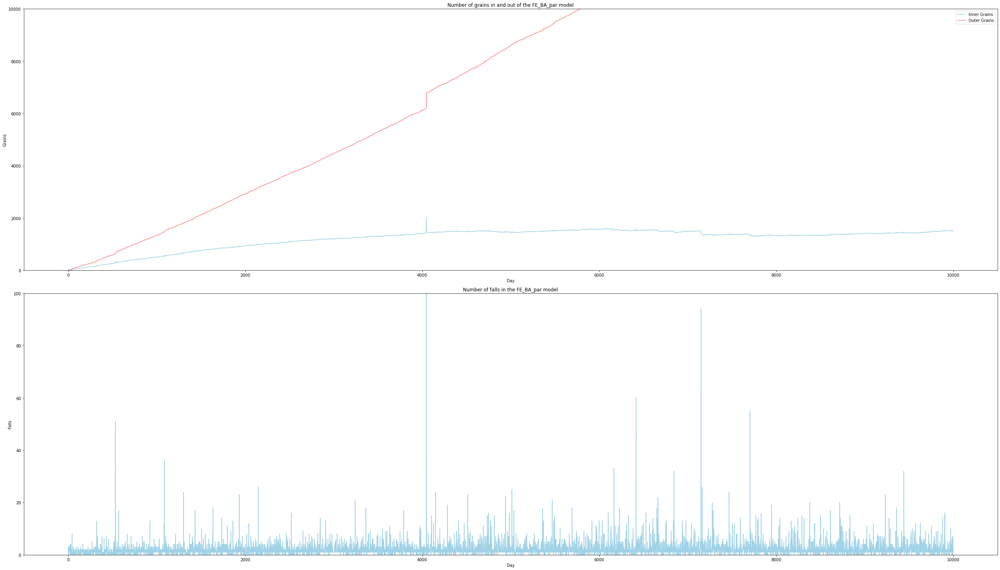

In [ ]:
spread("FE", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|██████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:55<00:00, 86.87it/s]


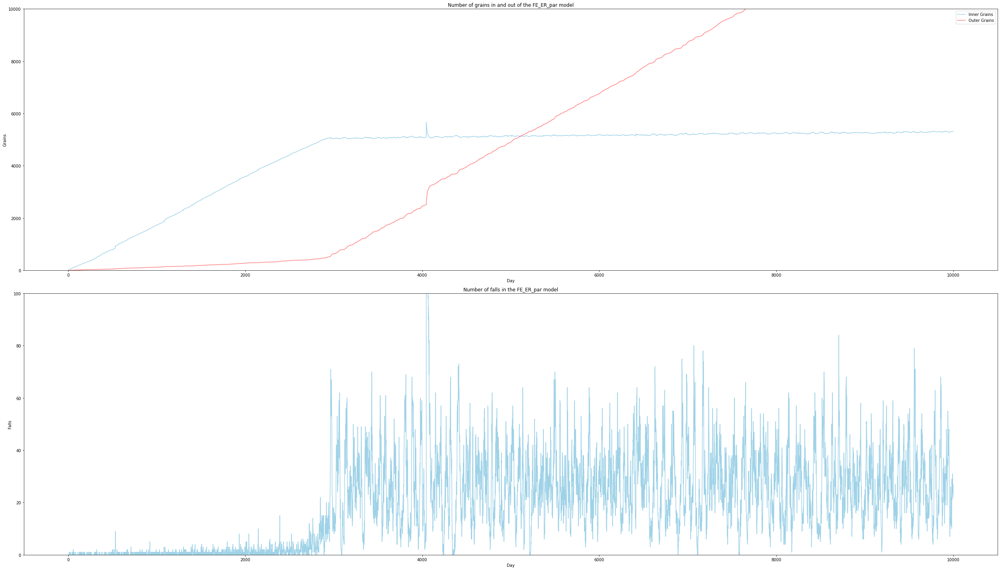

In [ ]:
spread("FE", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:16<00:00, 131.38it/s]


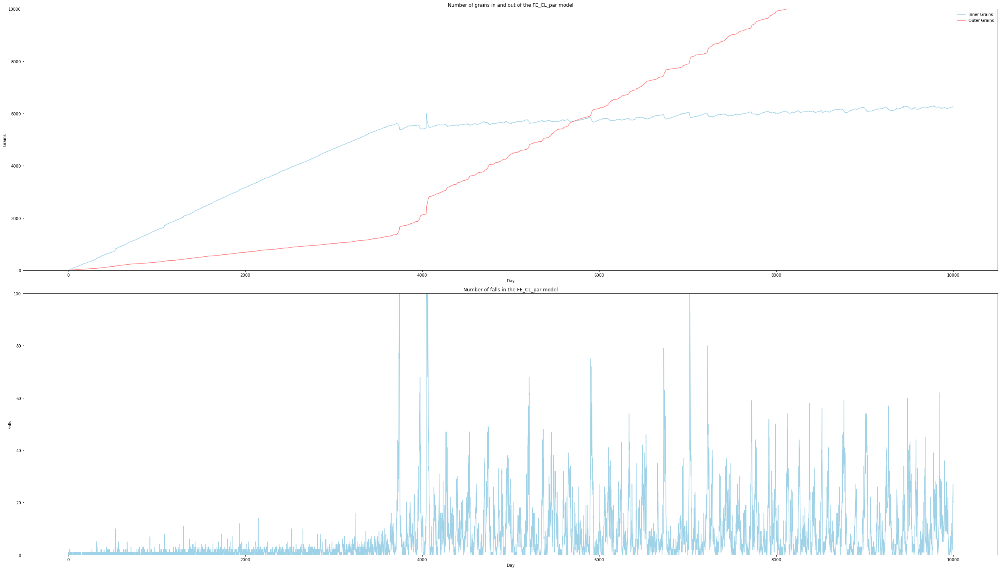

In [ ]:
spread("FE", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:00<00:00, 164.46it/s]


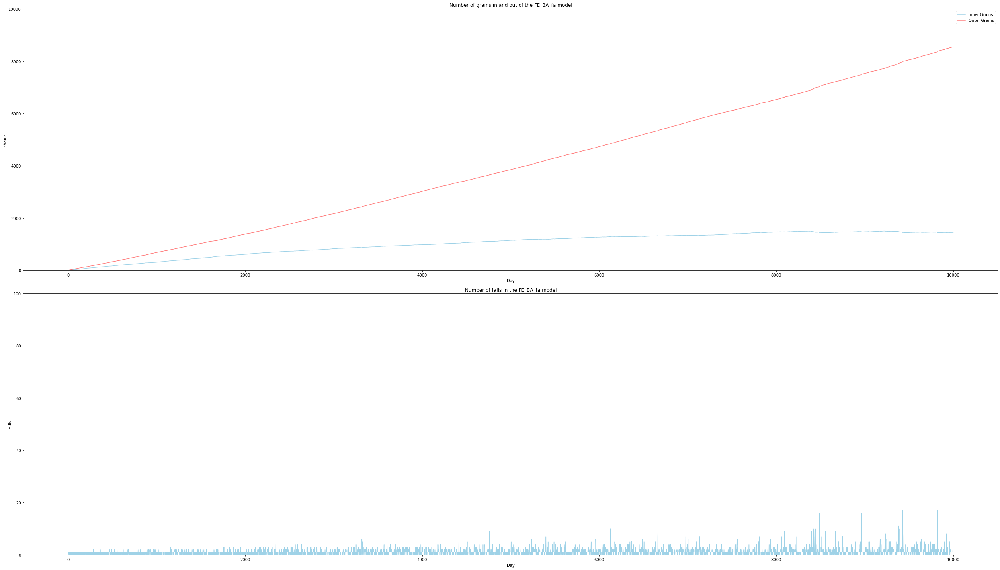

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:05<00:00, 153.59it/s]


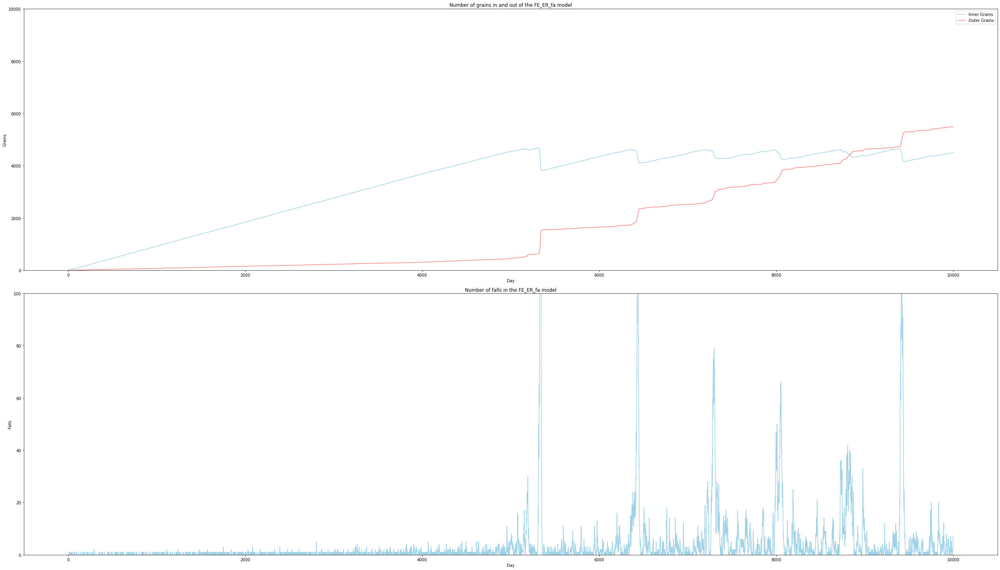

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:56<00:00, 176.42it/s]


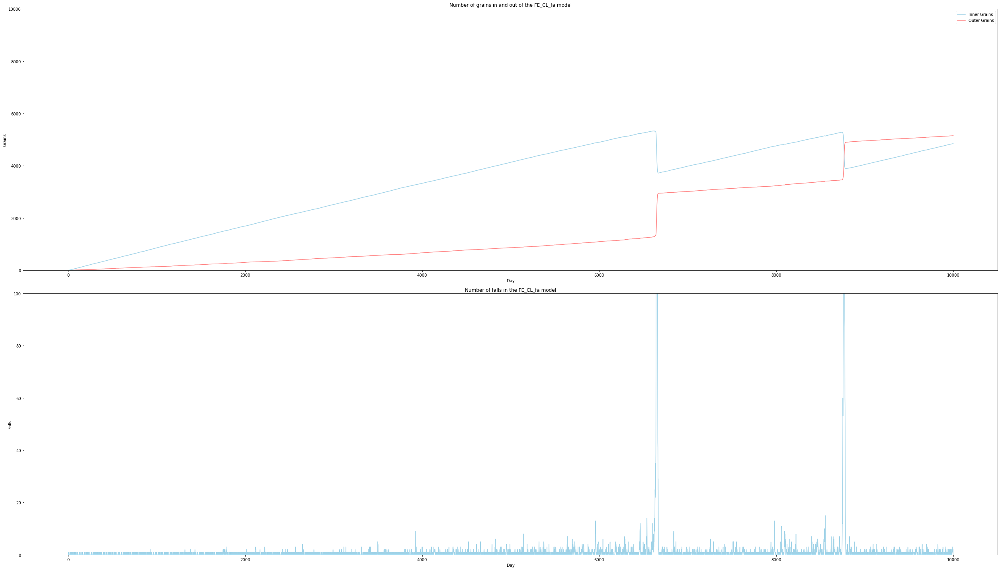

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 173.38it/s]


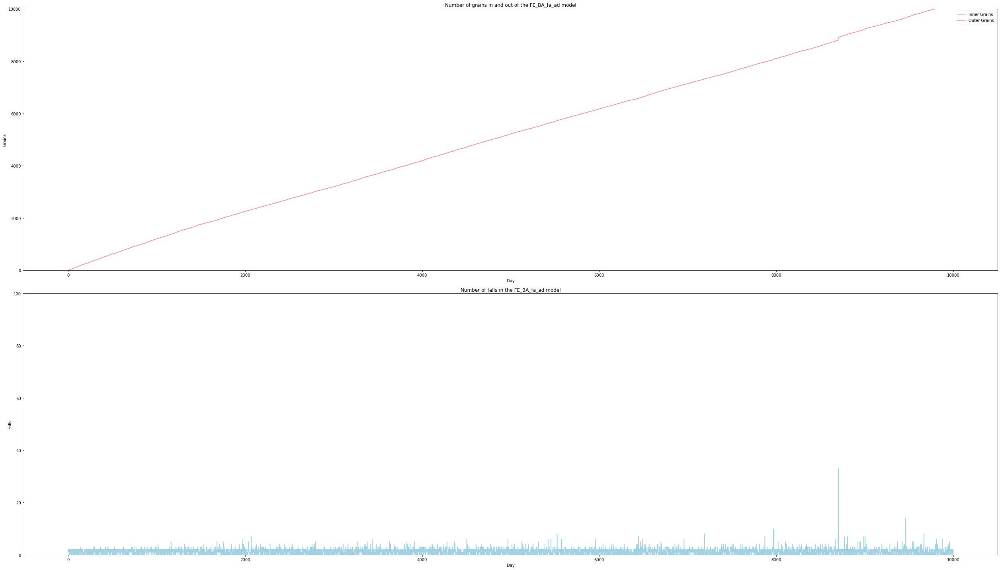

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:13<00:00, 136.23it/s]


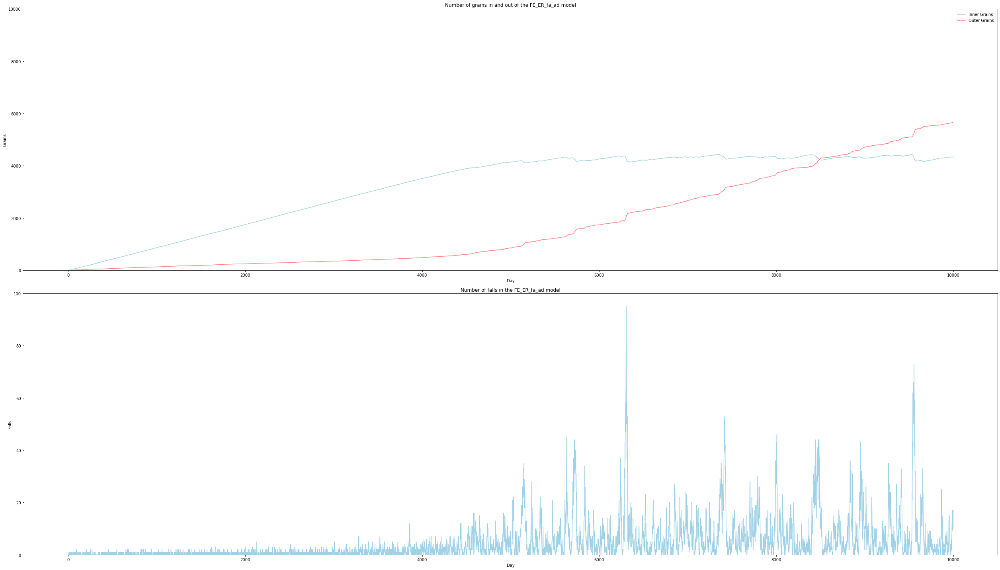

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:02<00:00, 160.38it/s]


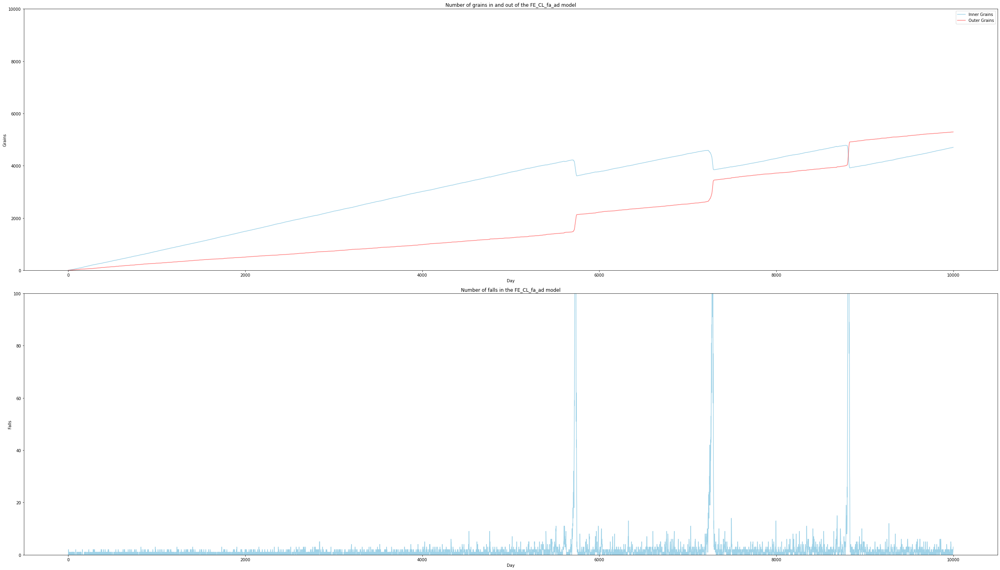

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 187.15it/s]


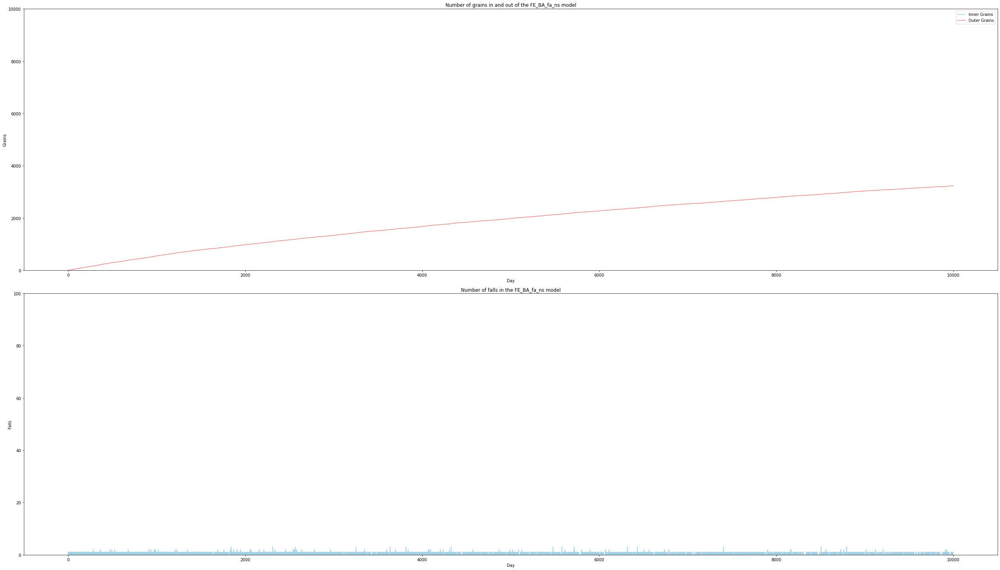

In [ ]:
spread("FE", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 179.22it/s]


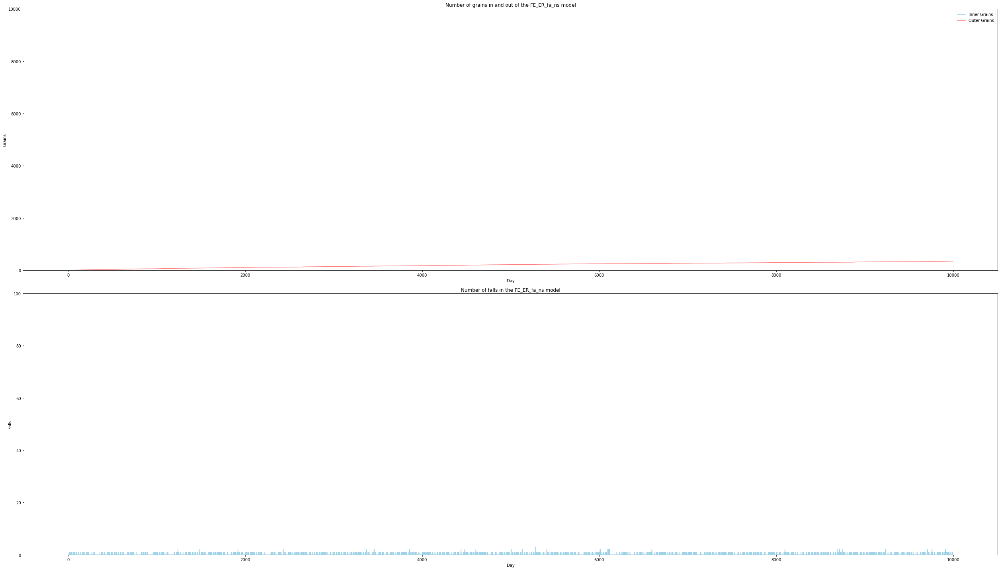

In [ ]:
spread("FE", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 186.79it/s]


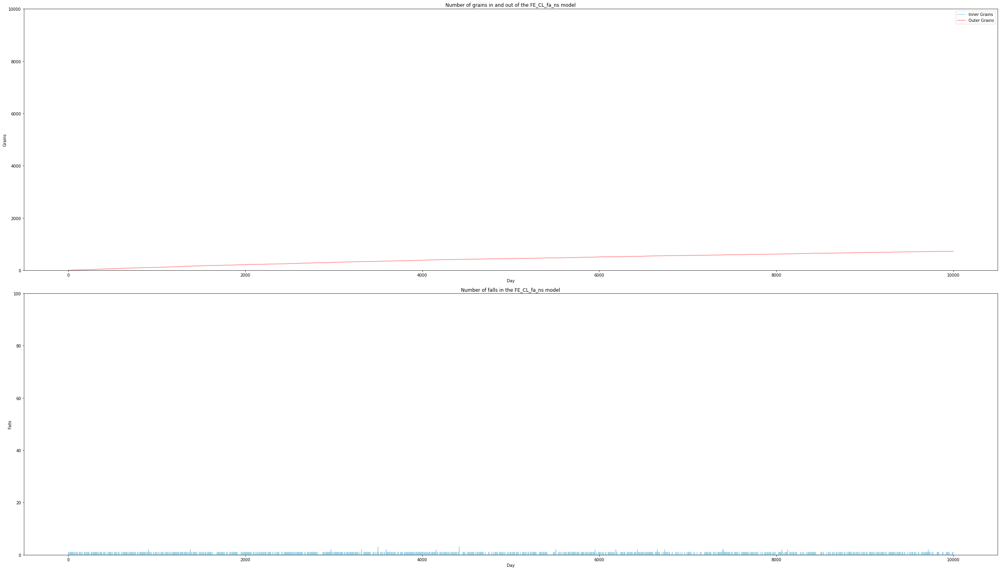

In [ ]:
spread("FE", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 187.21it/s]


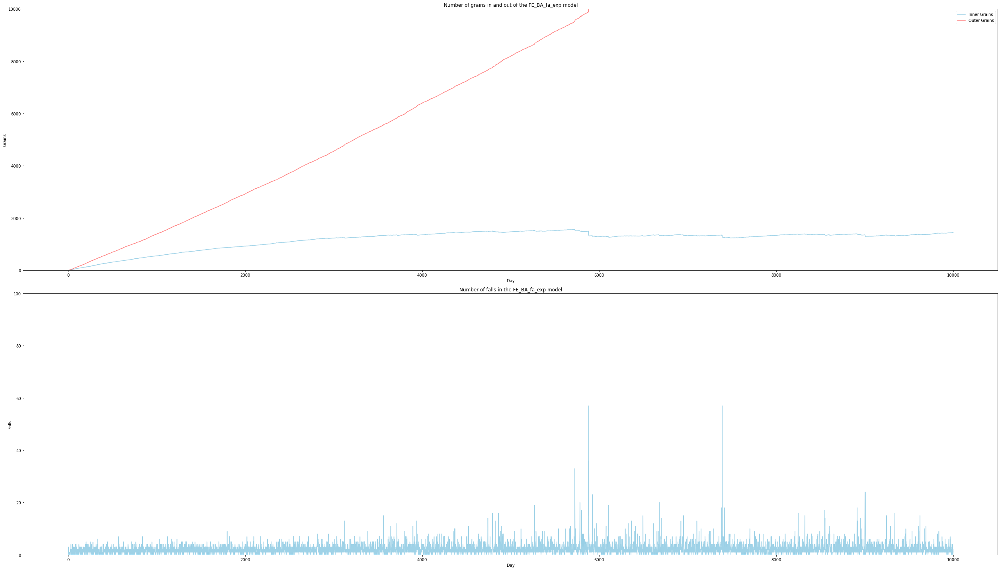

In [ ]:
spread("FE", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:23<00:00, 119.50it/s]


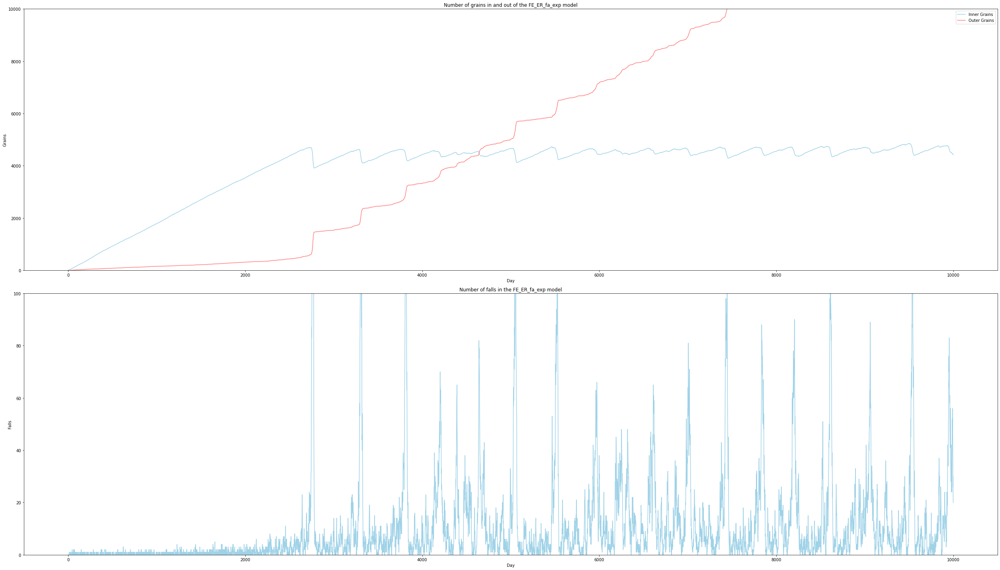

In [ ]:
spread("FE", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:12<00:00, 138.14it/s]


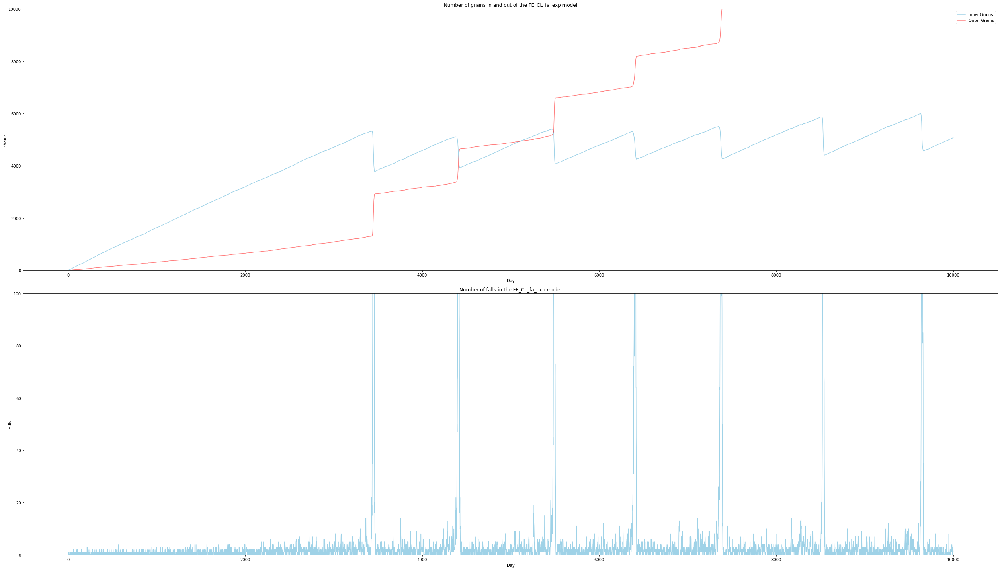

In [ ]:
spread("FE", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 187.65it/s]


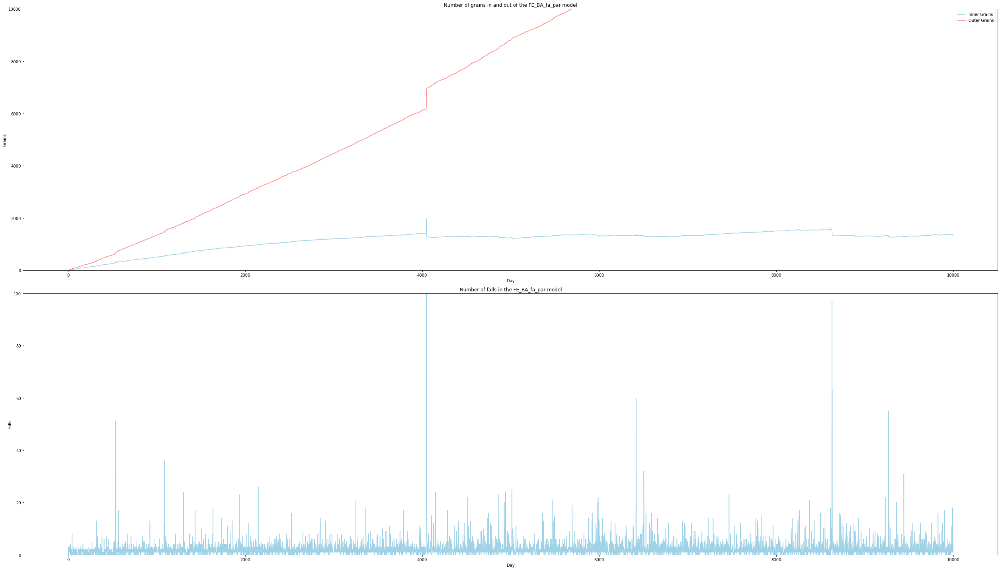

In [ ]:
spread("FE", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:27<00:00, 113.83it/s]


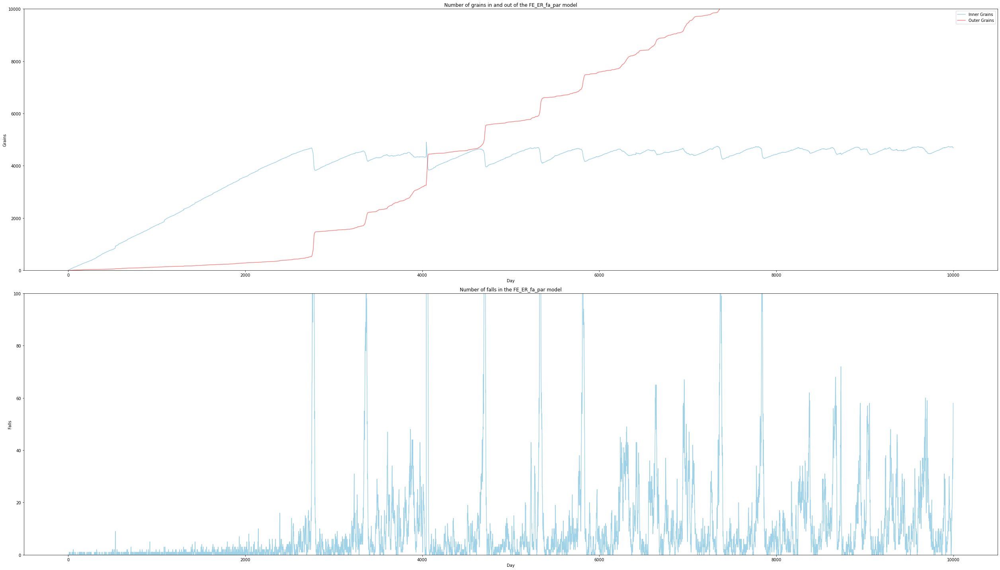

In [ ]:
spread("FE", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:13<00:00, 135.85it/s]


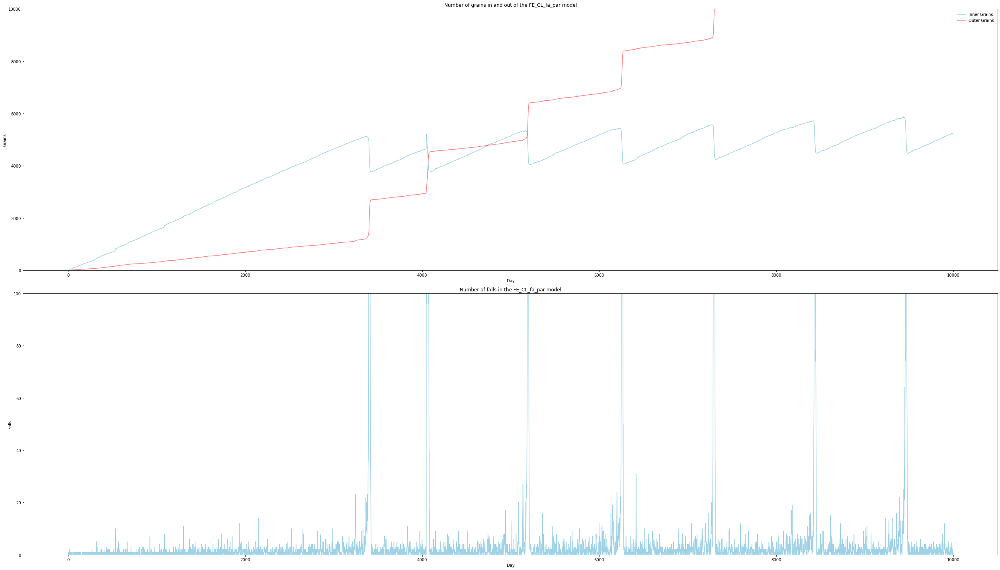

In [ ]:
spread("FE", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Stochastic Feder

#### Standart Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:47<00:00, 211.78it/s]


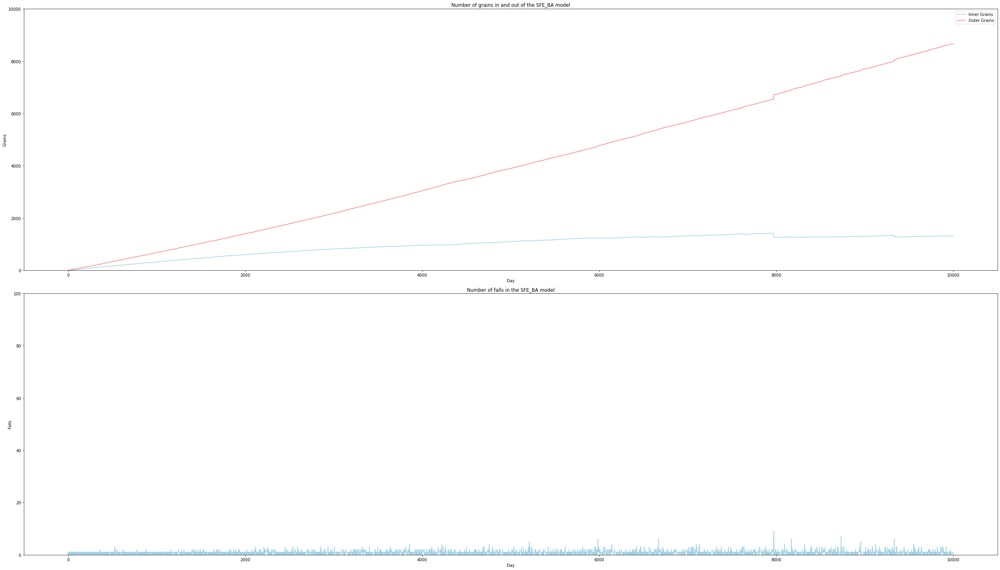

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 197.22it/s]


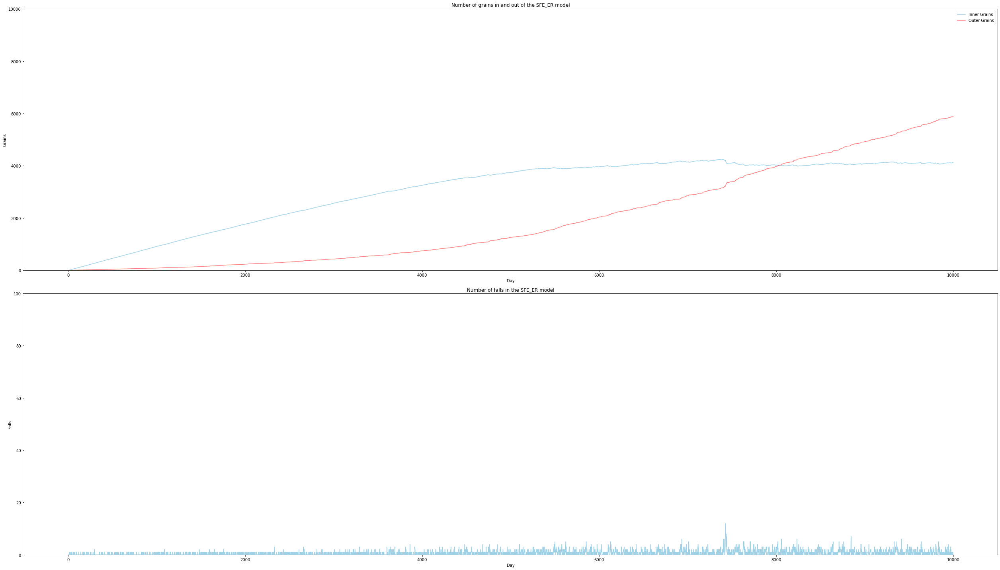

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER")

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 199.58it/s]


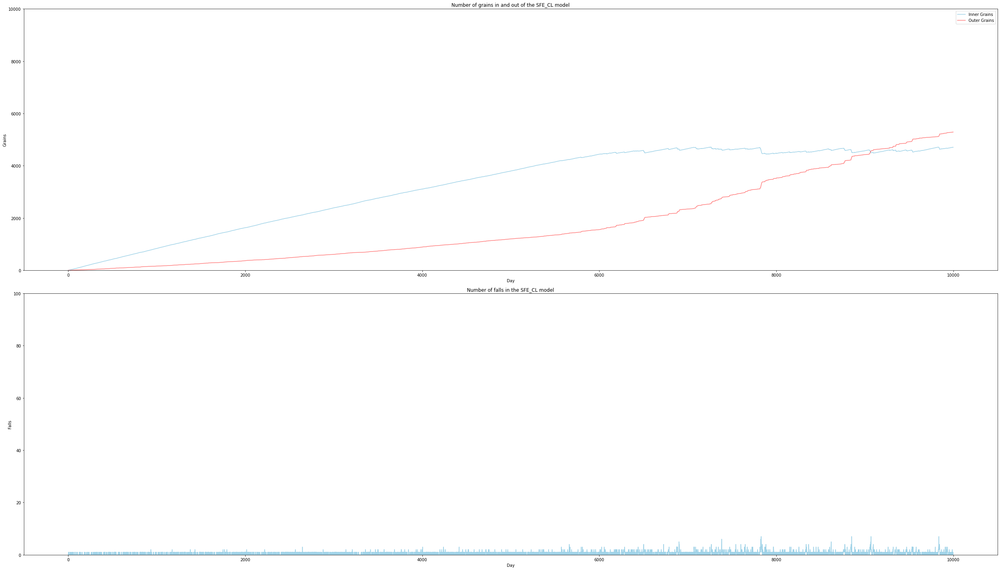

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL")

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:51<00:00, 195.14it/s]


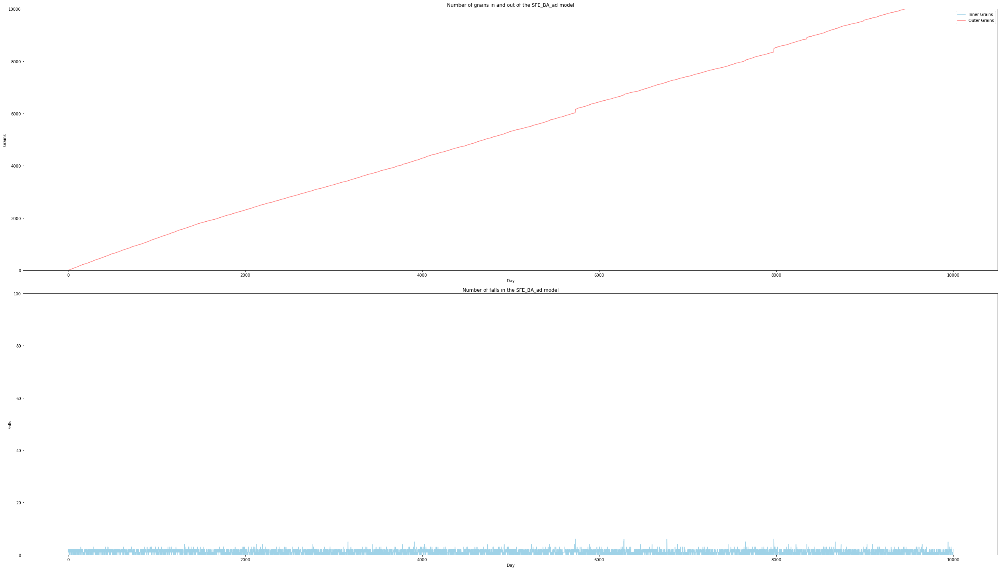

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:04<00:00, 155.92it/s]


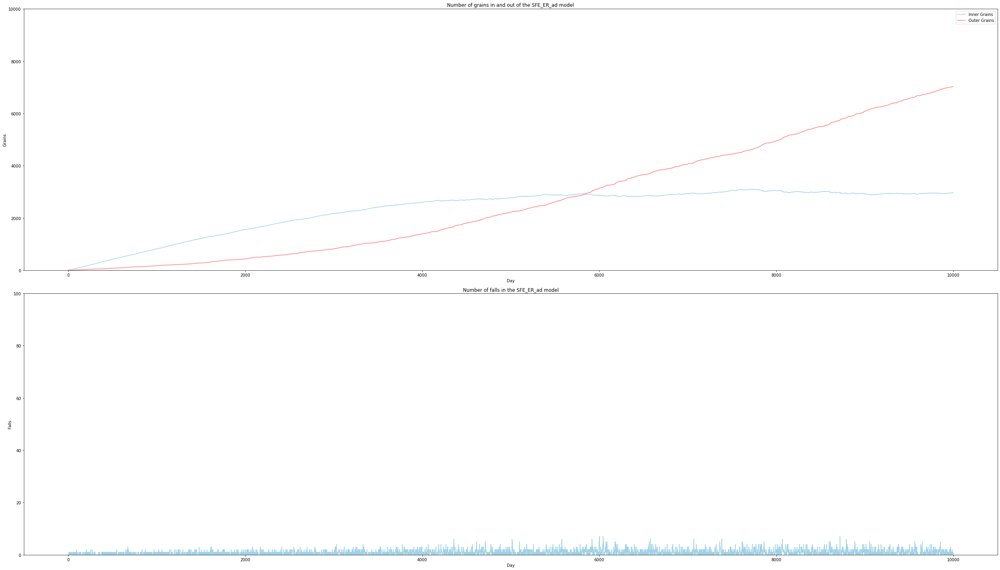

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:00<00:00, 166.42it/s]


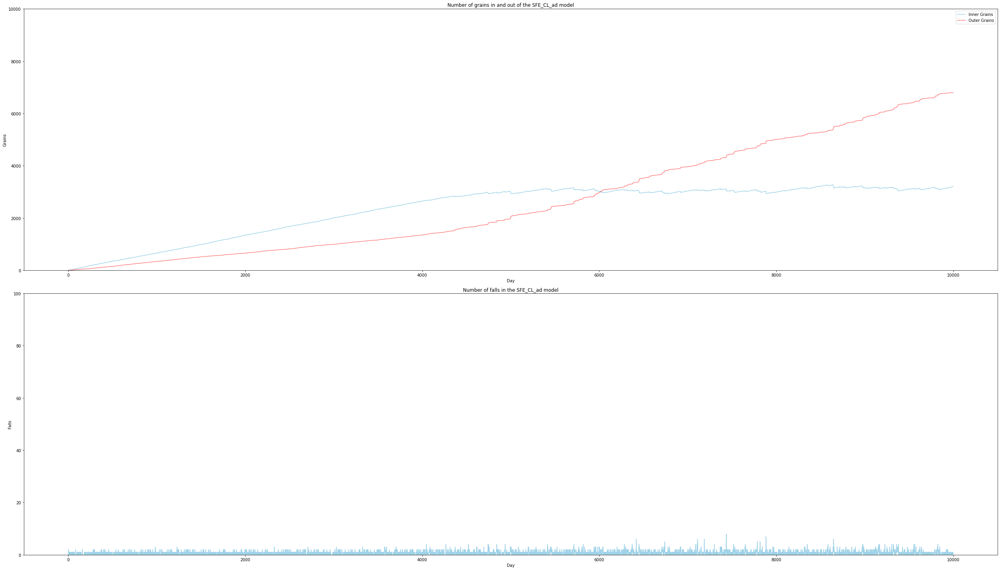

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:51<00:00, 192.38it/s]


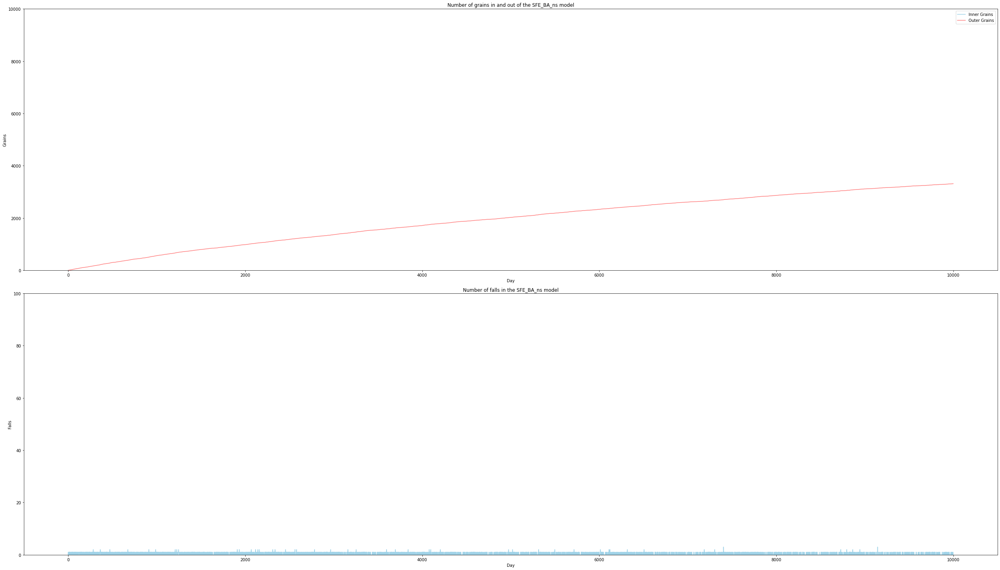

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:56<00:00, 177.37it/s]


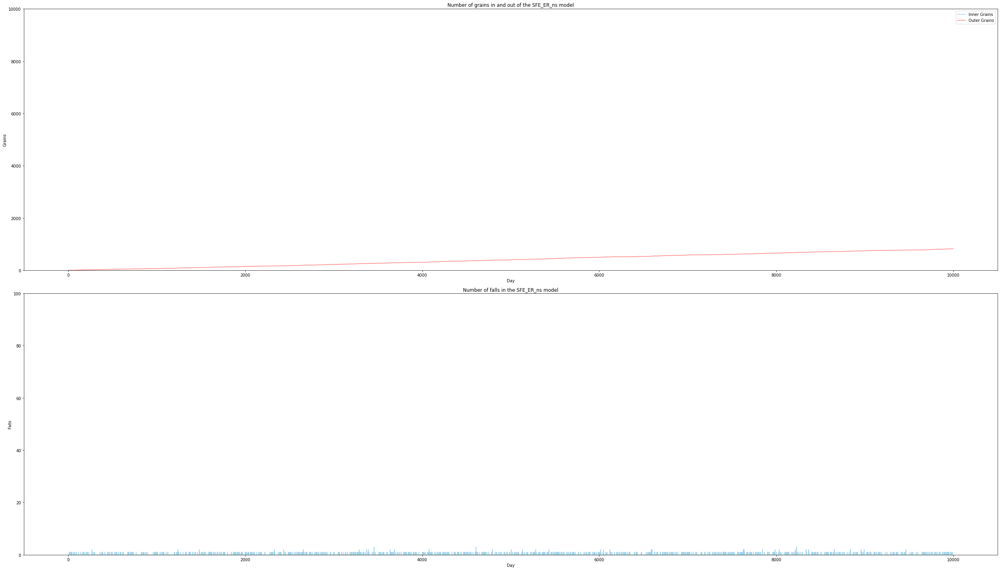

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 188.40it/s]


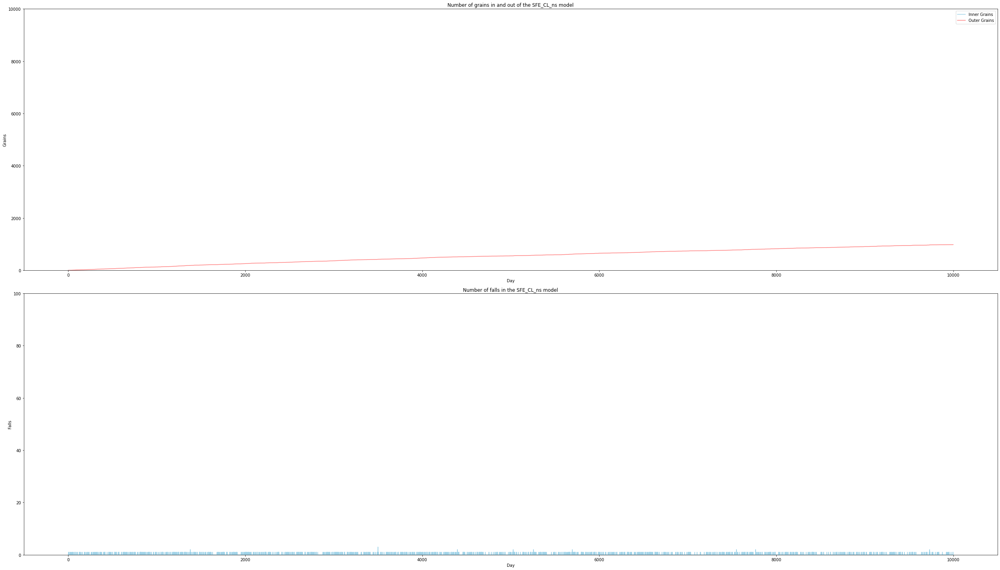

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 196.37it/s]


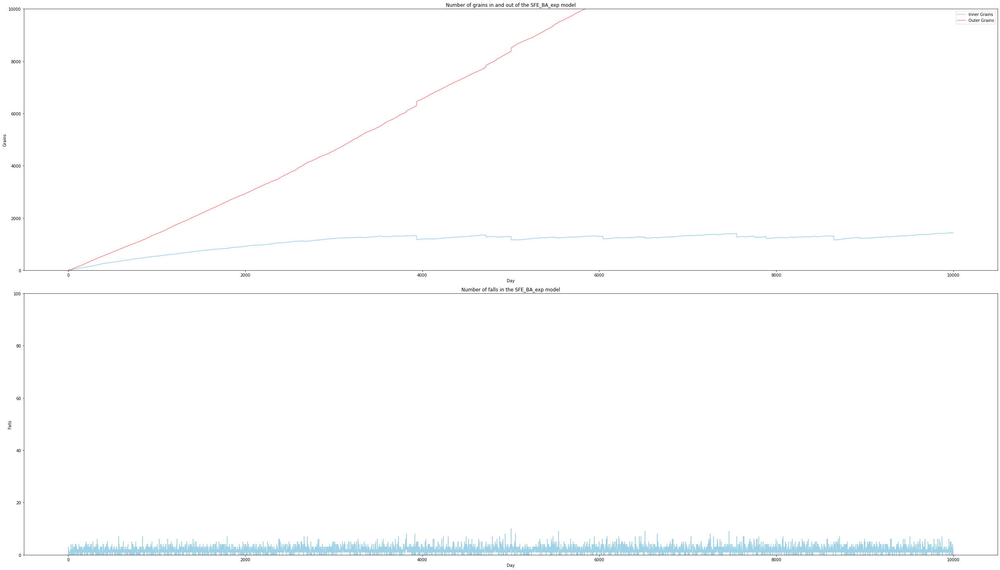

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains_exp, "BA", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 185.37it/s]


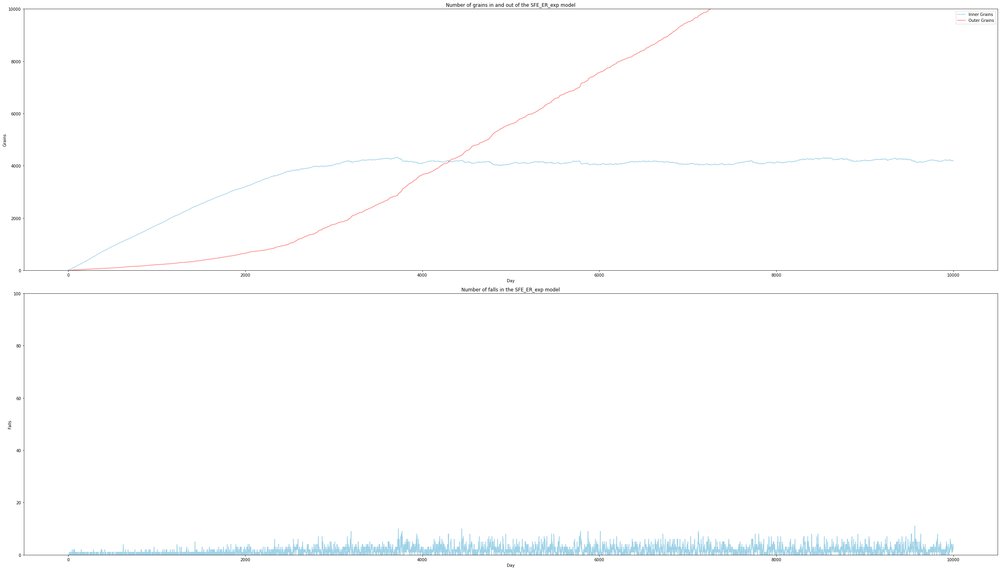

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains_exp, "ER", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 175.07it/s]


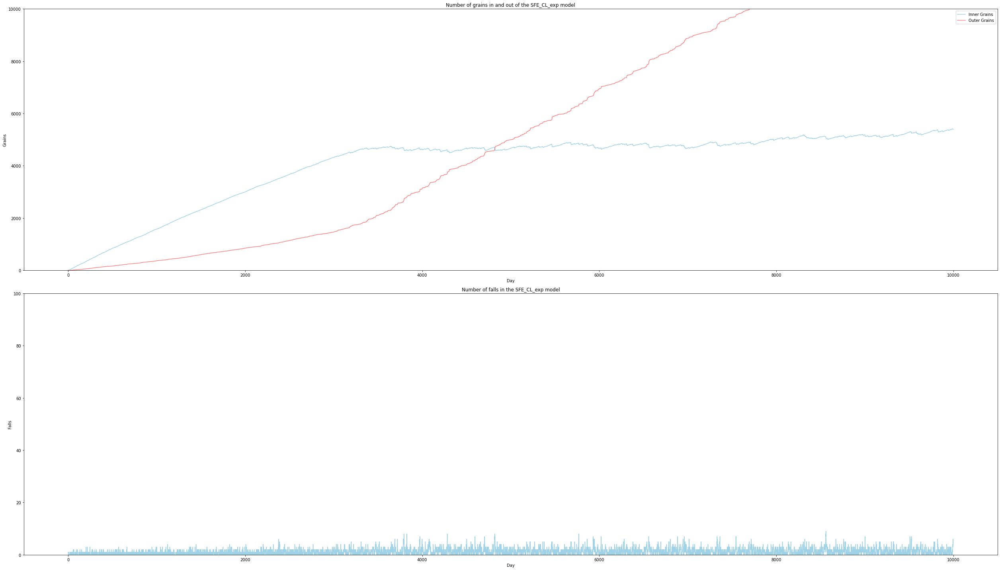

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains_exp, "CL", expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:50<00:00, 198.08it/s]


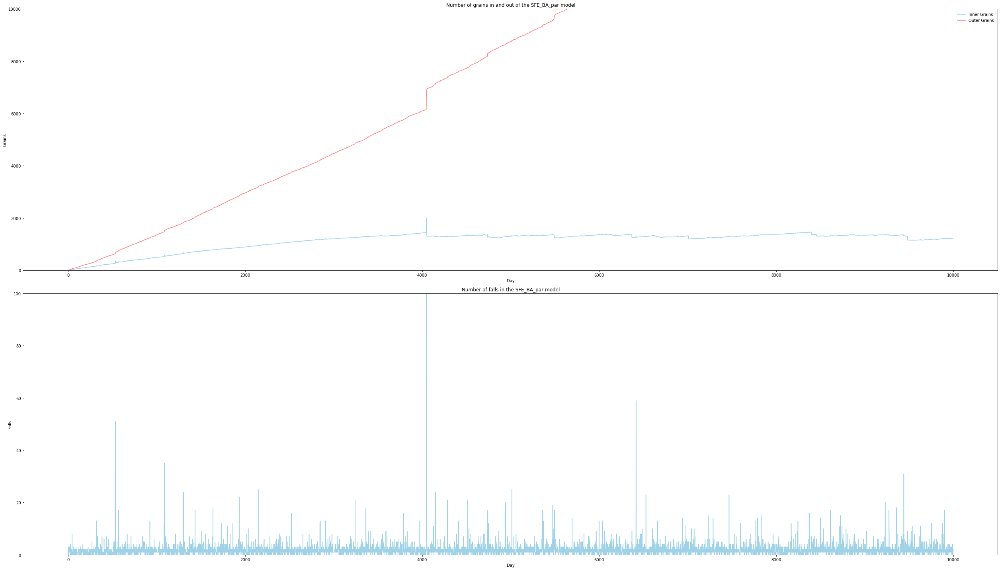

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains_par, "BA", par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:03<00:00, 157.22it/s]


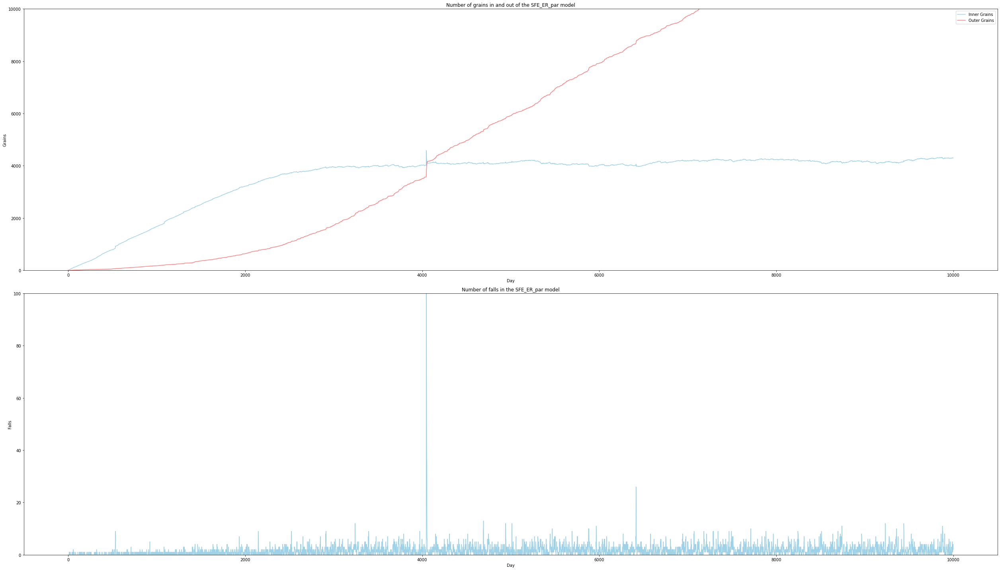

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains_par, "ER", par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 180.13it/s]


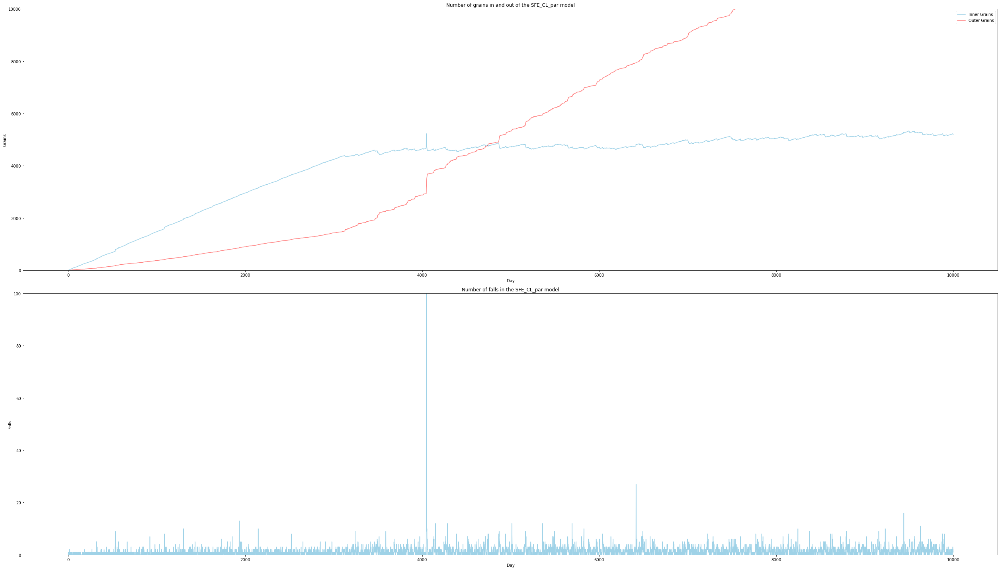

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains_par, "CL", par = True)

#### Facilitated Model

##### Standart Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:53<00:00, 186.18it/s]


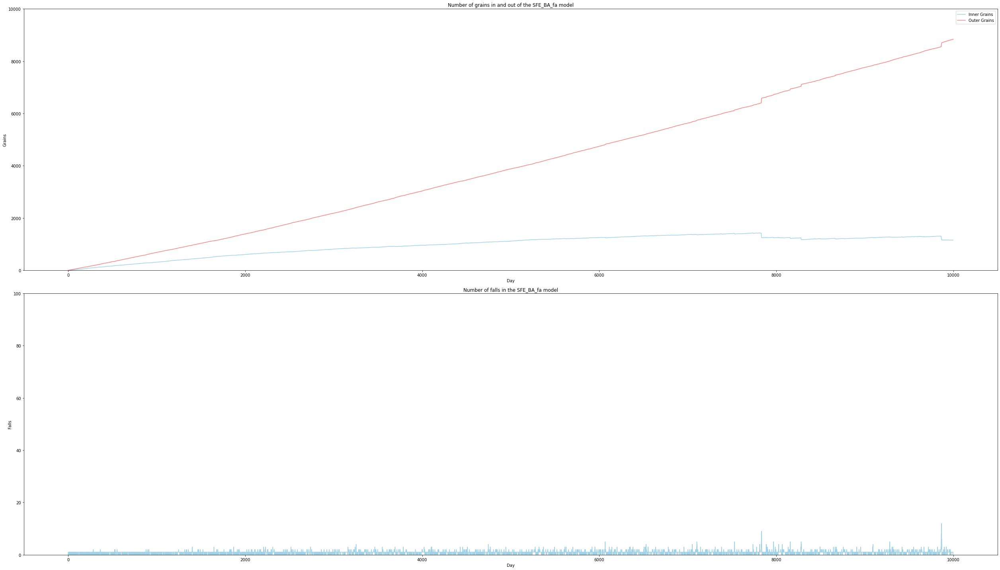

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 181.34it/s]


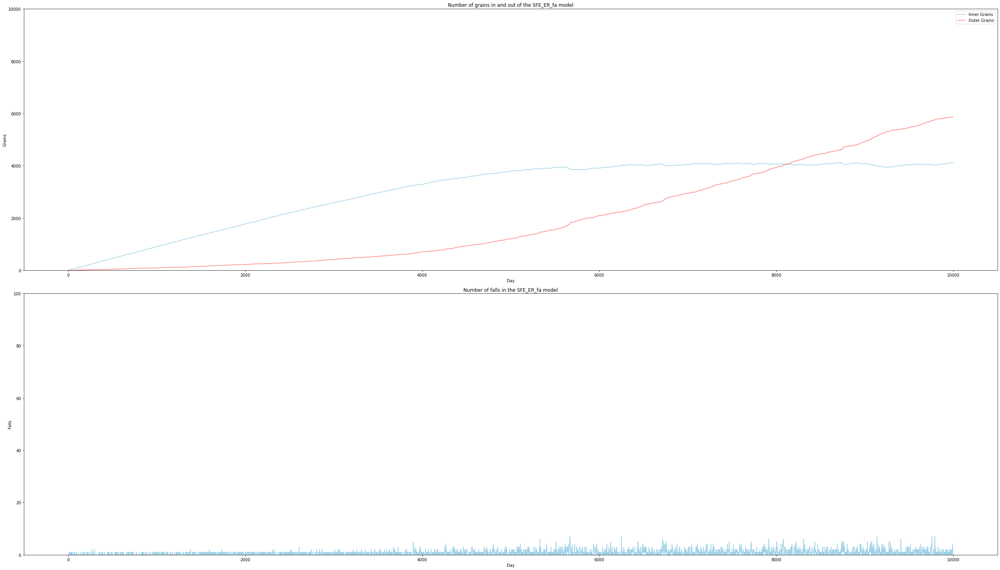

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 181.80it/s]


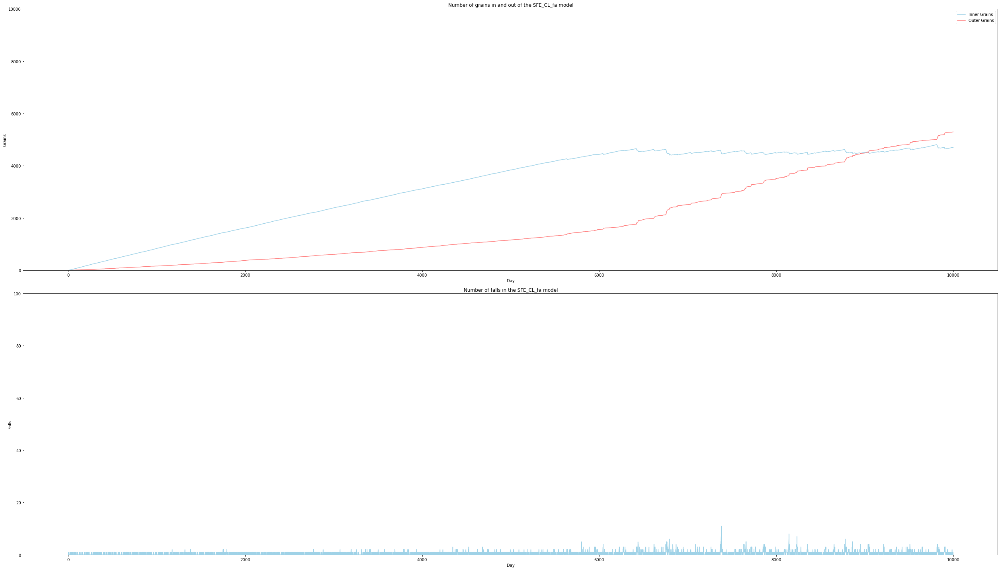

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True)

##### Additional Dissipation

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:05<00:00, 152.05it/s]


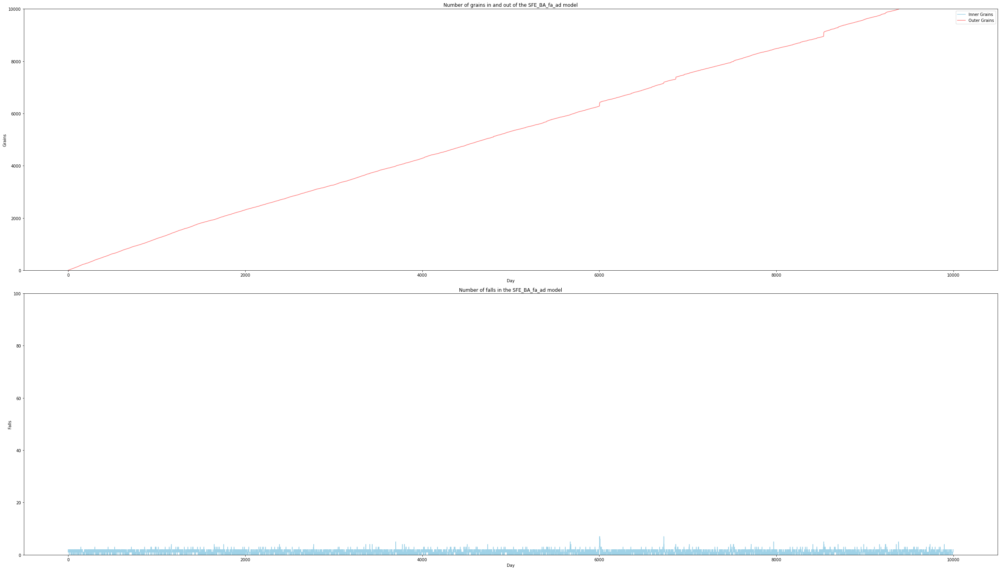

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:58<00:00, 169.66it/s]


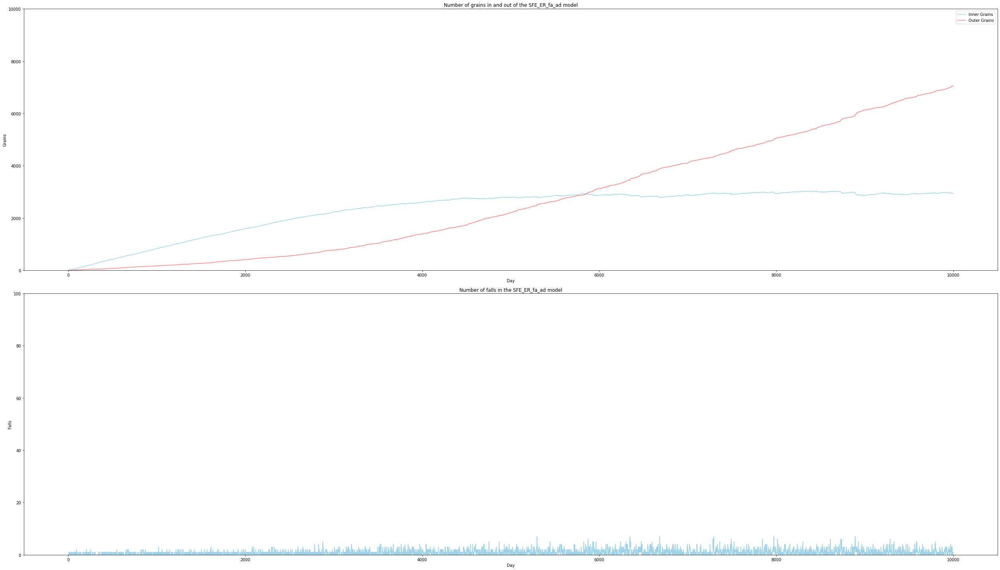

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:59<00:00, 167.47it/s]


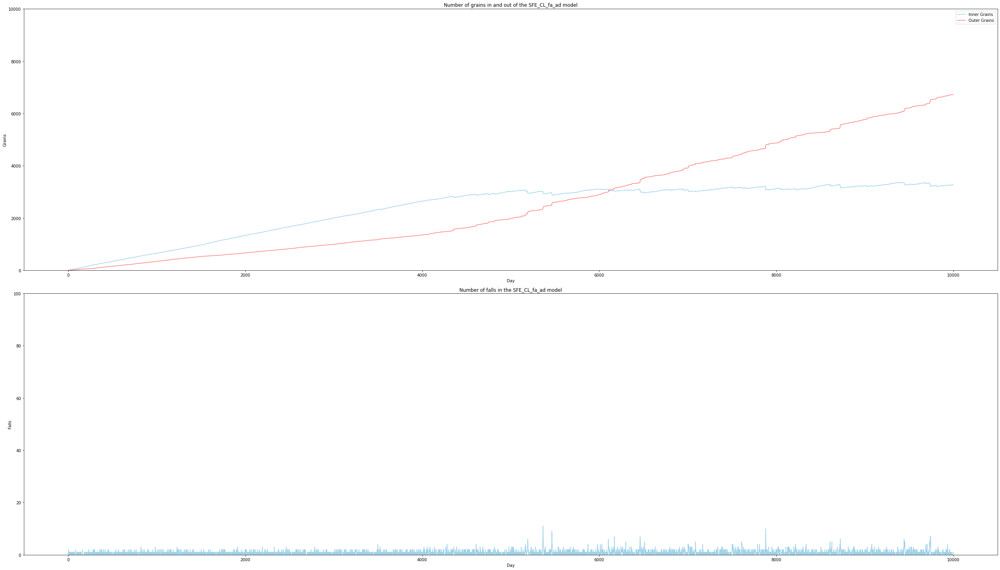

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True, ad_dissipation = True, new_grains_plus = new_grains_plus, new_grains_minus = new_grains_minus)

##### Neutral State

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 179.66it/s]


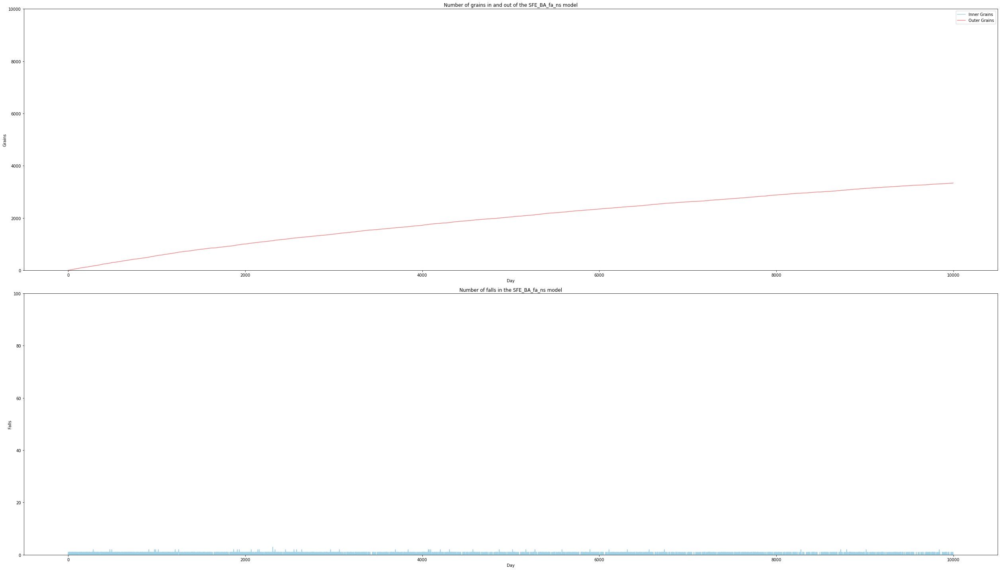

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains, "BA", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:03<00:00, 158.51it/s]


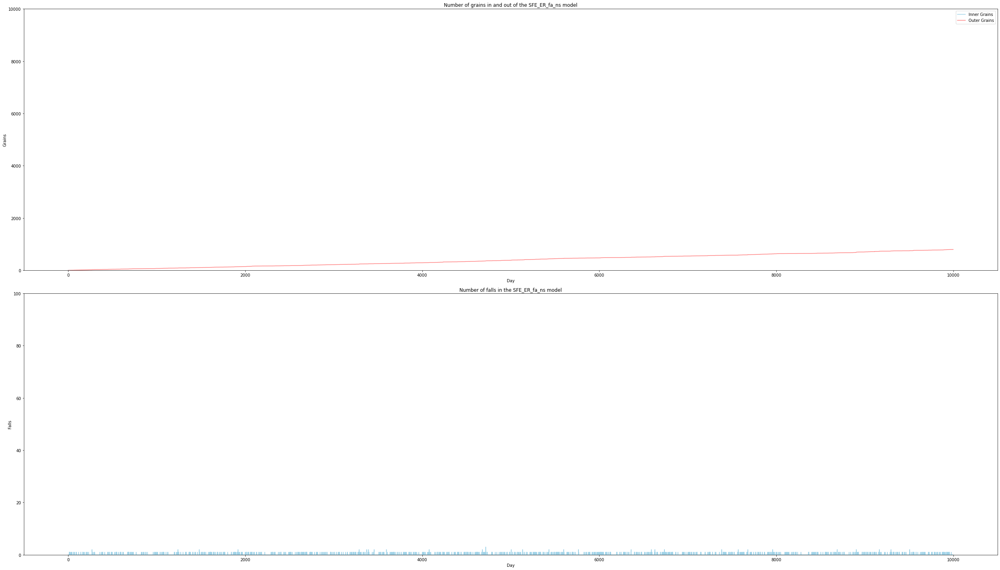

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains, "ER", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:57<00:00, 172.44it/s]


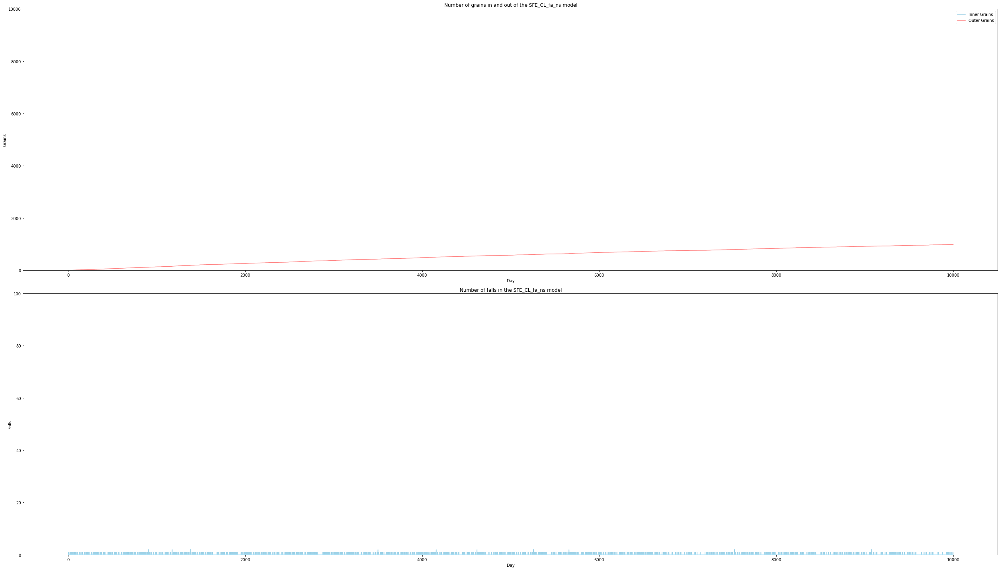

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains, "CL", facilitated = True, neutral_state = True, new_grains_minus = new_grains_minus)

##### Additional Pumping

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:02<00:00, 159.06it/s]


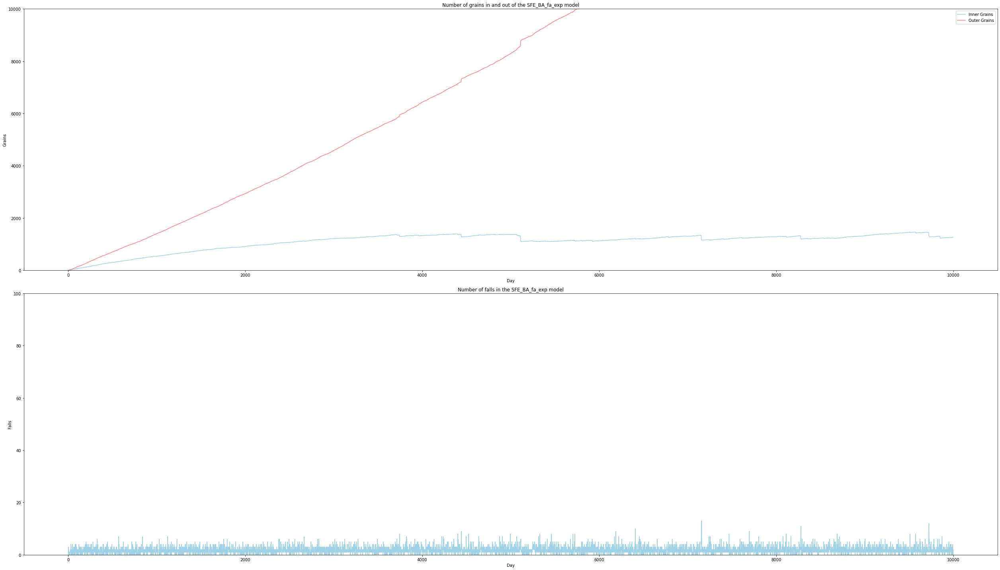

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains_exp, "BA", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:05<00:00, 152.31it/s]


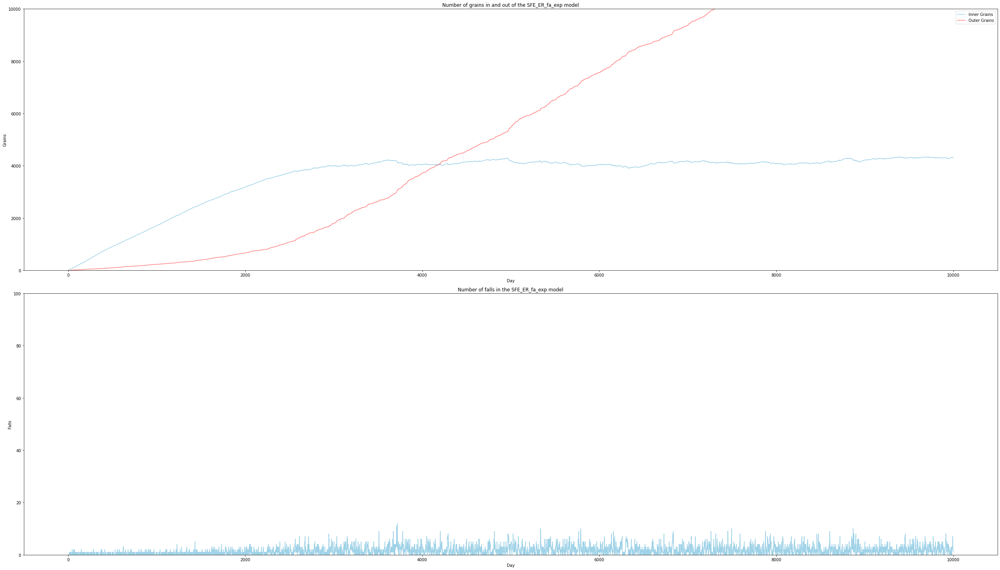

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains_exp, "ER", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:58<00:00, 170.88it/s]


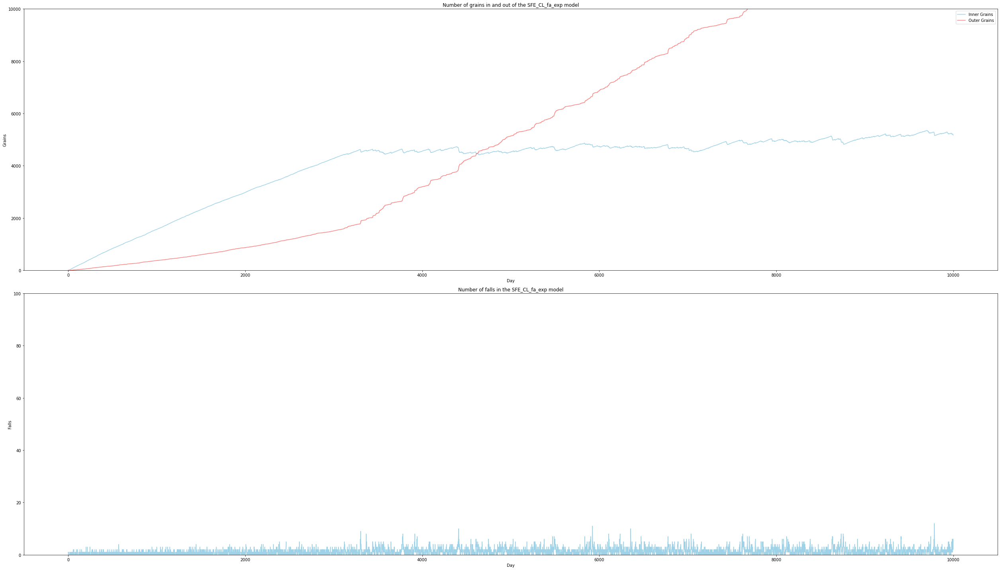

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains_exp, "CL", facilitated = True, expon = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:55<00:00, 179.07it/s]


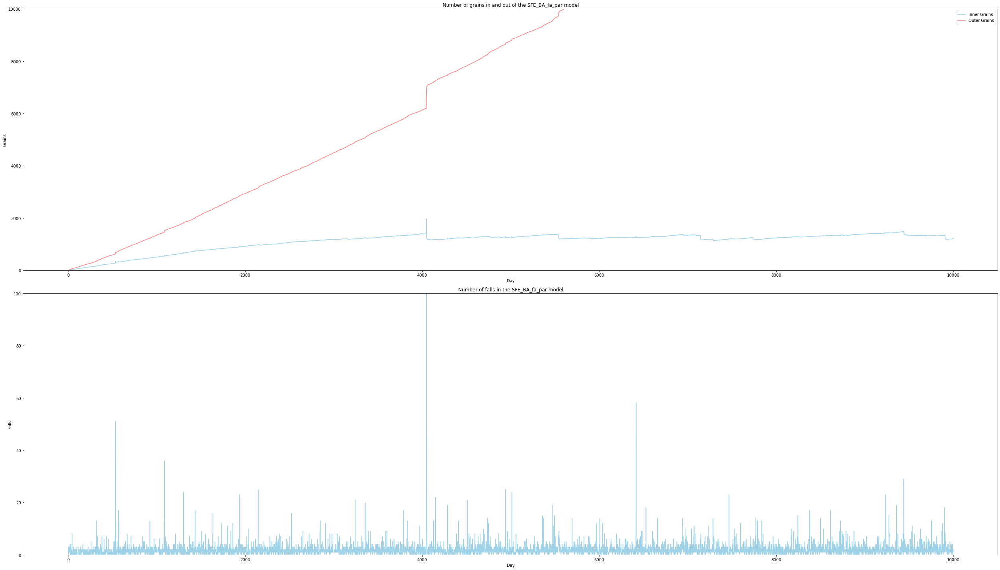

In [ ]:
spread("SFE", G_BA, number_of_days, new_grains_par, "BA", facilitated = True, par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [01:02<00:00, 158.95it/s]


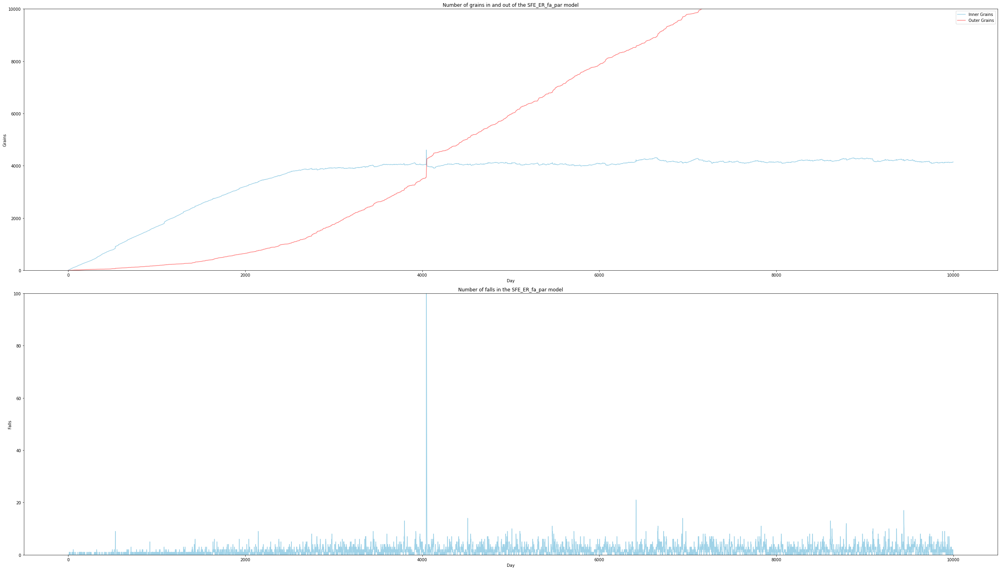

In [ ]:
spread("SFE", G_ER, number_of_days, new_grains_par, "ER", facilitated = True, par = True)

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:58<00:00, 172.32it/s]


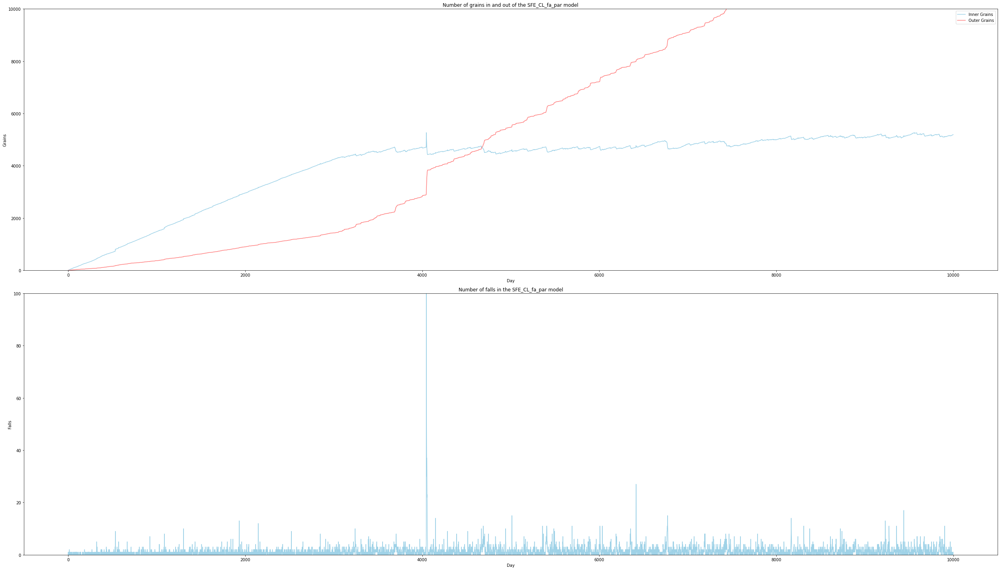

In [ ]:
spread("SFE", G_CL, number_of_days, new_grains_par, "CL", facilitated = True, par = True)

### Graph statistics

#### Plotting function

In [ ]:
# Plotting

def k_distrib(graph, graph_type = None, scale='lin', colour='#40a6d1', alpha=.8, fit_line=False, expct_lo=1, expct_hi=10, expct_const=1):
    
    plt.close()
    num_nodes = graph.number_of_nodes()
    max_degree = 0
    
    # Calculate the maximum degree to know the range of x-axis
    for n in graph.nodes():
        if graph.degree(n) > max_degree:
            max_degree = graph.degree(n)
    
    # X-axis and y-axis values
    x = []
    y_tmp = []
    
    # Loop over all degrees until the maximum to compute the portion of nodes for that degree
    for i in range(max_degree + 1):
        x.append(i)
        y_tmp.append(0)
        for n in graph.nodes():
            if graph.degree(n) == i:
                y_tmp[i] += 1
        y = [i / num_nodes for i in y_tmp]
    
    if graph_type != None:  
      with open('degrees_' + graph_type + '.csv', 'w') as myfile:
        wr = csv.writer(myfile, delimiter=',')
        wr.writerow(y_tmp)
    
    # Check for the lin / log parameter and set axes scale
    if scale == 'log':
        plt.figure(figsize=(10, 8))
        plt.xscale('log')
        plt.yscale('log')
        plt.title('Degree distribution (log-log scale)')
        plt.ylabel('log(P(k))')
        plt.xlabel('log(k)')
        plt.plot(x, y, linewidth = 0, marker = 'o', markersize = 8, color = colour, alpha = alpha)
        
        if fit_line:
            # Add theoretical distribution line k^-3
            # Note that you need to parametrize it manually
            w = [a for a in range(expct_lo,expct_hi)]
            z = []
            for i in w:
                x = (i**-3) * expct_const # set line's length and fit intercept
                z.append(x)

            plt.plot(w, z, 'k-', color='#7f7f7f')
            
    else:
        plt.figure(figsize=(10, 8))
        plt.plot(x, y, linewidth = 0, marker = 'o', markersize = 8, color = colour, alpha = alpha)
        plt.title('Degree distribution (linear scale)')
        plt.ylabel('P(k)')
        plt.xlabel('k')

    plt.show()

#### Barabasi-Albert

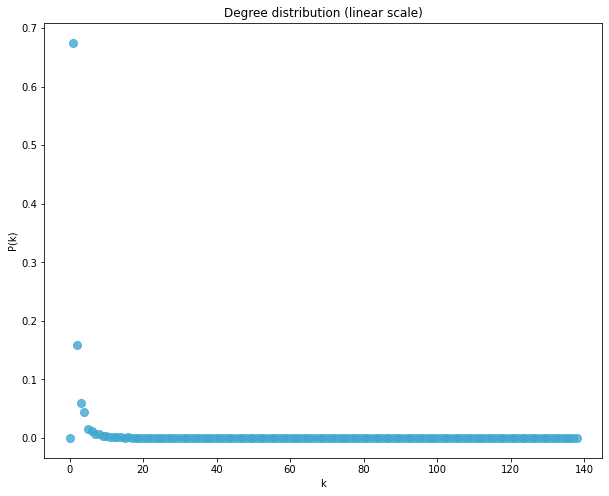

In [ ]:
k_distrib(G_BA, "BA")

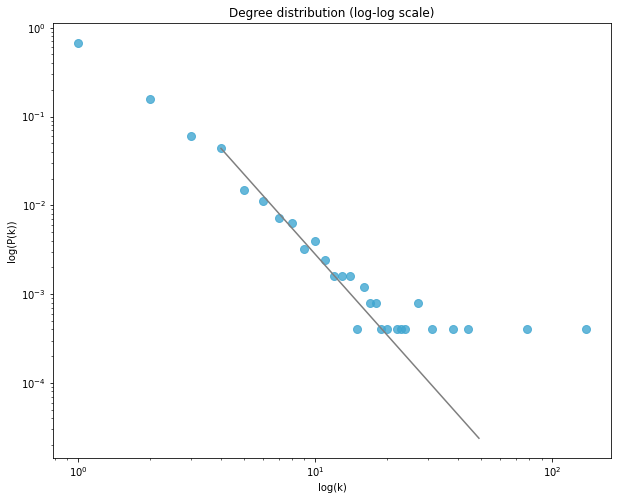

In [ ]:
k_distrib(G_BA, scale = 'log', fit_line = True, expct_lo=4, expct_hi=50, expct_const=2.8)

#### Erdos-Renyi

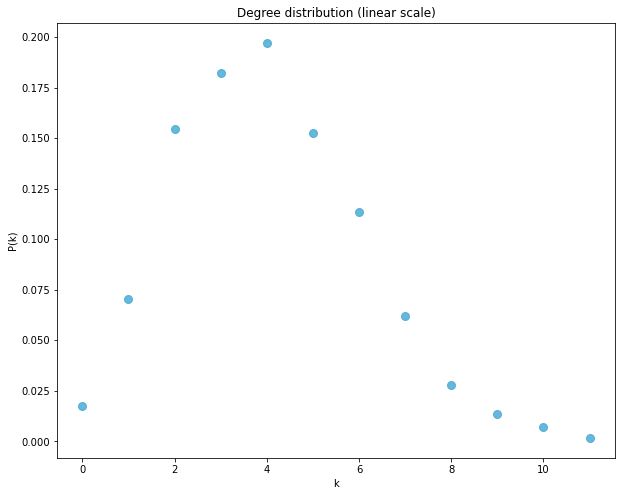

In [ ]:
k_distrib(G_ER, "ER")

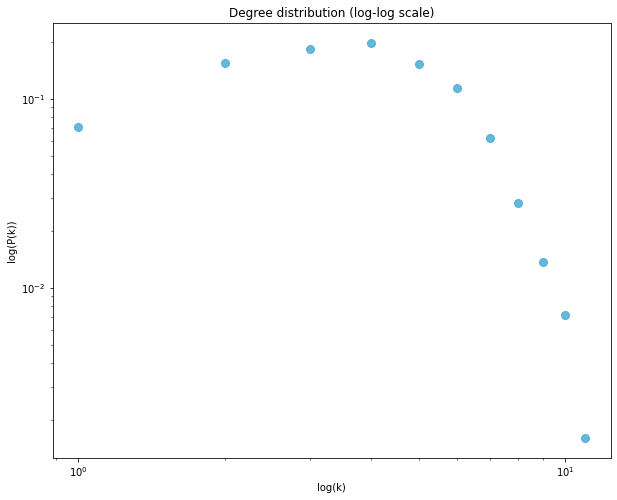

In [ ]:
k_distrib(G_ER, scale = 'log', fit_line = False, expct_lo=4, expct_hi=50, expct_const=2.8)

#### Chung-Lu

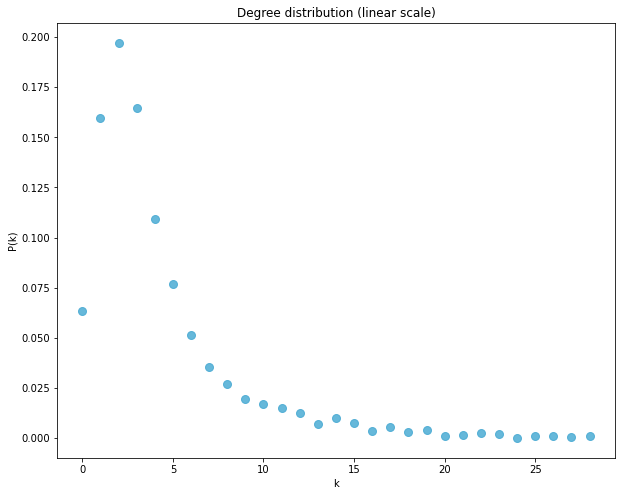

In [ ]:
k_distrib(G_CL, "CL")

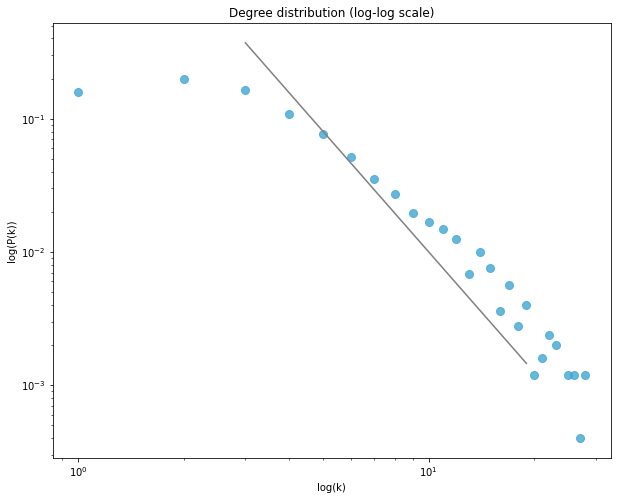

In [ ]:
k_distrib(G_CL, scale = 'log', fit_line = True, expct_lo=3, expct_hi=20, expct_const=10)